In [2]:
import numpy as np
import tensorflow as tf
import json
from datetime import datetime
import os
import sys
sys.path.append('../')
import retriever
from tabulate import tabulate
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline  

In [3]:
trainset_file = '../data/training/order_train_data.bin'
testset_file = '../data/training/order_test_data.bin'
vocab_file =  '../data/metadata/w2v_vocab.json'
params_dir_tmp = '../data/training/models/All/'
embed_path =  '../data/metadata/w2v.bin'

<h3>Each entry in this list has the following structure:</h3>
<ul>
<li>entry[0]: query indexes </li>
<li>entry[1:n]: n items where each item is [bounding box vector, bounding box spaital features]. Note that different enteries might have different number of possible  bounding boxes (i.e. different n) </li>
<li>entry[n+1]: integer, entry[ 1 + entry[n+1]] is the ture bbox </li>
</ul>

In [4]:
trainset = np.load(open(trainset_file, 'rb'))
print('Train set batches #:', len(trainset))
print('Train batch size:', len(trainset[0]))
print('Train set data size:', len(trainset)*len(trainset[0]))

testset = np.load(open(testset_file, 'rb'))
print('Test set batches #:', len(trainset))
print('Test Batch size:', len(trainset[0]))
print('Test set data size:', len(trainset)*len(trainset[0]))


with open(vocab_file, 'r') as f:
    vocab = json.loads(f.read())
vocab['<unk>'] = len(vocab)

print("Number of words:", len(vocab))

Train set batches #: 297
Train batch size: 200
Train set data size: 59400
Test set batches #: 297
Test Batch size: 200
Test set data size: 59400
Number of words: 8242


In [5]:
# w2c words vectors
embed_vecs = np.load(open(embed_path, 'rb')).astype(np.float32)

<h3> augment_data function </h3>
<br>We try sevral regularization methods. One of the things I've tried is to add data points where for each data I pick a query from a random data point and a set of bbox from a different random point. We build the labels (bboxes) distribution by giving an equal probability to each label. <br><br>
The augment_data function does just that but the label of each added poind is writen as -1*number of bboxes. When we build the batch it self (function build_data in class Model), if we see a negative label index, we know its an added point and we know the number of bboxes so we can build the correct distribution.  

In [5]:
def augment_data(data, ratio=0.5, addNoise=False):
        '''
        The function add data points. 
        We pick a query from a random data point,
        and a set of bbox from a different random point and we join them
        to build a new data point. The label distribution of the new data point will 
        uniform, that is, all labels will have equal probability. 
        
        
        Params:
            data: a list of data entries
                                                
        Returns: a list of augmented data
            
                        
        '''
                          
        q_idx = np.random.choice(range(len(data)), int(len(data)*ratio), replace=False)
        im_idx = np.random.choice([i for i in range(len(data)) if i not in q_idx], int(len(data)*ratio))
        for i in range(len(q_idx)):
            q, im = data[q_idx[i]][0], data[im_idx[i]][1:-1]
            item = [q]
            for im_tmp in im:
                item.append(im_tmp)
            item.append(-len(im))
            data.append(item)

In [6]:
def stats(test, train, ephocs=100, title=None, params=[50, 100, 150, 200]):
    '''
    Plot metrics graphs and print some stats.
    
    Params:
        test: list. 
              Each item is a tuple, [test accuracy, test IOU, test loss]
        
        train: list. 
               Each item is a tuple, [train accuracy, train IOU, train loss, 0]
               For now we can ignore the last part in the tuple (zero)
               
        params: The hyper-parameters to iterate over, defult to number of rnn's hidden units.
    '''
    
    ephocs = range(ephocs)
    test_res = np.array(test)
    train_res = np.array(train)
    test_Glabels = ['test accuracy', 'test IOU', 'test loss']
    train_Glabels = ['train accuracy', 'train IOU', 'train loss']

    for j, param in enumerate(params):
        for i in range(len(train_Glabels)):
            plt.plot(ephocs, test_res[j][:,i])
            plt.plot(ephocs, train_res[j][:,i])
            plt.legend([test_Glabels[i], train_Glabels[i]], loc='upper left')
            if title is not None:
                plt.title('%s: %0.3f'%(title, param))
            plt.show()

            metric = ''.join(train_Glabels[i][len('train')+1:])
            if metric=='loss':
                print('Train min %s:%.3f'%(metric, min(train_res[j][:,i])))
                print('Test min %s:%.3f'%(metric, min(test_res[j][:,i])))
            else:
                print('Train max %s:%.3f'%(metric, max(train_res[j][:,i])))
                print('Test max %s:%.3f'%(metric, max(test_res[j][:,i])))
        print('-'*100,'\n')

# ALSTM

After running B with no edited words we use this RNN cell which has two LSTM cells, Bcell (for player B) and Acell (for Player A). If is Edit is False, we just run B's cell else it works as follow:
<ol> 
<li>We run B's cells with the true query input word, getting the un-edited state. If use_worsAttn=True we add attention on the images vectors for each word.</li>
<li>We run B's cells with the edited input word - a normal noise with the same mean and std as the original word, getting the edited state. If use_worsAttn=True we add attention on the images vectors for each word.</li>
<li>A uses attention mechanism over all B's outputs on the unedited words (which we got before using this cell).</li>
<li>A's input are:
<ul><li>B's unedited state</li><li>The reward for editing a word</li><li>B's loss having no edited words.</li></ul></li>
<br><li>A's output is then goes throw a transformation which yields two values, one for editing a word and another for not:
<ul>
    <li>With probability of editRandomlyProb we ignore A and decide whether to edit or not with probability of rnn_editProb</li>
    <li>With probability of 1-editRandomlyProb A chooses an action: edit only if the value for edit the word is higher (i.e. we pass B's edited state to the next time step), else we pass B's unedited state.</li></ul>.</li>
</ol>

In [7]:
class ALSTM(tf.nn.rnn_cell.LSTMCell):
    def __init__(self, 
                 batch_size, 
                 num_units, 
                 
                 # Size of A's attention vector.
                 words_attn_dim, 
                 # B's outputs (for each time step).
                 words_attn_states, 
                 
                 # Inicates whether attention vector is a padding (0) or not (1).
                 words_attn_idx, 
                 
                 # Size of B's attention vector ([image vector, spital features] size) .
                 img_attn_dim, 
                 # B's outputs (for each time step).
                 img_attn_states, 
                 
                 
                 # Inicates whether attentionvec is a padding (0) or not (1).
                 img_attn_idx, 
                 
                 unk, #'unk' word vector
                 
                 # Probabilty for choosing an action (edit or not) randomly, 
                 editRandomlyProb, 
                 # Probabilty for edit a word in rnn, when decision are taken randomly.
                 rnn_editProb, 
                 
                 
                 # Whehter to edit the query or not.
                 isEdit, 
                 
                 # Whether B uses words levlel attention or not.
                 use_wordAttn,
                 
                 # If isIDX is True then use the decisions in set_actions.
                 isIDX,
                 set_actions=None,
                 
                 
                 # Word vector size 
                 word_size=100,
                 
                 
                 # Dropout ratio for rnn's inputs and outpouts
                 dropout_in=1.,
                 dropout_out=1.,
                 
                 # This holds A's rewards and B's losses to
                 # be add to A's feature vectors.
                 reward_loss=None,
                 state_is_tuple=True):
        
        
        # When useing A, the cell state will contain the concatenation 
        # of both B and A states. Therefore we set the unit number to be
        # 2*(A and B unit size).
        super().__init__(2*num_units+1, state_is_tuple=state_is_tuple)
    
        self.words_attn_states = words_attn_states
        self.words_attn_idx = words_attn_idx
        self.words_attn_dim = words_attn_dim
        
        self.img_attn_states = img_attn_states
        self.img_attn_idx = img_attn_idx
        self.img_attn_dim = img_attn_dim
        
        self.num_units = num_units
        self.batch_size = batch_size
        self.unk = unk 
        self.isEdit = isEdit
        self.use_wordAttn=use_wordAttn
        
        self.Acell = tf.contrib.rnn.DropoutWrapper(
            tf.nn.rnn_cell.LSTMCell(self.num_units, state_is_tuple=True), 
            input_keep_prob=dropout_in, 
            output_keep_prob=dropout_out
        )
      
        # To avoide using dropout twice on the same input, if isEdit is true
        # Bcell will only use dropout for its inputs. We'll add dropout to B's outputs
        # only after A's action was taken.
        self.Bcell_tmp = tf.nn.rnn_cell.LSTMCell(self.num_units, state_is_tuple=True)
            
        # Probabilty for edit a word in rnn, when decision are taken randomly.
        self.rnn_editProb = rnn_editProb
        
        # This holds a concatenation between A's rewards and B's losses to
        # be add to A's feature vectors.
        self.reward_loss = reward_loss
        
        # If isIDX is True then use the decisions in set_actions.
        self.isIDX=isIDX
        self.set_actions=set_actions
        
        # Probabilty for choosing an action (edit or not) randomly
        self.editRandomlyProb = editRandomlyProb
        
        self.dropout_in = dropout_in
        self.dropout_out = dropout_out
        
        # Word vector size  
        self.word_size=word_size
        

    def call(self, inputs, state):
        '''
        Params:
            inputs: word embadding.
            state:  [B's state form privious state; A's state form privious state; timestep]
        '''
        # takse B's state from state[:self.num_units]
        Bstate_c = tf.slice(state[0], [0, 0], [-1, self.num_units])
        Bstate_h = tf.slice(state[1], [0, 0], [-1, self.num_units])
        self.Bstate =  tf.nn.rnn_cell.LSTMStateTuple(c=Bstate_c, h=Bstate_h)
        
        if self.use_wordAttn:
            words_attn = self.attention(Bstate_h, self.img_attn_states, self.img_attn_dim, self.img_attn_idx)

        
        # If isEdit==True 
        def f1(): 
            self.Bcell = tf.contrib.rnn.DropoutWrapper(
                    self.Bcell_tmp, input_keep_prob=self.dropout_in)
            
            # If B uses words level attention over BBOXes.
            if self.use_wordAttn:
                new_input = tf.concat([inputs, words_attn], -1)
                Boutputs, Bnew_state =  self.Bcell(new_input, self.Bstate, 'Bcell')
            else:
                Boutputs, Bnew_state =  self.Bcell(inputs, self.Bstate, 'Bcell')
            
            # takse A's state from state[self.num_units: 2*self.num_units]
            Astate_c = tf.slice(state[0], [0, self.num_units], [-1, self.num_units])
            Astate_h = tf.slice(state[1], [0, self.num_units], [-1, self.num_units])
            self.Astate =  tf.nn.rnn_cell.LSTMStateTuple(c=Astate_c, h=Astate_h)
            
            #Current time step is in the state[-1]
            self.timesteps = tf.slice(state[1], [0, 2*self.num_units], [-1, 1])
            self.timestep = tf.cast(self.timesteps[0][0], tf.int32)
            
            '''
            We build Wnoise so that when A decides to edit, the edited word's vector
            will be Wnoise[i], which is sampled from normal distribution, N(Qmean[i], Qstd[i]),
            where Qmean[i] and Qstd[i] are the same as the mean and std of the i'th 
            input's word.
            '''
            Qmean = tf.reduce_mean(inputs, axis=-1, keep_dims=True) # Qmean[i] = i'th input's word mean
            Qstd = tf.contrib.keras.backend.std(inputs, axis=-1, keepdims=True) # Qstd[i]= i'th input's word std
            Wnoise = tf.random_normal(shape=[self.batch_size, self.word_size], mean=Qmean, stddev=Qstd) 
            
            # run B's cell with unk_batch
            if self.use_wordAttn:
                new_unk = tf.concat([Wnoise, words_attn], -1)
            else:
                new_unk = Wnoise
            edit_output, edit_new_state = self.Bcell(new_unk, self.Bstate, 'Bcell')  
            out1, state1 = self.runCell(Boutputs, Bnew_state, edit_new_state)
            return out1, state1
        
        def f2(): #If we don't edit
            # If B's cell uses attention
            self.Bcell = tf.contrib.rnn.DropoutWrapper(
                    self.Bcell_tmp, output_keep_prob=self.dropout_out, input_keep_prob=self.dropout_in)
            
            if self.use_wordAttn:
                new_input = tf.concat([inputs, words_attn], -1)
                Boutputs, Bnew_state =  self.Bcell(new_input, self.Bstate, 'Bcell')
            else:
                Boutputs, Bnew_state =  self.Bcell(inputs, self.Bstate, 'Bcell')
                
            outs = tf.concat([Boutputs, tf.zeros((self.batch_size, self.num_units+1))], 1)
            new_state_c = tf.concat([Bnew_state[0], tf.zeros((self.batch_size, self.num_units+1))], 1)
            new_state_h = tf.concat([Bnew_state[1], tf.zeros((self.batch_size, self.num_units+1))], 1)
            return outs, tf.nn.rnn_cell.LSTMStateTuple(c=new_state_c, h=new_state_h)
        
        new_output, new_state = tf.cond(self.isEdit, f1, f2)
        
        return new_output, new_state
    
    def runCell(self, Boutputs, Bnew_state, edit_new_state):
        '''
        Run B's cell after editing.
        
        params:
            Boutputs: output vector without editing.
            Bnew_state: state vector without editing.
            edit_new_state: state vector after editing the input word to 'unk'. 
        '''
        
        with tf.variable_scope('runcell'):
            # get action values according to B's hidden state
            Aout, Anew_state, actions_vals = self.action_vals(Boutputs) 
            
            def g1():
                '''
                If isIDX use the decisions in self.action_idx
                '''
                return tf.slice(self.set_actions, [0,self.timestep], [-1, 1])
            
            def g2():
                # A choose to edit a word if actions_vals[0]<actions_vals[1].
                # Note: if we edit the word A_choice=1, else A_choice=0.
                a1, a2 = tf.split(value=actions_vals, num_or_size_splits=2, axis=1)
                A_choice = tf.cast(tf.less(a1, a2), tf.float32)

                # If action is chosen randomly, edit word with probability self.rnn_editProb
                # Note: if we edit the word rand_choice=1, else rand_choice=0.
                rand = tf.multinomial(tf.log([[self.rnn_editProb, 1-self.rnn_editProb]]), self.batch_size)
                rand_choice = tf.cast(tf.less(tf.transpose(rand), 1), tf.float32) 

                # Choose whether to edit a word randomly with probability of editRandomlyProb
                # Note: if we choose randomly, editRandomly_choice=1, else editRandomly_choice=0.
                editRandomly = tf.multinomial(tf.log([[self.editRandomlyProb, 1-self.editRandomlyProb]]), self.batch_size)
                editRandomly_choice = tf.cast(tf.less(tf.transpose(editRandomly), 1), tf.float32)

                # A list of decisions for each word in the batch. actions_idx[i] = 1->edit word in query i (at this time step), 0->do not edit.
                return editRandomly_choice*rand_choice + (1-editRandomly_choice)*A_choice

            
            # a list of A's decisions for each batch.  1->edit, 0-> do not edit.
            # Note: iff cond[i]=1 we adit the i'th word in the batch.
            cond = tf.cast(tf.cond(self.isIDX, g1, g2), tf.float32)

            # We'd like to know the action values and decision for each word,
            # therefore theses info are placed on the first 3 dimensions of the 
            # output vector. Note that this vector is not passed to the 
            # next timestep so it won't affect the model. 
            outs = tf.concat([actions_vals, cond], 1)

            # B's i state is replaced by the edited state if cond[i]=1 (i =1, 2, ..., batch_size)
            new_edit_state_c = (1-cond)*Bnew_state[0] + cond*edit_new_state[0]
            new_edit_state_h = (1-cond)*Bnew_state[1] + cond*edit_new_state[1]


            new_outs = tf.concat([outs, tf.zeros((self.batch_size, 2*self.num_units-3)), self.timesteps+1], 1)
            new_state_c = tf.concat([new_edit_state_c, Anew_state[0], self.timesteps+1], 1)
            new_state_h = tf.concat([new_edit_state_h, Anew_state[1], self.timesteps+1], 1)
            return new_outs, tf.nn.rnn_cell.LSTMStateTuple(c=new_state_c, h=new_state_h)
    
    
    def action_vals(self, Boutputs):
        '''
        Get values for editing/not editing the input word.
        
        Params:
            Boutputs: output vector without editing.
            
        Returns vals where:
            Aout: A's cell output
            Anew_state: A's cell state
            vals: Tensor where vals[0] is the value for not editing the word 
                    and vals[1] is the value for editing the word.
        '''
        
        with tf.variable_scope('action_vals') as scope:
            Aattn = self.attention(self.Astate[1], self.words_attn_states, self.words_attn_dim, self.words_attn_idx)
            
            # A's input: [input, B's output, attntion state, reward, B's loss with no edits]
            Anew_inputs = tf.concat([Boutputs, Aattn, self.reward_loss], 1)
            
            Aout, Anew_state = self.Acell(Anew_inputs, self.Astate, 'Acell')
            vals = tf.nn.relu(self.linear(Aout, 2))

            # Save the variables that only A uses. 
            # These variables will be trained separately from B's model.
            self.Avars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES, scope=scope.name)
            
            return Aout, Anew_state, vals
            
        
    def linear(self, inputs, output_dim, scope='linear', bias=True, reuse=False):
        with tf.variable_scope(scope, reuse=False):
            W = tf.get_variable('W', initializer=tf.random_uniform_initializer(maxval=1., minval=-1.),
                                shape=(inputs.get_shape()[-1], output_dim))
            if bias:
                b = tf.get_variable('b', initializer=tf.constant_initializer(0.1),
                               shape=[1, output_dim])
                return tf.matmul(inputs, W) + b

        return tf.matmul(inputs, W)
    
    
    def attention(self, state, attn_states, attn_dim, attn_idx, relu=False):
        '''
        Attention mechanism (see https://arxiv.org/pdf/1409.0473.pdf)
        
        state: State from previous time step.
        attn_states: Attetntion states. 
                     Tensor of shape (batch_size x max([len(attention_vectors[i]) for i in range(bach_size)]) x attn_dim)
        attn_dim: Attention vector size.
        attn_idx,: Tensor used for masking of shape (batch_size x max([len(attention_vectors[i]) for i in range(bach_size)]). 
                   attn_idx[i, j]=1 if the j's attention vcctior of sample i  is not padding, else its equat to 0.
        '''
        with tf.variable_scope('attn'):
            self.attn_length = tf.shape(attn_states)[1]  

            # Computing... hidden_attn = W*v_att (use tf.nn.conv2d for efficiency)
            attn_vecs = tf.reshape(attn_states, [self.batch_size, self.attn_length, 1, attn_dim]) #[batch, in_height, in_width, in_channels] (conv input)
            W = tf.get_variable("attn_W", [1, 1, attn_dim, self.num_units]) #[filter_height, filter_width, in_channels, out_channels] (filter)
            hidden_attn = tf.nn.conv2d(attn_vecs, W, [1, 1, 1, 1], "SAME") # Shape: (batch_size x attn_length x 1 x num_units)

            # Computing... hidden_s = U*v_state
            # Shape: batch_size x 1 x 1 x num_units
            hidden_s = tf.reshape(
                self.linear(tf.cast(state, tf.float32), output_dim=self.num_units, scope='hidden_s_linear'), 
                [-1, 1, 1,  self.num_units], 
                name='hidden_s'
            )

            # Computing logits...
            # Shape: batch_size x num_units
            v = tf.get_variable("attn_v", [self.num_units])
            if relu:
                logits = tf.reduce_sum(v * tf.nn.relu(hidden_attn + hidden_s), [2, 3])
            else:
                logits = tf.reduce_sum(v * tf.nn.tanh(hidden_attn + hidden_s), [2, 3])

            # Masked softmax
            max_logits = tf.reduce_max(logits, axis=-1)
            masked_logits = tf.exp(logits-tf.expand_dims(max_logits, axis=1))*attn_idx
            alpha = masked_logits/tf.reduce_sum(masked_logits, axis=-1, keep_dims=True)

            # a is the weighted sum of the attention vectors (multiplied by the weights (alpha)) 
            a = tf.reduce_sum(tf.reshape(alpha, [-1, self.attn_length, 1, 1]) * attn_vecs, [1, 2])
            
            # Project a to num_units dimention
            b = tf.contrib.layers.fully_connected(a, num_outputs=self.num_units)


            return b

# Training
When A joins the game, each iteration is completed via three steps:
<ul>
<li>We feed the query as it is to B and run it alone (no optimization nor training is done at this step)</li>
<li>We calculate B's loss per query and use it to calculate the reward for query i as follow: <br> <br><b>edit_reard*Bloss_i/length_of_query_i</b><br>
<li>We run A and B together (no optimization nor training is done at this step). At this step we get A's decition and B's loss on the edited query. We use B's loss to calculate the Bellman's value for each time step. </li>
<li>We again run A and B together, forcing A to make the same actions it did as in the previous run. Since now we know the real value, action and reward for each time step (these will be the same as in the previous step since we did not train optimize the parameters yet), we finaly train the A and B</li>
</ul>
<br>
But first we check the model's performance with out A. We start by checking them with out A's interference. We can also make the model RNN become bidirectional (by setting useBidirectionalRnn to True) and use words level attention (by setting use_wordAttn to True).

In [1]:
class Model():
    def __init__(self,
                 batch_size, 
                 num_hidden, 
                 
                 #Image's vector size.
                 img_dims, 
                 
                 #Spaital features length.
                 bbox_dims, 
                 vocab, 
                 lr, #  B's learning rate.
                 decay_steps, 
                 decay_rate, 
                 
                 # A's leanring rate = B's learning rate x coefAlr.
                 coefAlr,
                 
                 # whether to use bach normaliztion for the last attention layer
                 bnorm,
                 embed_size=embed_vecs.shape[1],
                 
                 # Whether B uses words levlel attention or not.
                 use_wordAttn=False,
                 
                 # Whther to use bidirectional rnn
                 useBidirectionalRnn=False,
                 
                 # Urnn_norm: Whether to use batch normalization for the queries.
                 # Uatt_norm: Whether to use batch normalization for the VGG outputs.
                 Urnn_norm=True, 
                 Uatt_norm=True,
                 
                 # If useNoise, A add Normal noise to a word 
                 # instead of editing it: word_vec = alpha*word_vec+(1-alpha)*noise
                 useNoise=False,
                 alpha=.5,
                
                 # Whether to scale and normelize queries embedding 
                 # to have zero mean and QSTD std
                 toQscale = False,
                 Qstd = 0.1):
        
        self.batch_size = batch_size
        self.img_dims = img_dims
        self.bbox_dims = bbox_dims 
        self.num_hidden = num_hidden
        self.embed_size = embed_size
        self.vocab = vocab
        self.lr = lr
        
        # Whether to scale and normelize queries embedding 
        # to have zero mean and QSTD std
        self.toQscale=toQscale
        self.Qstd=Qstd

        # Probabilty for choosing an action (edit or not) randomly, 
        self.editRandomlyProb = tf.placeholder(tf.float32, name='editRandomlyProb_holder')
        
        # If the action is chosen randomly. edit with probability of rnn_editProb
        self.rnn_editProb = tf.placeholder(tf.float32, name='rnn_editProb_holder')

        self.queries = tf.placeholder(tf.int32, [None, None], name='queries')
        self.img  = tf.placeholder(tf.float32, [None, None, self.img_dims], name='img') # VGG output vectors
        self.bboxes = tf.placeholder(tf.float32, [None, None, self.bbox_dims], name='bboxes') # Spatial bbox's features.

        # attn_idx: inicates whether attention BBOX is a dummy (0) or not (1).
        self.attn_idx = tf.placeholder(tf.float32, [None, None], name='attn_idx')
        
        # If isIDX is True then use the decisions in set_actions instead of A's decisions.
        # We use it to force A to take the decitions it made while we calculated the bellman values.
        self.isIDX = tf.placeholder(tf.bool, name='isIDX_holder')
        self.set_actions = tf.placeholder(tf.float32, [None, None], name='actions_idx_holder')

        self.labels = tf.placeholder(tf.float32, [None, None], name='labels')
        self.isEdit = tf.placeholder(tf.bool, name='isEdit') # whehter to edit the query or not.


        # this holds A's rewards and B losses per query, to be add to A's feature vectors.
        self.reward_loss = tf.placeholder(tf.float32, [None,2], name='rewards_loss')

        # Dropout ratio for rnn's inputs and outpouts
        self.dropout_in = tf.placeholder(tf.float32, name='dropoutIn_holder')
        self.dropout_out = tf.placeholder(tf.float32, name='dropoutOut_holder')

        # Dropout ratio for attention vector (for the final attention layer before the loss function)
        self.dropout_img = tf.placeholder(tf.float32, name='dropoutImg_holder')
        # Dropout ratio for query vector (for the final attention layer before the loss function)
        self.dropout_q = tf.placeholder(tf.float32, name='dropoutImg_holder')

        # B outputs vectors (with no words edits), These are A's attention vectors
        # which it uses to decide whter to edit a word.
        self.Aattn_vecs = tf.placeholder(tf.float32, [None, None, None], name='Aattn_vecs_holder')    
        self.unk = tf.constant([[vocab['<unk>']]], tf.int32)

        self.isTrain = tf.placeholder(tf.bool, name='isTrain_holder') 
        self.queries_lens = self.length(self.queries) # list of all the lengths of the batch's queriey 

        # Concatinate images vectors and their spaital features. 
        # These vectors wlll be used for attenionn when 
        # we calculate the loss function.
        attn_vecs = tf.concat([self.img, self.bboxes], 2) 
        voc_size = len(self.vocab) # Vocabulary size

        # Load pre-trained word imaddings.
        # w2v_embed is not trainable.
        with tf.variable_scope('w2v'):
            w2v_embed = tf.get_variable('w2v_embed', initializer=embed_vecs, trainable=False)
            w2v_queries = tf.nn.embedding_lookup(w2v_embed, self.queries, name='w2v_queries')

        # embed is the trainable embedding matrix
        with tf.variable_scope('embed'):
            embed = tf.get_variable('embed', shape=[voc_size, self.embed_size], 
                                    initializer=tf.random_uniform_initializer(minval=-0.1, maxval=0.1))
            embed_queries_tmp = tf.nn.embedding_lookup(embed, self.queries, name='embed_queries')

        # The final embading 
        embed_queries = embed_queries_tmp+w2v_queries

        with tf.variable_scope('rnn'):
            # Aattn_idx[i, j] = 0 iff the j'th word in the i'th query is padding
            # else it is 1
            Aattn_idx = tf.cast(tf.abs(tf.sign(self.queries)), tf.float32)


            cell = ALSTM(num_units=self.num_hidden, 
                            words_attn_dim=self.num_hidden, 
                            words_attn_states=self.Aattn_vecs, 
                            words_attn_idx=Aattn_idx,
                            img_attn_dim=self.img_dims+self.bbox_dims,
                            img_attn_states=attn_vecs,
                            img_attn_idx=self.attn_idx,
                            batch_size=self.batch_size, 
                            unk=tf.nn.embedding_lookup(embed, self.unk), rnn_editProb=self.rnn_editProb,
                            isEdit=self.isEdit, dropout_in=self.dropout_in, dropout_out=self.dropout_out,
                            reward_loss=self.reward_loss, use_wordAttn=use_wordAttn,
                            isIDX=self.isIDX, set_actions=self.set_actions, editRandomlyProb=self.editRandomlyProb,
                            useNoise=useNoise, alpha=alpha)

            # If we use bidirectional RNN
            if useBidirectionalRnn:
                self.outputs, self.last_states = tf.nn.bidirectional_dynamic_rnn(
                    cell_fw=cell,
                    cell_bw=cell,
                    dtype=tf.float32,
                    sequence_length=self.queries_lens,
                    inputs=embed_queries)

                # self.last_states contain both forward state
                # and backward state.
                # We don't use A with bidirectional rnn
                # so no need for self.values (action values as calculated by A)
                Bstate = tf.concat(
                    [tf.slice(self.last_states[0][1], [0,0], [-1, self.num_hidden]), 
                     tf.slice(self.last_states[1][1], [0,0], [-1, self.num_hidden])], -1)
            else:
                self.outputs, self.last_states = tf.nn.dynamic_rnn(
                    cell=cell,
                    dtype=tf.float32,
                    sequence_length=self.queries_lens,
                    inputs=embed_queries)

                # self.values[0]=value for not editing, self.values[1]=value for editing
                self.values = tf.slice(self.outputs, [0,0,0], [-1,-1,2])
                Bstate = tf.slice(self.last_states[1], [0,0], [-1, self.num_hidden])  


        # The variable A uses
        Avars = cell.Avars

        if bnorm: # If using batch normalization 
            self.scores = self.bnorm_attention(Bstate, Urnn_norm=Urnn_norm, Uatt_norm=Uatt_norm) 
        else:
            self.scores = self.attention(Bstate) 


        # Cross entophy loss for each of the queries in the batch.
        self.B_ce = -tf.reduce_sum(
                        self.labels*tf.log(self.scores+0.00000001)+
                            (1-self.labels)*tf.log((1-self.scores)+0.00000001), 
                            axis=-1)


        # We don't use A with bidirectional rnn
        if not useBidirectionalRnn:
            # A's decision for each word.
            # Note: the output's vectors for the padding words are zero
            # vectors (sequence_length field in dynamic_rnn) so the idx in the 
            # padding words are zeros.
            self.idx = tf.squeeze(tf.slice(self.outputs, [0,0,2], [-1,-1,1]))
            
            
            # Average edited words ratio per query
            self.edit_num = tf.reduce_mean(
                tf.reduce_sum(
                    tf.cast(self.idx, tf.float32)*tf.expand_dims(1/tf.cast(self.queries_lens, tf.float32), axis=1), 
                    axis=1
                )
            )

            # Each iteration is composed of two sub-iterations.
            # In the first sub-iteration we get A's decisions and their values
            # and calulate the following actions_idx and bell_vall.
            
            # actions_idx shape: batch_size*max_query_length x 2.
            # We build a list of all words in the batch and actions_idx[i] = [i, 1] 
            # if the i'th word in the list was edited or [i, 0]  otherwise.     
            self.actions_idx = tf.placeholder(shape=[None, None], dtype=tf.int32, name="actions_idx")
            
            # bell_vall holds the values for each decision (for each word in the list of words) by the bellman function. 
            self.bell_val = tf.placeholder(shape=[None, None], dtype=tf.float32, name="bell_val")

            # pyrite_val: holds the values for each of A's decisions, 
            # claculated by A (see https://en.wikipedia.org/wiki/Pyrite.).
            # self.pyrite_val[i, j] = A's value for the decision it made for the j'th 
            # word in the i'th query.
            self.pyrite_val = tf.reshape(
                tf.gather_nd(
                    tf.reshape(self.values, (-1,2)), 
                    self.actions_idx
                ), 
                (self.batch_size, -1)
            )

            # RMSE loss (adding smoothing factor so the gradient won't divide by zero)
            self.A_loss = tf.reduce_mean(
                tf.reduce_sum(
                    tf.sqrt(tf.square((self.bell_val-self.pyrite_val+0.000001)*tf.cast(tf.sign(tf.abs(self.queries)),tf.float32))
                    )/tf.expand_dims(tf.cast(self.queries_lens, tf.float32), axis=1), axis=-1
                )
            )

        self.B_loss = tf.reduce_mean(self.B_ce)

        ##############
        # Optimizers #
        ##############

        starter_learning_rate = self.lr
        self.global_step = tf.Variable(0, name='global_step', trainable=False)
        self.learning_rate = tf.train.exponential_decay(starter_learning_rate, self.global_step,
                                                       decay_steps=decay_steps, decay_rate=decay_rate, staircase=True)

        if not useBidirectionalRnn:
            # Train only A variables 
            self.A_optimizer =  tf.train.GradientDescentOptimizer(
                    learning_rate=coefAlr*self.learning_rate).minimize(self.A_loss, var_list=Avars)  

        # Train only B variables 
        Bvars = [var for var in tf.trainable_variables() if var not in Avars]
        self.B_optimizer =  tf.train.GradientDescentOptimizer(
                    learning_rate=self.learning_rate).minimize(self.B_loss, global_step=self.global_step, var_list=Bvars)  

        if not os.path.exists(params_dir):
                os.makedirs(params_dir)
        self.saver = tf.train.Saver()

        
    def length(self, seq):
        '''
        Retruns real lengths (before addings) of all queries in seq  .
        '''
        return tf.cast(tf.reduce_sum(tf.sign(tf.abs(seq)), reduction_indices=1), tf.int32)
       

    def linear(self, inputs, output_dim, scope='linear', bias=True, reuse=False):

        with tf.variable_scope(scope, reuse=reuse):
            W1 = tf.get_variable('W1', initializer=tf.contrib.layers.xavier_initializer(),
                                shape=(inputs.get_shape()[-1], output_dim))
            if bias:
                b = tf.get_variable('b', initializer=tf.constant_initializer(0.1),
                               shape=[1, output_dim])
                return tf.matmul(inputs, W1) + b
            
            return tf.matmul(inputs, W1)

            
    def Qscale(self, qVecs):
        '''
        Scale queries embedding vectors to have zero mean and std STD.
        
        Params:
            qVecs: Tensor (shape: batch_size x number_of_hidden_units) 
                   holding the queries vectors, 
        '''
        qVecs_min = tf.reduce_min(qVecs, axis=-1, keep_dims=True)
        qVecs_max = tf.reduce_max(qVecs, axis=-1, keep_dims=True)
        qVecs_scale = (qVecs-qVecs_min)/(qVecs_max-qVecs_min) # Scale to 0-1
        
        # The real std of the RNN's outputs in the batch
        s = tf.contrib.keras.backend.std(qVecs_scale, axis=-1, keepdims=True) 
        
        tmp = self.Qstd * qVecs_scale/s # Scale the RNN's outputs to have self.Qstd std
        new_qVecs = tmp - tf.reduce_mean(tmp, axis=-1, keep_dims=True) # zero mean
        
        return new_qVecs
    
    def attention(self, q_embed):
        '''
        Given B's output vector (q_embed), calculate the attention over 
        all the query's bounding boxes vectors, That is, calculate:
        
        probs = softmax(relu(context*(Sq+Satt+b)))
        
        Where:
        Sq = <Wq, queries_states>
        Sattn = <Wattn, attention_bboxes_vectors>
        
        The  bounding box with the highest attention score will be chosen as the correct bounding box.
        
        Params:
            q_embed: Tensor of shape (batch size x num_hidden).
                     B's outputs. 
            
        Returns:
            probs: Tensor of shape (batch_size x max(bbox number for query)).
                   Attention score for each bbox (per query).
        '''
        # concatenate img vectors with spaical features
        attn_vecs = tf.concat([self.img, self.bboxes], 2)
        
        # If we scale the query
        if self.toQscale:
            Urnn = self.Qscale(q_embed)
        else:
            Urnn = q_embed
        
        # Attention vectors, 
        # shape: batch size x max(bbox number for query) x attention vector size
        Uatt = attn_vecs
           
        with tf.variable_scope('l1'):
            b = tf.get_variable(
                    'b', 
                    initializer=tf.constant_initializer(0.1), 
                    shape=[1, self.num_hidden])

            context = tf.get_variable(
                    'context', 
                    initializer=tf.random_uniform_initializer(minval=-0.1, maxval=0.1), 
                    shape=[self.num_hidden, 1])


            Sq = tf.nn.dropout(
                self.linear(Urnn, self.num_hidden, bias=False, scope='Sq'), 
                self.dropout_q)
            
            Sattn = tf.nn.dropout(
                tf.reshape(
                    self.linear(
                        tf.reshape(Uatt, (-1, self.img_dims+self.bbox_dims)), 
                        self.num_hidden, 
                        bias=False, scope='Sattn'), 
                    [self.batch_size, -1, self.num_hidden]),
                self.dropout_img)

        out = tf.nn.relu(tf.expand_dims(Sq, 1) + Sattn + b)
        
        # logits shape: batch_size x max(bbox number for query), the un-normelized weights for BBOXes per query 
        logits = tf.reshape(tf.matmul(tf.reshape(out, (-1, tf.shape(out)[-1])),  context), (tf.shape(out)[0], -1))

        # Calculate logits's masked softmax (we use self.attn_idx to mas
        max_logits = tf.reduce_max(logits, axis=-1)
        masked_logits = tf.exp(logits-tf.expand_dims(max_logits, axis=1))*self.attn_idx
        probs = self.attn_idx*masked_logits/tf.reduce_sum(masked_logits, axis=-1, keep_dims=True)

        return probs

    
    def bnorm_attention(self, q_embed, Urnn_norm=True, Uatt_norm=True):
        '''
        Given B's output vector, calculate the attention over all 
        the query's bounding boxes vectors using batch normalization. 
        That is, calculate:
        
        probs = softmax(relu(context(Sq+Satt+b)))
        
        Where:
        Sq = <Wq, queries_states>
        Sattn = <Wattn, attention_bboxes_vectors>
        
        The  bounding box with the highest attention score will be chosen as the correct bounding box.
        This function uses batch normalization. 
        
        Params:
            q_embed: Tensor of shape (batch size x num_hidden)B's outputs. 
            Urnn_norm: Whether to use batch normalization for the queries.
            Uatt_norm: Whether to use batch normalization for the VGG outputs.
            
        Returns:
            probs: Tensor of shape (batch_size x max bbox number for query).
                   Attention score for each bbox.
        '''
        # concatenate img vectors with with spaical features
        attn_vecs = tf.concat([self.img, self.bboxes], 2)
        
        if Urnn_norm:
            # B's outputs with bath normalization. 
            # shape: (batch size x num_hidden)
            Urnn = tf.contrib.layers.batch_norm(
                q_embed, center=True, scale=True, is_training=self.isTrain) 
        else:
            Urnn = q_embed
        
        if Uatt_norm:
            # Attention vectors with bath normalization. 
            # shape: (batch size x max bbox number for query x attention vector size)
            Uatt = tf.contrib.layers.batch_norm(
                attn_vecs, center=True, scale=True, is_training=self.isTrain)
        else:
            Uatt = attn_vecs
        
           
        update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
        with tf.control_dependencies(update_ops):
            with tf.variable_scope('bnorm_l1'):
                b = tf.get_variable(
                        'b', 
                        initializer=tf.constant_initializer(0.1), 
                        shape=[1, self.num_hidden])

                context = tf.get_variable(
                        'context', 
                        initializer=tf.random_uniform_initializer(minval=-0.1, maxval=0.1), 
                        shape=[self.num_hidden, 1])


                Sq = tf.nn.dropout(
                    self.linear(Urnn, self.num_hidden, bias=False, scope='Sq'), 
                    self.dropout_q)
                
                Sattn = tf.nn.dropout(
                            tf.reshape(
                                self.linear(
                                    tf.reshape(Uatt, (-1, self.img_dims+self.bbox_dims)), 
                                    self.num_hidden, 
                                    bias=False, scope='Sattn'), 
                                 [self.batch_size, -1, self.num_hidden]),
                            self.dropout_img)
                    
                   
            out = tf.nn.relu(tf.expand_dims(Sq, 1) + Sattn + b)
            logits = tf.reshape(tf.matmul(tf.reshape(out, (-1, tf.shape(out)[-1])),  context), (tf.shape(out)[0], -1))

            # Calculate logits's masked softmax (we use self.attn_idx to mas
            max_logits = tf.reduce_max(logits, axis=-1)
            masked_logits = tf.exp(logits-tf.expand_dims(max_logits, axis=1))*self.attn_idx
            probs = self.attn_idx*masked_logits/tf.reduce_sum(masked_logits, axis=-1, keep_dims=True)

            return probs
  
        
    def q_padding(self, seq, max_length):
        '''
        Pad  seq with vocab['<pad>'] (0) to max_length length.
        '''                  
        return seq + [self.vocab['<pad>']]*(max_length-len(seq))

    
    def build_data(self, data, start, end, imScale, addNoise=False):
        '''
        Build batch.
        ------------
        
        Params:
            data: each entry in this list has the following structure:
                  [query indexes, [bounding box vector (VGG), bounding box spaital features], ..., 
                      [bounding box vector (VGG), bounding box spaital features], index of the true label]
                  
            start/end: batch data is built from data[start:end]
            
        Returns:
            attn_idx: attn_idx[i, j]=1 if the j'th bbox in the i'th query is not padding, else equals to 0. 
            
            padded_queries: list of queries, padded to the length of the longest query in the batch.
                            Note: vocab['pad']=0
                            
            padded_im: list of bounding boxes vectors, padded to the maximum number of bbox per query.
                       Note: padded vector is vector of zeros. 
                            
            padded_bbox: list of bounding boxes spatial features, padded to the maximum number of bbox per query.
                         Note: padded vector is vector of zeros.  
        
            onehot_labels: onehot_labels[i][j]=1 if j is the true bbox for query i, else  onehot_labels[i][j]=0
            
            addNoise: Boolean. Whether to add normal noise to the images.
            
            imScale: If not None, scale the image vectors (VGG16 outputs) to have 0 mean and 1imScale std
                        
        '''
                          
        qlen = max([len(data[i][0]) for i in range(start, end)]) # Length fo the longest query
        imlen = max([len(data[i]) for i in range(start, end)])-2 # Maximum number of bbox per query.
        padded_queries, padded_im, padded_bbox, attn_idx = [], [], [], []
        
        # Build one hot labels from the labels index, given in the data.                  
        labels = [item[-1] for item in data[start:end]] #data[i][-1]=index of the true bbox of query i
        dist_labels = np.zeros((end-start, imlen)) #label distribution
        
        # Real data points
        dist_labels[[i for i in np.arange(end-start) if labels[i]>=0], [l for l in labels if l>=0]]=1
        
        # augmented data points
        # the label of each added poind is writen as -1*number of bboxes. 
        # When we build the batch it self (function build_data in class Model), 
        # if we see a negative label index, we know its an added point and we know the 
        # number of bboxes so we can build the correct distribution.
        for i in np.arange(end-start):
            if labels[i]<0:
                dist_labels[i] = [-1/labels[i] for _ in range(-labels[i])]+[0. for _ in range(imlen+labels[i])]
                          
        im_dim, bbox_dim = data[0][1][0].shape[1], data[0][1][1].shape[1]
        for i in range(start, end):
            padded_queries.append(self.q_padding(data[i][0], qlen))
            
            attn_idx.append([1 for _ in range(len(data[i])-2)]+[0 for _ in range(imlen-(len(data[i])-2))])
            
            padded_im.append(np.concatenate([data[i][j][0] for j in range(1, len(data[i])-1)] + 
                                       [np.full((imlen-(len(data[i])-2), im_dim), vocab['<pad>'], dtype=np.float32)], axis=0))
            
            padded_bbox.append(np.concatenate([data[i][j][1] for j in range(1, len(data[i])-1)] + 
                                       [np.full((imlen-(len(data[i])-2),bbox_dim), vocab['<pad>'], dtype=np.float32)], axis=0))
           
        
        
        if addNoise:
            padded_im+=(padded_im+np.random.normal(0, .1, np.array(padded_im).shape))*np.expand_dims(attn_idx, 2)
        else:
            padded_im=np.array(padded_im)
            
        if imScale is not None:
            # Smoothing factor
            halper = (1-np.expand_dims(np.array(attn_idx).astype(np.float32), 2))
            img_min = np.min(padded_im, axis=-1, keepdims=True)
            img_max = np.max(padded_im, axis=-1, keepdims=True)
            img_scale = (padded_im-img_min)/((img_max-img_min)+halper) # Scale to 0-1
            s = np.std(img_scale, axis=-1, keepdims=True)
            padded_im = imScale*img_scale/(s+halper)  #Scale to have 1/imScale std
            padded_im = padded_im - np.mean(padded_im, axis=-1, keepdims=True) # scale to zero mean
            
        return np.array(attn_idx), np.array(padded_queries, dtype=np.int32), padded_im, np.array(padded_bbox), np.array(dist_labels)
            
   
    def ground(self, data=None, start=None, end=None, sess=None, feed_dict = None, isEdit=True, imScale=False):
        '''
        Given a query and a list of bboxes, the function returns the index of the chosen bbox and the ground truth bbox.
        
        Params:
            data: A numpy array with datasat's data points
            start/end: The function only take data points from data[start:end]
            imScale: whether to scale the images vectors
            
        Returns:
            A tuple containing:
                - a list of the highest scored BBOX's index.
                - a list of the ground truth label's index.
        '''
        isSess = (sess==None)
        if isSess:
            sess = tf.Session()
        with sess.as_default():
            if isSess:
                tf.global_variables_initializer().run()
                ckpt = tf.train.get_checkpoint_state(params_dir)
                if ckpt and ckpt.model_checkpoint_path:
                    self.saver.restore(sess, ckpt.model_checkpoint_path) # restore all variables
                else:
                    print('Initializing variables')
            if feed_dict is None:
                attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(data, start, end, imScale=imScale)
                feed_dict = {
                        self.queries:padded_queries,
                        self.img:padded_im,
                        self.bboxes:padded_bbox,
                        self.labels:labels,
                        self.attn_idx:attn_idx
                    }
            feed_dict[self.isTrain]=False
            feed_dict[self.isEdit] = isEdit
            feed_dict[self.dropout_in]=1.
            feed_dict[self.dropout_out]=1.
            feed_dict[self.dropout_img]=1.
            feed_dict[self.dropout_q]=1.
            scores = sess.run(self.scores, feed_dict=feed_dict) # get score for each bbox

        return np.argmax(scores, axis=1), np.argmax(feed_dict[self.labels], axis=1)
        
        
    def iou_accuracy(self, data, start, end, imScale, sess=None, feed_dict = None, threshold=0.5, test=False, isEdit=True):
        '''
        Calculate the IOU score between the Model bbox and the true bbox.
        
        Params:
            data: A numpy array with datasat's data points
            start/end: The function only take data points from data[start:end]
            imScale: whether to scale the images vectors
            threshold: If IOU>threshold this is a true positive
            
        Returns:
            IOU accuracy.
        ''' 
                          
        # Get score for each bbox (labels) and the true bbox index (gt_idx)   
        # labels: BBOX's index by model's decisions
        # gt_idx: Ground truth BBOX's index 
        if feed_dict is None:
            labels, gt_idx = self.ground(data, start, end, sess=sess, feed_dict=feed_dict, 
                                         isEdit=isEdit, imScale=imScale)
        else: labels, gt_idx = self.ground(sess=sess, feed_dict=feed_dict, 
                                           isEdit=isEdit, imScale=imScale)
        acc = 0
        
        for i in range(start, end):
            gt = data[i][gt_idx[i-start]+1][1][0] # Ground truth bbox spatial features. Note that len(data)!=len(gt_idx)=batch_size
            crops = np.expand_dims(data[i][labels[i-start]+1][1][0], axis=0) # Model's chosen bbox spatial features. Note that len(data)!=len(labels)=batch_size
            acc += (retriever.compute_iou(crops, gt)[0]>threshold) #IOU for the i sample.
            
        return acc/(end-start)
        
    def accuracy(self, imScale, data=None, start=None, end=None, sess=None, feed_dict = None, isEdit=True):
        isSess = (sess==None)
        if isSess:
            print('Building sess')
            sess = tf.Session()
        with sess.as_default():
            if isSess:
                print('Building sess used')
                tf.global_variables_initializer().run()
                ckpt = tf.train.get_checkpoint_state(params_dir)
                if ckpt and ckpt.model_checkpoint_path:
                    print('3')
                    self.saver.restore(sess, ckpt.model_checkpoint_path) # restore all variables
                else:
                    print('Initializing variables')
            if feed_dict is None:
                print('Building feed_dict')
                attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(data, start, end, imScale=imScale)
                feed_dict = {
                        self.queries:padded_queries,
                        self.img:padded_im,
                        self.bboxes:padded_bbox,
                        self.attn_idx:attn_idx,
                        self.labels:labels,
                    }
                
            feed_dict[self.isTrain]=False
            feed_dict[self.isEdit] = isEdit
            feed_dict[self.dropout_in]=1.
            feed_dict[self.dropout_out]=1.
            feed_dict[self.dropout_img]=1.
            feed_dict[self.dropout_q]=1.
            scores = sess.run(self.scores, feed_dict=feed_dict)
            acc = sum(np.equal(np.argmax(scores, axis=1), np.argmax(feed_dict[self.labels], axis=1))/len(feed_dict[self.labels]))

                    
        return acc
    
    def discount_rewards(self, r, last_r, gamma=1.0):
        """ 
        Take 1D float array of rewards and compute discounted reward 
        using bellman function.
        
        params:
            r: A list. 
               r[i,j] = reward of the action that A did on j'th word at the i'th query.
            last_r: A list.
                    B's loss for query i with no edits. This is the final reward.
            gamma: discount factor.
        """
                          
        discounted_r = np.zeros(r.shape)
        running_add = last_r 
        discounted_r = [i for i in range(r.shape[-1])]
        for t in reversed(range(0, r.shape[-1])):
            running_add = running_add * gamma + r[:,t]
            # Puts values of timestep t' is row t' of  discounted_r
            discounted_r[t] = running_add 
        return np.array(discounted_r).T
        
    def train(self, trn_data, tst_data, ephocs_num, edit_reward, rnn_editProb, startA=3, 
              activation_ephoc=10, muteB=3, start_ephoc=0, dropout_in=1., onlyB=False,
              dropout_out=1., dropout_img=1., dropout_q=1., editProb=0.5,
              addNoise=False, imScale=None, delta=1):
                          
        '''
        Training Phases
        ---------------
        Each iteration is built from 3 sub-iteration:
        
        * We first run B to get its RNN outputs on the un-edited words and B loss per query (we normalize the list of B loss perquery).
          We calculate the reward for editing a word for each query as edit_reward*query_B_loss/query_number_of_words.
          The reward for not editing a word is zero. Note that no training is done at this phase.
          
        * We then run B and A together. 
          - A gets B's loss and the reward for each query as 2 features.
          - A uses attention over B's RNN outputs on the un-edited words.
          This phase gives us A's actions and its values for each action (the true value
          and A's estimated value). Note that no training is done at this phase.
          
        * Lastly, we run A and B again while fixing A's actions to be the same
          actions it did in the previous phase. 
          We now use the action values, calculated in the previous phase, to build A's
          loss function (RMS between the true value of each action and A's estimated value)
          and train A and B.
          
        Training A
        -----------
        * At the first 'start_A' ephocs we train B without editing any of the words. 
          Nevertheless, we do train A to estimate the value for not editing 
          each of the words.
          
        * At ephoc start_A we start training A, with the probability for choosing 
          an action randomly to be 1/delta. Delta is initialized with 1 (so we
          start with all actions chosen randomly) and gradually increased (see
          the next point). Note that we don't use A while training B until delta>2.
          
        * At ephoc start_A we start training A in the following way:
          - Each time we train B (together with A if delta>2), we train only A for mute_B ephocs.
          - After every 2 iterations in which we train B, we increase delta by 1. 
            activation_ephoc is the ephoc where delta becomes 3 and hence the first time we use A's 
            decitions for editing.
          - If we train B and A together then None of the actions will be taken randomly.
          
        * When we train only A, we also use the test set to check A's 
          performances in the following way: 
          - We use A's decisions (no randomly action is taken here) and check B's performances on the 
            test set. Let p be the average ratio of edited words per query.
          - We then run B on the test set again but this time we edit words randomly with p 
            the probability for editing a word.
          If A learns how find words which are important for B, than B will perform worse
          when A edits the words than when the same amount of words are edited randomly.
          
        
        Params:
             trn_data: list, train set. 
             
             tst_data: list, test set. 
             
             ephocs_num: number of ephocs
             
             start_ephoc: number of first ephoc.
             
             edit_reward: int, coefficient to multiply the reward by when editing a word.
             
             startA: int, Start competition only at ephoc # startA.
             
             activation_ephoc: at ephoc numer "activation_ephoc", A will be activate.
                               That is, for (activation_ephoc-startA) number of ephocs, 
                               A will chooce an action randomly.
             
            muteB: After A starts, for each ephoc which A & B trains, 
                   only A will be trained for this amount of ephocs.
                   
            editProb: robabilty for editing a query.
            
            rnn_editProb: Probabilty for edit a word in rnn, when decision are taken randomly.  
            
            dropout_in: dropout ratio of B's rnn inputs.
            
            dropout_output: dropout ratio of B's rnn output.
            
            dropout_img: dropout ratio of images vectors before the last attention layer .
            
            addNoise: Boolean. Whether to add normal noise to the images (see build_data).
            
            imScale: If not None, scale the image vectors (VGG16 outputs) to have 0 mean and 1imScale std
            
            onlyB: boolean, Wheter to train only B. By setting startA and acctivation_ephoc larger than ephocs_num
                   and setting onlyB to True, we get A out of the game 
                   
            delta: When activating A, the probability to choose an action randomly is 1/delta.
                   We increase delta during training.
                               
        '''                  
        
        trn_nbatch = len(trn_data)
        tst_nbatch = len(tst_data)
        print('# Train set size:', len([len(batch) for batch in trn_data]))
        print('# Training batches:', trn_nbatch)
        print('# Test set size:', len([len(batch) for batch in tst_data]))
        print('# Testing batches:', tst_nbatch)
        self.test_res, self.train_res, self.Atst_res, self.Arand_res = [], [], [], [] #list to hold accuracy of test and train sets
        
       
        sess = tf.Session()
        with sess.as_default():
            tf.global_variables_initializer().run()
            ckpt = tf.train.get_checkpoint_state(params_dir)
            if ckpt and ckpt.model_checkpoint_path:
                print('Loading parameters from', ckpt.model_checkpoint_path)
                self.saver.restore(sess, ckpt.model_checkpoint_path) # restore all variables
            else:
                print('Initializing variables')
                
            for ephoc in range(start_ephoc, ephocs_num):
                startTime = datetime.now().replace(microsecond=0)
                          
                # Train B only after competition start (ephoc<startA). 
                # Each time we train B, we train only B for muteB ephocs.
                toTrainB = ephoc<startA or (ephoc-(startA-1))%(muteB+1)==0 # Whether to train only B 
                
                # Every 2 times we train B and A (+ only A for muteB ephocs), we increase
                # delta by one.
                if (ephoc-activation_ephoc)%((muteB+1)*2)==0 and ephoc>=activation_ephoc:
                    delta+=1
                
                # * If ephoc<startA, train A with no word edits
                #   by setting editRandomlyProb to one and rnn_editProb to 0 (always 
                #   choose an action randomly with zero probability for edit). 
                # * If we train B in this ephoc, set editRandomlyProb to zero.
                if ephoc<startA:
                    rnn_editProb_holder = 0.
                    editRandomlyProb=1.
                elif toTrainB==False:
                    rnn_editProb_holder = rnn_editProb
                    editRandomlyProb=1/delta
                else:
                    rnn_editProb_holder= 0.
                    editRandomlyProb=0.
                        
                # When we train B with edited words (itrInEphoc=2), we show B results without editing (on train set).
                # Note the we train B with edited words only if delta>2.
                itrInEphoc=1
                if onlyB==False and delta>2 and toTrainB:
                    itrInEphoc=2
                    
                print('='*50,'\nTrain, ephoc:',ephoc, '; Training B:', toTrainB)
                np.random.shuffle(trn_data)
                for ep in range(itrInEphoc):
                    trn_ce_loss, A_trn_loss, B_trn_loss = 0, 0, 0
                    trn_acc, trn_iou, edits_count = 0, 0, 0
                    tst_ce_loss, tst_loss, tst_acc, tst_iou = 0, 0, 0, 0
                    if ep==1:
                        print('No Edit')
                        print('ooooooo')
                    edit_num = 0 # average number of edited words per query
                    editRount_count = 0 # number of iterations with competition.
                    
                    for b in range(trn_nbatch):
                        if ep==1:
                            '''
                            If ep=1, we're in round 2 in which we only show B's 
                            results without editing (on the train set).
                            '''
                            isEdit=False
                        else:
                            # If ephoc<startA we train B and A with no edits.
                            # If ephoc>=startA and B is trained, we edit words if delta>2 (which means A was 
                            # already trained with un-random choices) with porbability of editProb (the probability 
                            # for editing words in this batch)
                            isEdit = onlyB==False and (ephoc<startA or toTrainB==False or (delta>2 and np.random.rand(1)[0]<editProb))
                            
                        attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(trn_data[b], 
                                                                                            0, 
                                                                                            self.batch_size, 
                                                                                            addNoise=addNoise,
                                                                                            imScale=imScale)
                        
                        
                        # reward_loss[i,j] = [reward for editing a word, B loss for the un edited query]
                        # We don't need it when we train only B without using A.
                        reward_loss = np.array([[0., 0.] for _ in range(self.batch_size)]) # dummy holder 

                        feed_dict = {
                            self.queries:padded_queries,
                            self.img:padded_im,
                            self.bboxes:padded_bbox,
                            self.attn_idx:attn_idx,
                            self.labels: labels,
                            self.unk:np.array([[vocab['<unk>']]]),
                            self.isEdit:isEdit,
                            self.reward_loss:reward_loss,
                            self.Aattn_vecs:[[[]]],# dummy holder 
                            self.dropout_in:dropout_in,
                            self.dropout_out:dropout_out,
                            self.dropout_img:dropout_img,
                            self.dropout_q:dropout_q,
                            self.isTrain:True,
                            self.isIDX:False,
                            self.set_actions:[[]],# dummy holder 
                            self.rnn_editProb:rnn_editProb_holder,
                            self.editRandomlyProb:editRandomlyProb
                        }
                        
                        
                        if isEdit==True:
                            editRount_count+=1
                          
                            #We first run B with no edit in order to get it's loss and outputs.
                            feed_dict[self.isEdit] = False
                            queries_lens, B_ce, outputs = sess.run([self.queries_lens, self.B_ce, self.outputs], feed_dict=feed_dict)
                            feed_dict[self.isEdit] = True
                            # B_ce contain the loss for each query.
                            # We scale all the losses to have mean 1 and std 0.5.
                            Bce_min = min(B_ce)
                            Bce_max = max(B_ce)
                            Bce_scale = (B_ce-Bce_min)/(Bce_max-Bce_min)
                            s = np.std(Bce_scale)
                            BCE = 0.5*Bce_scale/s
                            BCE = 1 + BCE - np.mean(BCE)
                          
                            # reward for edit a word = edit_reward*BCE/queries_lens.
                            # A's get the reward and loss per query  as 2 of its features.
                            rewards_loss = np.concatenate(
                                [np.expand_dims(edit_reward*BCE/queries_lens, 1), np.expand_dims(BCE, 1)], 1)
                            
                            feed_dict[self.reward_loss]=rewards_loss
                            
                            # A's attention vectors are B's outputs with no edited words.
                            Aattn_vecs = outputs[:,:,:self.num_hidden]
                            feed_dict[self.Aattn_vecs]=Aattn_vecs
                           
                            '''
                            We then run B with A's edits. 
                            We get: 
                            * idx: (A's decision [1 for edit, 0 for not edit] for each words).
                            * edit_num: the ratio of edited words per query 
                            * B_ce1, B_loss: B's loss per query and B overall mean.
                            '''
                           
                            idx, B_ce1, B_loss, edit_num = sess.run(
                                [self.idx, self.B_ce, self.B_loss, self.edit_num], 
                                 feed_dict=feed_dict)

                            # Get reward per word.
                            # If word i in query j was edited idx[j,i]=1 --> rewards[i,j] = 1*reward
                            # If word i in query j was not edited idx[j,i]=0 --> rewards[i,j] = 0*reward
                            rewards = idx*np.expand_dims(
                                edit_reward*BCE/queries_lens, axis=1)
                            
                            # Scale new losses
                            # This is the final rewards A gets for each query.
                            Bce_min = min(B_ce1)
                            Bce_max = max(B_ce1)
                            Bce_scale = (B_ce1-Bce_min)/(Bce_max-Bce_min)
                            s = np.std(Bce_scale)
                            BCE1 = .5*Bce_scale/s
                            BCE1 = 1 + BCE1 - np.mean(BCE1)
                            
                            # actions_idx shape: batch_size*max_query_length x 2.
                            # We build a list of all words in the batch and actions_idx[i] = [i, 1] 
                            # if the i'th word in the list was edited or [i, 0]  otherwise.    
                            feed_dict[self.actions_idx] = np.abs(list(zip(range(
                                        self.batch_size*idx.shape[-1]), idx.reshape(-1))))
                            
                            feed_dict[self.bell_val] = self.discount_rewards(rewards, BCE1)
                            feed_dict[self.set_actions] = idx
                            feed_dict[self.isIDX]=True
                                                
                            # Train only A
                            A_loss, _ = sess.run(
                                [self.A_loss, self.A_optimizer], feed_dict=feed_dict)
                                       
                            # Train only B if toTrainB is true
                            if toTrainB:
                                feed_dict[self.isIDX]=False
                                lr, gs, B_loss, edit_num, _ = sess.run(
                                    [self.learning_rate, self.global_step, self.B_loss, self.edit_num, self.B_optimizer], 
                                    feed_dict=feed_dict)
                
                    
                            acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=isEdit, imScale=imScale)  
                            iou_acc = self.iou_accuracy(
                                trn_data[b], 0, self.batch_size, imScale=imScale,
                                sess=sess, feed_dict=feed_dict, isEdit=isEdit)

                            trn_acc += acc/trn_nbatch
                            A_trn_loss += A_loss
                            B_trn_loss += B_loss/trn_nbatch
                            trn_iou += iou_acc/trn_nbatch
                            edits_count += edit_num
                            
                            if b%50==0:
                                if toTrainB: 
                                    print('Edit:%s'%(isEdit), 
                                          ';batch:%d'%(b), 
                                          ';gs:%d'%(gs), ';lr:%.3f'%(lr), ';Bloss:%.3f'%(B_loss), 
                                          ';Aloss:%.3f'%(A_loss), ';edits:%.2f'%(edit_num),  ';editRandomlyProb:%.2f'%(editRandomlyProb),
                                          ';acc:%.3f'%(acc), ';iou:%.3f'%(iou_acc), ';time:', datetime.now().replace(microsecond=0)-startTime)    
                                else:
                                    print('Edit:%s'%(isEdit),
                                          ';batch:%d'%(b), 
                                          ';Bloss:%.3f'%(B_loss), ';Aloss:%.3f'%(A_loss), 
                                          ';edits:%.2f'%(edit_num), ';editRandomlyProb:%.2f'%(editRandomlyProb), ';acc:%.3f'%(acc),
                                          ';iou:%.3f'%(iou_acc), ';time:', datetime.now().replace(microsecond=0)-startTime)  
                                

                               
                        else: # isEdit=False
                            if ep==0:
                                B_loss, lr, gs, _ = sess.run([self.B_loss, self.learning_rate, 
                                                                self.global_step, self.B_optimizer], feed_dict=feed_dict)
                            else: 
                                # just show results of B with no edits without training.
                                B_loss, lr, gs = sess.run([self.B_loss, self.learning_rate, self.global_step], feed_dict=feed_dict)

                            acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=isEdit, imScale=imScale)  
                            iou_acc = self.iou_accuracy(trn_data[b], 0, self.batch_size, imScale=imScale,
                                                        sess=sess, feed_dict=feed_dict, isEdit=isEdit)

                            trn_acc += acc/trn_nbatch
                            B_trn_loss += B_loss/trn_nbatch
                            trn_iou += iou_acc/trn_nbatch

                            if b%50==0:
                                print('Edit:%s'%(isEdit), 
                                      ';batch:%d'%(b),  
                                      ';gs:%d'%(gs), ';lr:%.3f'%(lr),
                                      ';Bloss:%.3f'%(B_loss),  ';acc:%.3f'%(acc), 
                                      ';iou:%.3f'%(iou_acc),
                                      ';time:', datetime.now().replace(microsecond=0)-startTime)

                    if editRount_count>0:
                        print('\n*Training B:', ephoc%3==0, ';B Train loss: %.3f'%(B_trn_loss), ';A Train loss: %.3f'%(A_trn_loss/editRount_count),                                                                                             
                          ';Edit num: %.3f'%(edits_count/editRount_count), 
                          ';Train accuracy: %.3f'%(trn_acc),  ';IOU accuracy: %.3f'%(trn_iou), 
                          ';Time:', datetime.now().replace(microsecond=0)-startTime, '\n')
                    else:
                        print('\n*Training B:', ephoc%3==0, ';B Train loss: %.3f'%(B_trn_loss),';Train accuracy: %.3f'%(trn_acc), 
                          ';IOU accuracy: %.3f'%(trn_iou),  
                          ';Time:', datetime.now().replace(microsecond=0)-startTime, '\n')
                          
                if editRount_count>0:
                    self.train_res.append([trn_acc, trn_iou, B_trn_loss, A_trn_loss/editRount_count])
                else:
                    # If we dont use A at all than editRound_count will always be zero.
                    self.train_res.append([trn_acc, trn_iou, B_trn_loss, 0])
                self.saver.save(sess, params_dir + "/model.ckpt", global_step=ephoc)
                
                
                if ephoc>=startA and toTrainB==False:
                    '''
                    Test A's ability to fail B on the test set.
                    
                    * When Aidx=0, only A decisions will be used for editing. We 
                      calculate p (the average ratio of edited words number per query, 
                      while using A's decisions)
                    * When Aidx=1, all the actions will be taken randomly with the
                      probability of p for edit a word.
                    '''
                    for Aidx in range(2):
                        print('A testing, ephoc:',ephoc, ';Random:', Aidx==1)
                        tstTime = datetime.now().replace(microsecond=0)
                        Atst_loss, Atst_acc, Atst_iou = 0, 0, 0
                        
                        # On the first iteration we (Aidx=0) we never choose 
                        # an action randomly. On the secound one (Aidx=1) we allways choose an 
                        # action randomly with probability to edit = edits_count/tst_nbatch (the ration of words per q A edited)
                        if Aidx==0:
                                tst_rnn_editProb=0
                                tst_editRandomlyProb=0
                        else:
                            tst_rnn_editProb=edits_count/tst_nbatch
                            tst_editRandomlyProb=1.
                            
                        edits_count=0
                                
                                
                        for b in range(tst_nbatch):
                            attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(tst_data[b],
                                                                                        0, self.batch_size, imScale=imScale)
                            
                            rewards_loss = np.array([[0., 0.] for _ in range(self.batch_size)])
                            feed_dict = {
                                self.queries:padded_queries,
                                self.img:padded_im,
                                self.bboxes:padded_bbox,
                                self.attn_idx:attn_idx,
                                self.labels: labels,
                                self.unk:np.array([[vocab['<unk>']]]),
                                self.reward_loss:reward_loss,
                                self.isEdit:True,
                                self.Aattn_vecs:[[[]]],
                                self.dropout_in:1.,
                                self.dropout_out:1.,
                                self.dropout_img:1.,
                                self.dropout_q:1.,
                                self.isTrain:False,
                                self.isIDX:False,
                                self.set_actions:[[]],# dummy holder 
                                self.rnn_editProb:tst_rnn_editProb,
                                self.editRandomlyProb:tst_editRandomlyProb
                            }

                            # We first run B with no edit in order to get it's loss and outputs.
                            feed_dict[self.isEdit] = False
                            queries_lens, B_ce, outputs = sess.run([self.queries_lens, self.B_ce, self.outputs], feed_dict=feed_dict)
                            feed_dict[self.isEdit] = True
                            # B_ce contain the loss for each query.
                            # We scale all the losses to have mean 1 and std 0.3.
                            Bce_min = min(B_ce)
                            Bce_max = max(B_ce)
                            Bce_scale = (B_ce-Bce_min)/(Bce_max-Bce_min)
                            s = np.std(Bce_scale)
                            BCE = 0.5*Bce_scale/s
                            BCE = 1 + BCE - np.mean(BCE)

                            # reward for edit a word = edit_reward*BCE/queries_lens.
                            # A's get the reward and loss per query  as 2 of its features.
                            rewards_loss = np.concatenate(
                                [np.expand_dims(edit_reward*BCE/queries_lens, 1), np.expand_dims(BCE, 1)], 1)

                            feed_dict[self.reward_loss]=rewards_loss

                            # A's attention vectors are B's outputs with no edited words.
                            Aattn_vecs = outputs[:,:,:self.num_hidden]
                            feed_dict[self.Aattn_vecs]=Aattn_vecs

                            '''
                            We then run B with A's edits. 
                            We get:
                            * idx (A's decision [0,1] for each words).
                            * edit_num: Average of the edited words per query ratio
                            * B_ce, B_loss: B's loss per query and B overall loss mean (B_ce mean).
                            '''
                            B_loss, edit_num = sess.run(
                                [self.B_loss, self.edit_num], 
                                 feed_dict=feed_dict)

                            acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=isEdit, imScale=imScale)  
                            iou_acc = self.iou_accuracy(tst_data[b], 0, self.batch_size, imScale=imScale,
                                                        sess=sess, feed_dict=feed_dict, isEdit=isEdit)
                            Atst_acc += acc/tst_nbatch
                            Atst_loss += B_loss/tst_nbatch
                            Atst_iou += iou_acc/tst_nbatch
                            edits_count+=edit_num
                            if b%50==0:
                                print('batch:', b, 
                                      ';B loss: %.3f'%(B_loss), 
                                      ';acc: %.3f'%(acc), 
                                      ';iou_acc: %.3f'%(iou_acc), 
                                      ';edits:%.2f'%(edit_num),
                                      ';time:', datetime.now().replace(microsecond=0)-startTime)
                                
                        print('\n*B test loss: %.3f'%(Atst_loss),
                              ';Test accuracy %.3f'%(Atst_acc), 
                              ';IOU accuracy: %.3f'%(Atst_iou), 
                              ';Edit num: %.3f'%(edits_count/tst_nbatch), 
                              ';Time:', datetime.now().replace(microsecond=0)-startTime,'\n')
                        if Aidx==0:
                            self.Atst_res.append([Atst_acc, Atst_iou, Atst_loss])
                        else:
                            self.Arand_res.append([Atst_acc, Atst_iou, Atst_loss])
                
                if ephoc<startA or toTrainB:
                    print('Testing, ephoc:',ephoc)
                    tstTime = datetime.now().replace(microsecond=0)
                    tst_loss, tst_acc, tst_iou = 0, 0, 0
                    for b in range(tst_nbatch):
                        attn_idx, padded_queries, padded_im, padded_bbox, labels = self.build_data(tst_data[b],
                                                                                    0, self.batch_size, imScale=imScale)
                        rewards_loss = np.array([[0., 0.] for _ in range(self.batch_size)])
                        feed_dict = {
                            self.queries:padded_queries,
                            self.img:padded_im,
                            self.bboxes:padded_bbox,
                            self.attn_idx:attn_idx,
                            self.labels: labels,
                            self.unk:np.array([[vocab['<unk>']]]),
                            self.reward_loss:reward_loss,
                            self.isEdit:False,
                            self.Aattn_vecs:[[[]]],
                            self.dropout_in:1.,
                            self.dropout_out:1.,
                            self.dropout_img:1.,
                            self.dropout_q:1.,
                            self.isTrain:False,
                            self.isIDX:False,
                            self.set_actions:[[]],# dummy holder 
                            self.rnn_editProb:0.,
                            self.editRandomlyProb:0.
                        }
                        B_loss = sess.run(self.B_loss, feed_dict=feed_dict)

                        acc = self.accuracy(sess=sess, feed_dict=feed_dict, isEdit=False, imScale=imScale)
                        iou_acc = self.iou_accuracy(
                            tst_data[b], 0, self.batch_size, sess=sess, 
                            feed_dict=feed_dict, isEdit=False, imScale=imScale)
                        
                        tst_acc += acc/tst_nbatch
                        tst_loss += B_loss/tst_nbatch
                        tst_iou += iou_acc/tst_nbatch
                        if b%50==0:
                            print('batch:', b, ';B loss: %.3f'%(B_loss), ';acc: %.3f'%(acc), 
                                   ';iou_acc: %.3f'%(iou_acc), ';time:', datetime.now().replace(microsecond=0)-startTime)
                    print('\n*BTrain:', ephoc%3==0, ';Test loss: %.3f'%(tst_loss), ';Test accuracy %.3f'%(tst_acc), 
                          ';IOU accuracy: %.3f'%(tst_iou), ';Time:', datetime.now().replace(microsecond=0)-startTime)
                    self.test_res.append([tst_acc, tst_iou, tst_loss])
                print('='*50,'\n')
            return self.test_res, self.train_res, self.Atst_res, self.Arand_res


In [37]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
simple_tst, simple_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/simple_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=False
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    simple_tst.append(tst)
    simple_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/simple_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.927 ;acc:0.135 ;iou:0.220 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:1.911 ;acc:0.415 ;iou:0.495 ;time: 0:00:07
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:2.700 ;acc:0.235 ;iou:0.325 ;time: 0:00:14
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.666 ;acc:0.110 ;iou:0.175 ;time: 0:00:22
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.875 ;acc:0.115 ;iou:0.195 ;time: 0:00:29
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:3.725 ;acc:0.115 ;iou:0.225 ;time: 0:00:35

*Training B: True ;B Train loss: 2.714 ;Train accuracy: 0.229 ;IOU accuracy: 0.325 ;Time: 0:00:42 

Testing, ephoc: 0
batch: 0 ;B loss: 1.379 ;acc: 0.545 ;iou_acc: 0.715 ;time: 0:00:42
batch: 50 ;B loss:

In [38]:
np.save(open('../data/training/results/imple_tst.bin', 'wb'), simple_tst)
np.save(open('../data/training/results/simple_trn.bin', 'wb'),simple_trn)

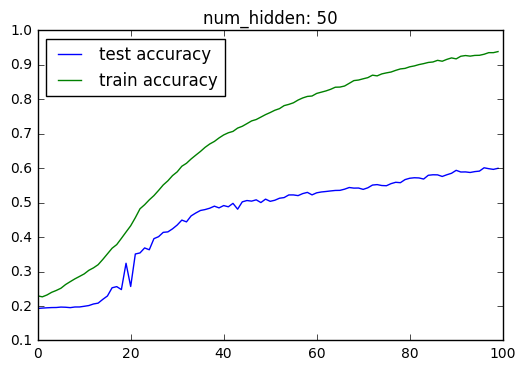

Train max accuracy:0.939
Test max accuracy:0.601


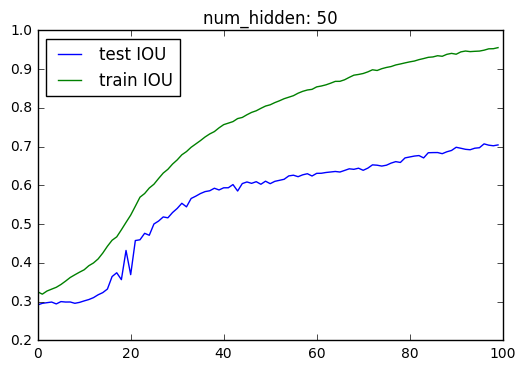

Train max IOU:0.956
Test max IOU:0.707


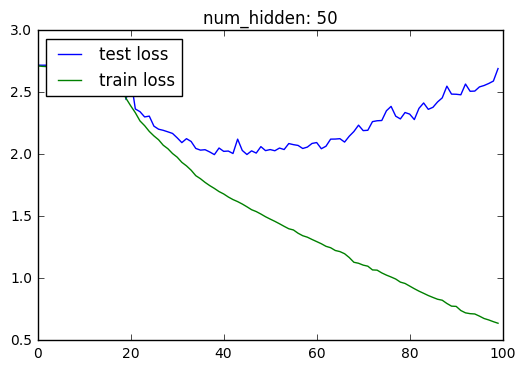

Train min loss:0.639
Test min loss:1.999
---------------------------------------------------------------------------------------------------- 



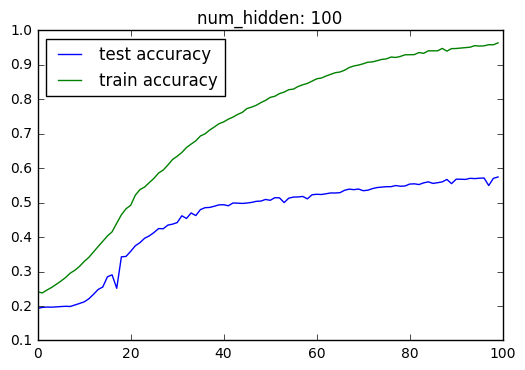

Train max accuracy:0.964
Test max accuracy:0.575


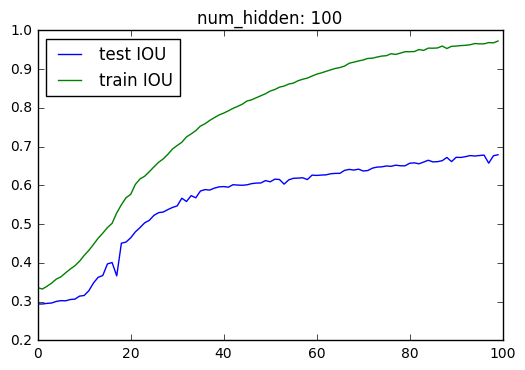

Train max IOU:0.973
Test max IOU:0.679


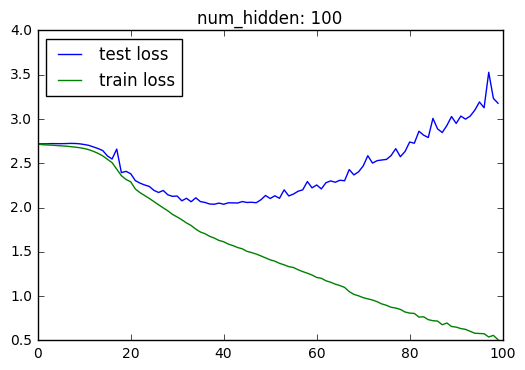

Train min loss:0.508
Test min loss:2.038
---------------------------------------------------------------------------------------------------- 



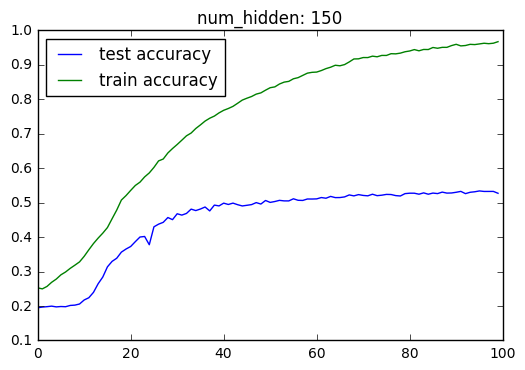

Train max accuracy:0.967
Test max accuracy:0.534


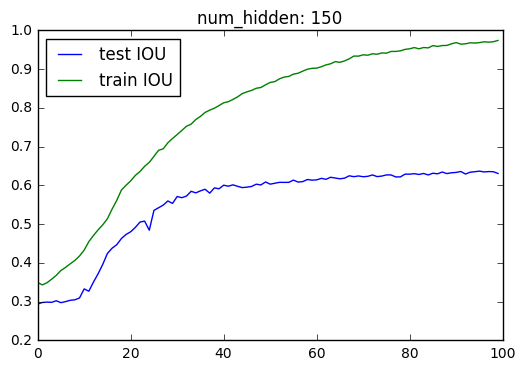

Train max IOU:0.974
Test max IOU:0.637


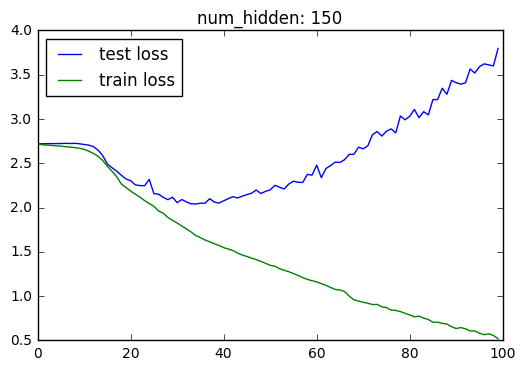

Train min loss:0.520
Test min loss:2.041
---------------------------------------------------------------------------------------------------- 



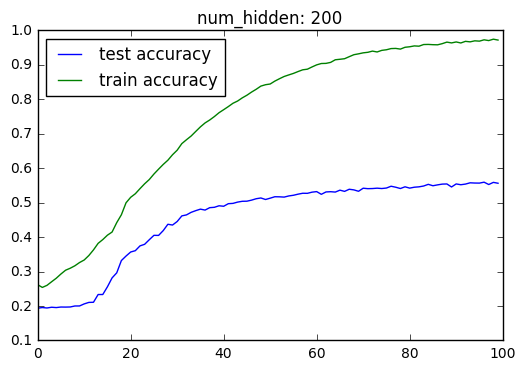

Train max accuracy:0.975
Test max accuracy:0.559


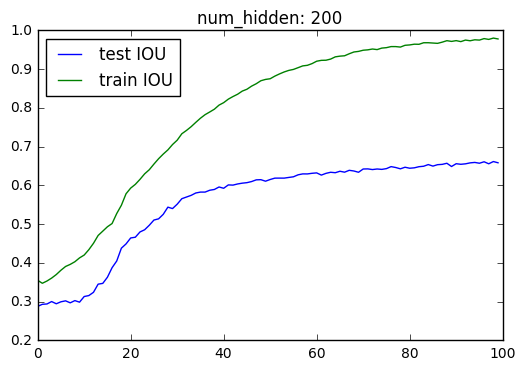

Train max IOU:0.980
Test max IOU:0.662


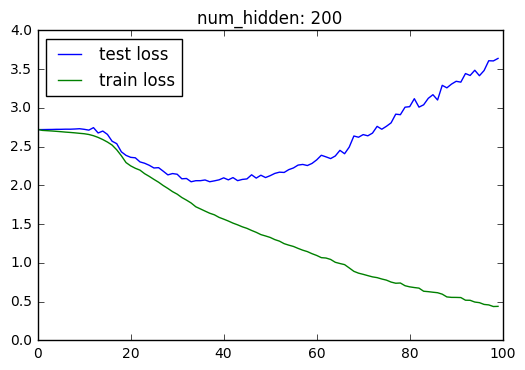

Train min loss:0.438
Test min loss:2.048
---------------------------------------------------------------------------------------------------- 



In [41]:
stats(simple_tst, , title='num_hidden')

In [19]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden, 
            max(np.array(simple_tst[i])[:,0]), 
            max(np.array(simple_trn[i])[:,0]), 
            max(np.array(simple_tst[i])[:,1]), 
            max(np.array(simple_trn[i])[:,1]), 
            min(np.array(simple_tst[i])[:,2]), 
            min(np.array(simple_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.601246 │         0.93862  │   0.707273 │    0.955657 │     1.99864 │     0.638715 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.574579 │         0.963889 │   0.679259 │    0.972694 │     2.0376  │     0.50838  │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.534057 │         0.967391 │   0.636919 │    0.974175 │     2.04057 │     0.51975  │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

# Attention

In [12]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
Attn_tst, Attn_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/Attn_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=False,
        use_wordAttn=True
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    Attn_tst.append(tst)
    Attn_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/Attn_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.288 ;acc:0.375 ;iou:0.470 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.615 ;acc:0.100 ;iou:0.200 ;time: 0:00:07
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:1.904 ;acc:0.430 ;iou:0.515 ;time: 0:00:13
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:2.874 ;acc:0.150 ;iou:0.225 ;time: 0:00:20
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.257 ;acc:0.260 ;iou:0.350 ;time: 0:00:27
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.249 ;acc:0.295 ;iou:0.445 ;time: 0:00:34

*Training B: True ;B Train loss: 2.714 ;Train accuracy: 0.228 ;IOU accuracy: 0.325 ;Time: 0:00:42 

Testing, ephoc: 0
batch: 0 ;B loss: 1.387 ;acc: 0.520 ;iou_acc: 0.685 ;time: 0:00:42
batch: 50 ;B loss: 2

In [13]:
np.save(open('../data/training/results/Attn_tst.bin', 'wb'), Attn_tst)
np.save(open('../data/training/results/Attn_trn.bin', 'wb'), Attn_trn)

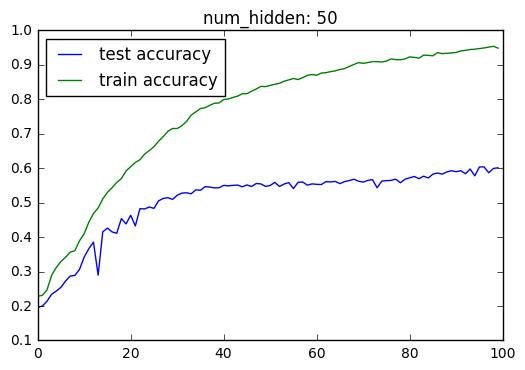

Train max accuracy:0.954
Test max accuracy:0.604


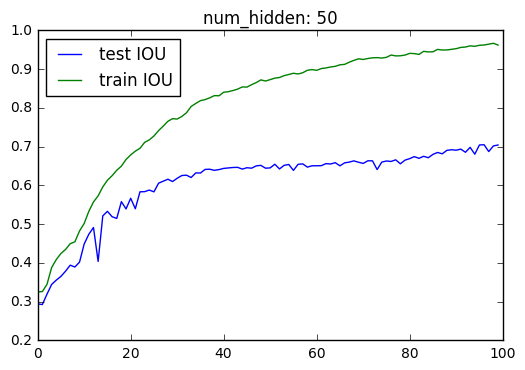

Train max IOU:0.967
Test max IOU:0.705


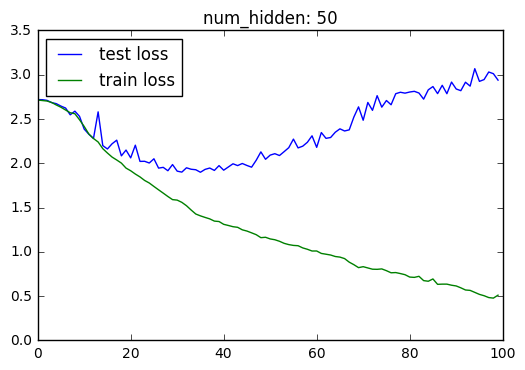

Train min loss:0.478
Test min loss:1.899
---------------------------------------------------------------------------------------------------- 



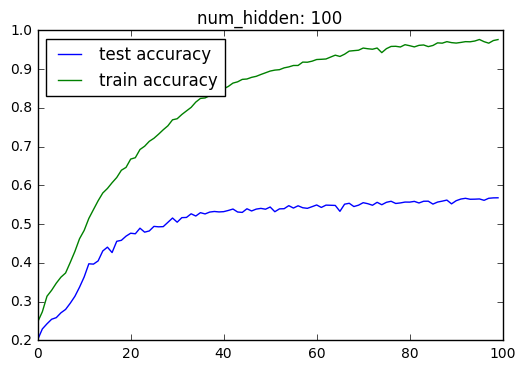

Train max accuracy:0.977
Test max accuracy:0.568


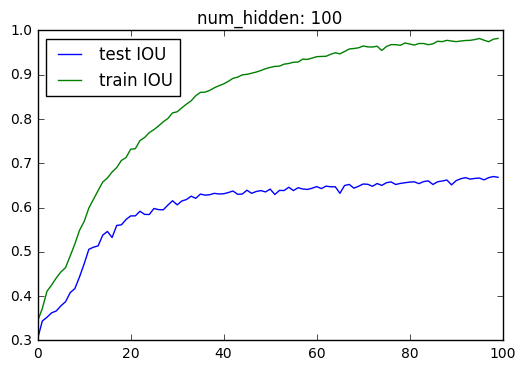

Train max IOU:0.982
Test max IOU:0.670


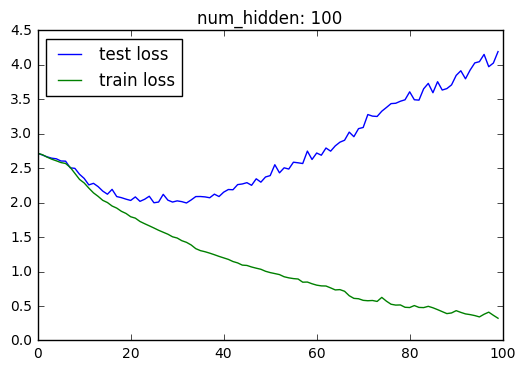

Train min loss:0.322
Test min loss:1.996
---------------------------------------------------------------------------------------------------- 



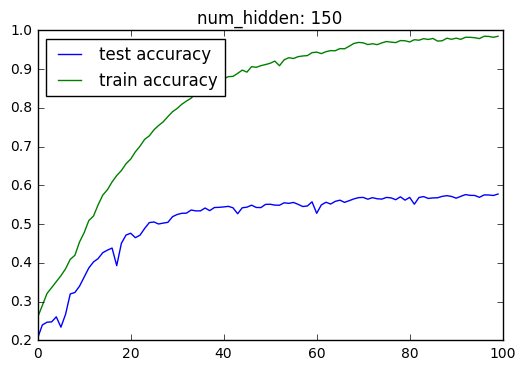

Train max accuracy:0.985
Test max accuracy:0.578


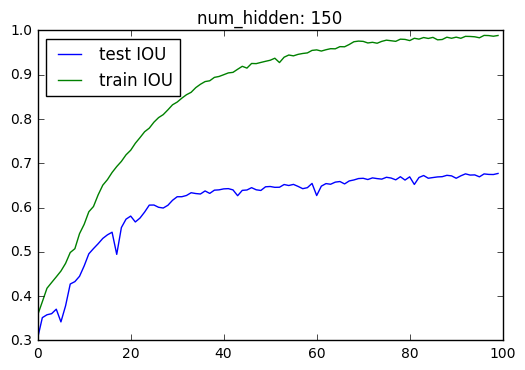

Train max IOU:0.989
Test max IOU:0.677


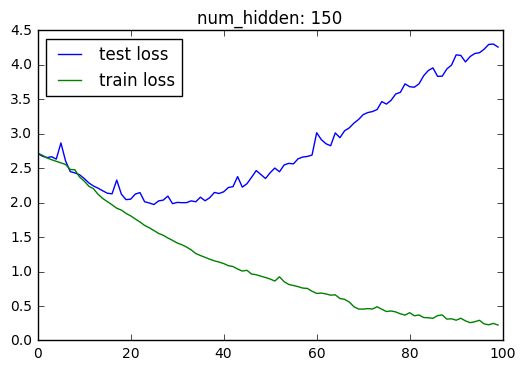

Train min loss:0.223
Test min loss:1.973
---------------------------------------------------------------------------------------------------- 



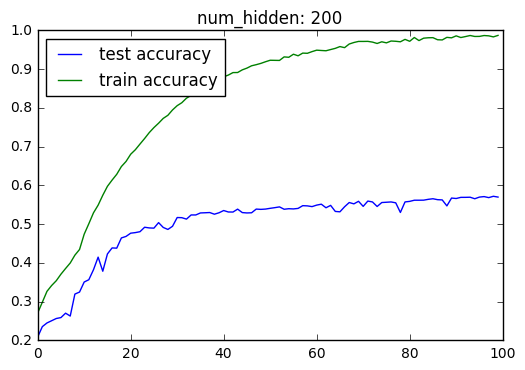

Train max accuracy:0.987
Test max accuracy:0.572


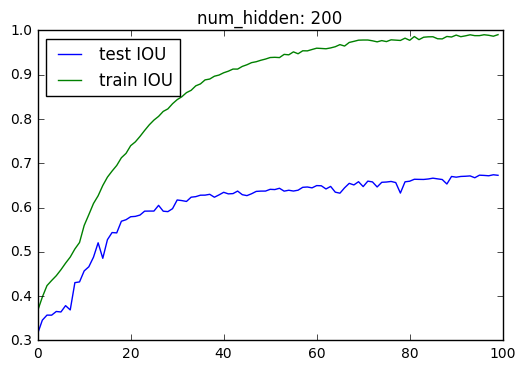

Train max IOU:0.990
Test max IOU:0.674


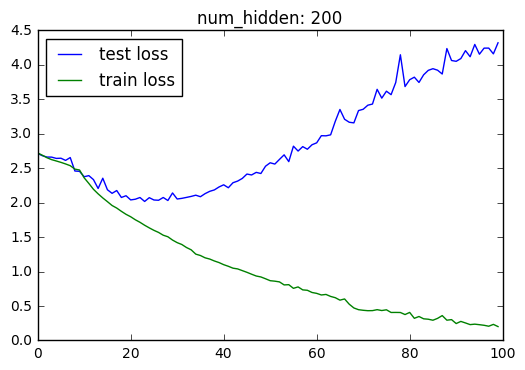

Train min loss:0.201
Test min loss:2.018
---------------------------------------------------------------------------------------------------- 



In [15]:
stats(Attn_tst, Attn_trn, title='num_hidden')

In [21]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden, 
                max(np.array(Attn_tst[i])[:,0]), 
                max(np.array(Attn_trn[i])[:,0]), 
                max(np.array(Attn_tst[i])[:,1]), 
                max(np.array(Attn_trn[i])[:,1]), 
                min(np.array(Attn_tst[i])[:,2]), 
                min(np.array(Attn_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.603788 │         0.953939 │   0.705051 │    0.966801 │     1.89897 │     0.477949 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.568131 │         0.976616 │   0.670118 │    0.981919 │     1.99556 │     0.322197 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.577845 │         0.985017 │   0.677071 │    0.988788 │     1.97284 │     0.223317 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

# Bidirectional RNN

In [24]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
bi_tst, bi_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/bi2_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=False,
        useBidirectionalRnn=True
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    bi_tst.append(tst)
    bi_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/bi2_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:3.050 ;acc:0.205 ;iou:0.300 ;time: 0:00:01
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.250 ;acc:0.120 ;iou:0.200 ;time: 0:00:07
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.244 ;acc:0.140 ;iou:0.245 ;time: 0:00:14
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:2.491 ;acc:0.290 ;iou:0.370 ;time: 0:00:19
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:1.910 ;acc:0.425 ;iou:0.470 ;time: 0:00:24
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:3.727 ;acc:0.105 ;iou:0.215 ;time: 0:00:30

*Training B: True ;B Train loss: 2.714 ;Train accuracy: 0.227 ;IOU accuracy: 0.322 ;Time: 0:00:35 

Testing, ephoc: 0
batch: 0 ;B loss: 1.377 ;acc: 0.565 ;iou_acc: 0.705 ;time: 0:00:36
batch: 50 ;B loss: 2.

In [25]:
np.save(open('../data/training/results/bi_tst.bin', 'wb'), bi_tst)
np.save(open('../data/training/results/bi_trn.bin', 'wb'), bi_trn)

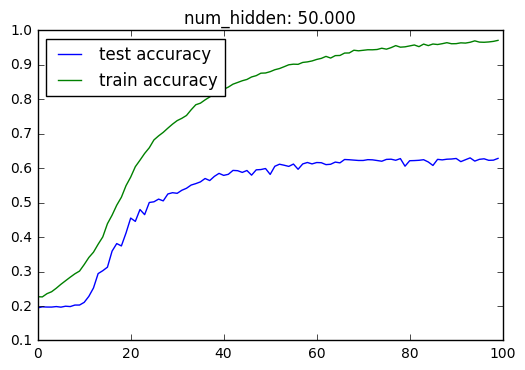

Train max accuracy:0.971
Test max accuracy:0.630


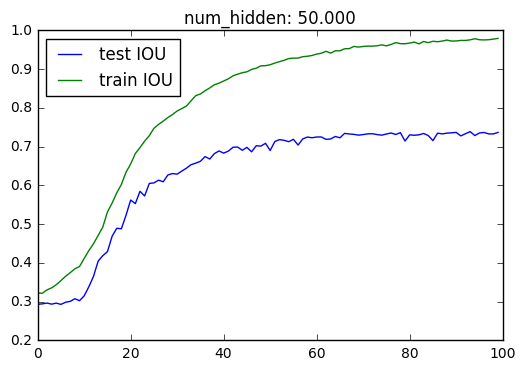

Train max IOU:0.980
Test max IOU:0.739


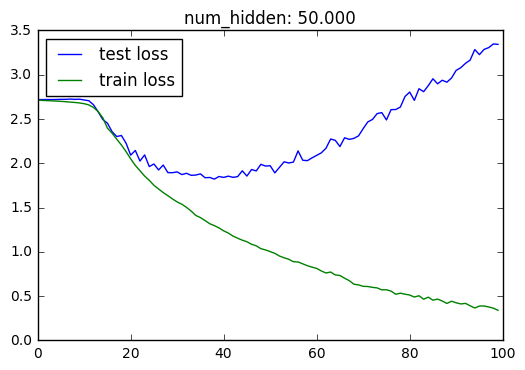

Train min loss:0.341
Test min loss:1.821
---------------------------------------------------------------------------------------------------- 



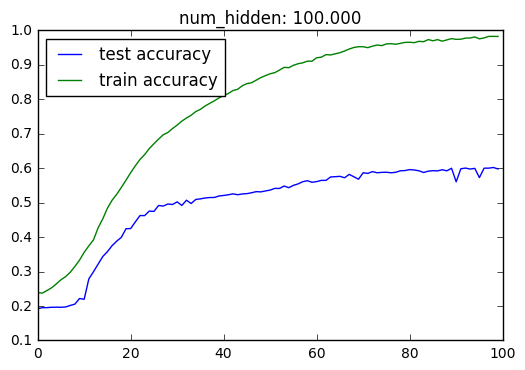

Train max accuracy:0.983
Test max accuracy:0.602


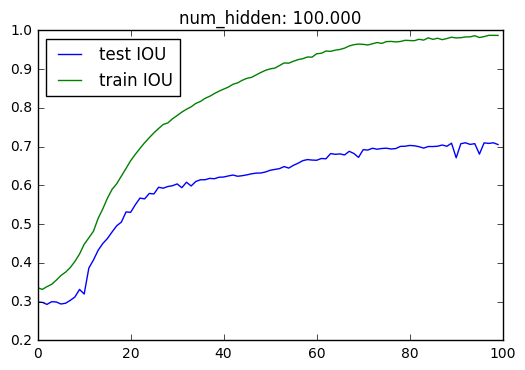

Train max IOU:0.987
Test max IOU:0.710


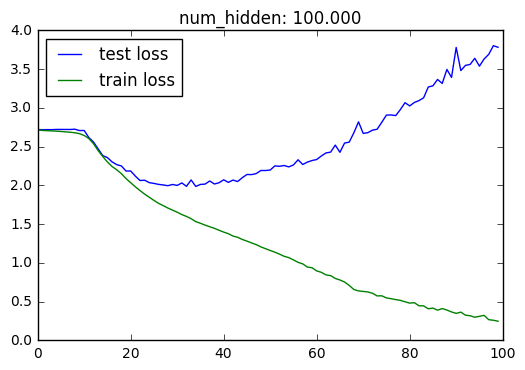

Train min loss:0.248
Test min loss:1.987
---------------------------------------------------------------------------------------------------- 



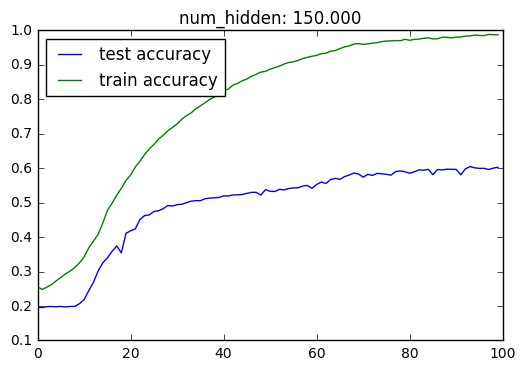

Train max accuracy:0.988
Test max accuracy:0.605


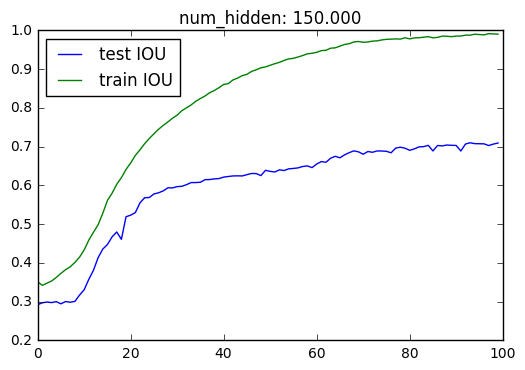

Train max IOU:0.992
Test max IOU:0.710


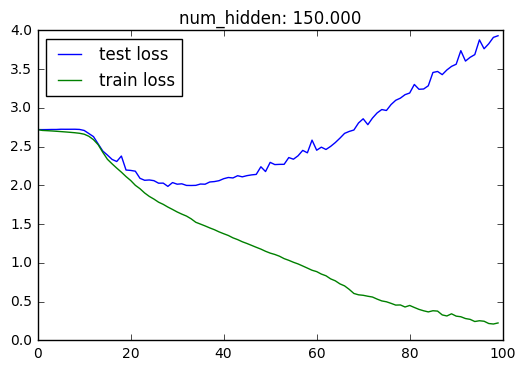

Train min loss:0.212
Test min loss:1.988
---------------------------------------------------------------------------------------------------- 



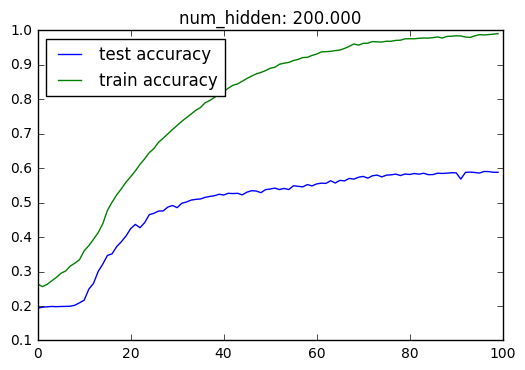

Train max accuracy:0.991
Test max accuracy:0.591


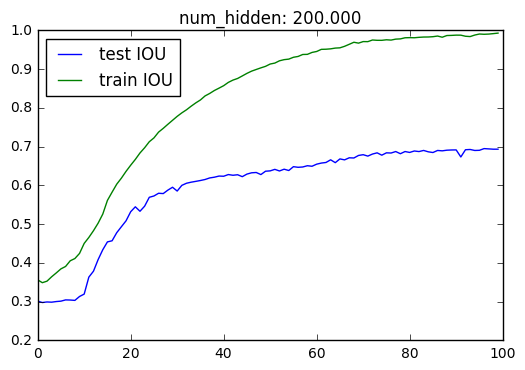

Train max IOU:0.993
Test max IOU:0.695


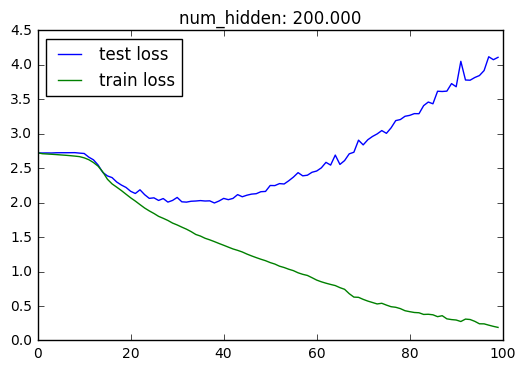

Train min loss:0.189
Test min loss:1.996
---------------------------------------------------------------------------------------------------- 



In [26]:
stats(bi_tst, bi_trn, title='num_hidden')

In [27]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden, 
                max(np.array(bi_tst[i])[:,0]), 
                max(np.array(bi_trn[i])[:,0]), 
                max(np.array(bi_tst[i])[:,1]), 
                max(np.array(bi_trn[i])[:,1]), 
                min(np.array(bi_tst[i])[:,2]), 
                min(np.array(bi_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.630067 │         0.971195 │   0.738889 │    0.979512 │     1.8215  │     0.34051  │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.602104 │         0.982795 │   0.710118 │    0.987323 │     1.98712 │     0.248019 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.604613 │         0.988418 │   0.710135 │    0.991717 │     1.98789 │     0.212011 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

# Attention & Bidirectional

In [33]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
AttBi_tst, AttBi_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/AttBi_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=False,
        useBidirectionalRnn=True,
        use_wordAttn=True
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    AttBi_tst.append(tst)
    AttBi_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/AttBi_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.877 ;acc:0.270 ;iou:0.330 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.020 ;acc:0.180 ;iou:0.295 ;time: 0:00:10
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.923 ;acc:0.045 ;iou:0.165 ;time: 0:00:20
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.431 ;acc:0.125 ;iou:0.230 ;time: 0:00:30
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.864 ;acc:0.205 ;iou:0.290 ;time: 0:00:41
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.498 ;acc:0.240 ;iou:0.350 ;time: 0:00:52

*Training B: True ;B Train loss: 2.713 ;Train accuracy: 0.232 ;IOU accuracy: 0.330 ;Time: 0:01:02 

Testing, ephoc: 0
batch: 0 ;B loss: 1.385 ;acc: 0.495 ;iou_acc: 0.690 ;time: 0:01:02
batch: 50 ;B loss: 

In [34]:
np.save(open('../data/training/results/AttBi_tst.bin', 'wb'), AttBi_tst)
np.save(open('../data/training/results/AttBi_trn.bin', 'wb'), AttBi_trn)

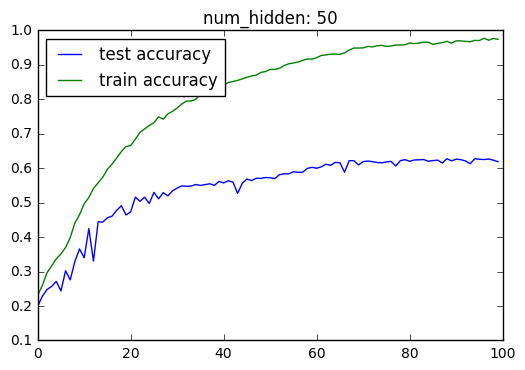

Train max accuracy:0.977
Test max accuracy:0.628


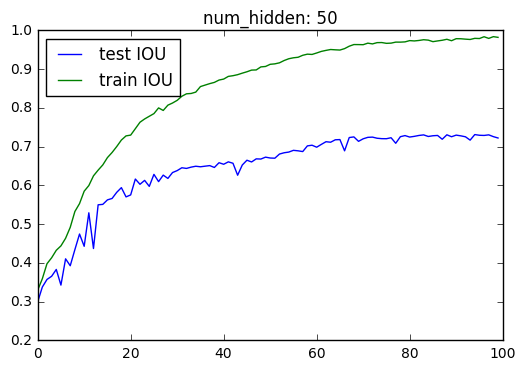

Train max IOU:0.984
Test max IOU:0.731


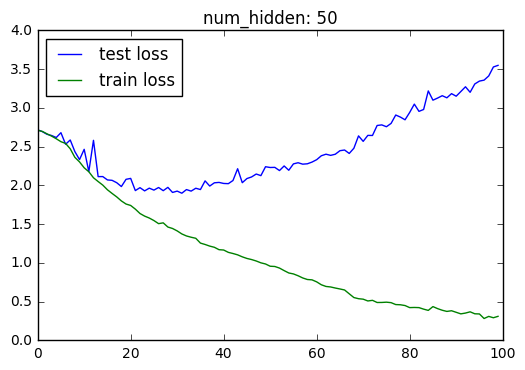

Train min loss:0.283
Test min loss:1.900
---------------------------------------------------------------------------------------------------- 



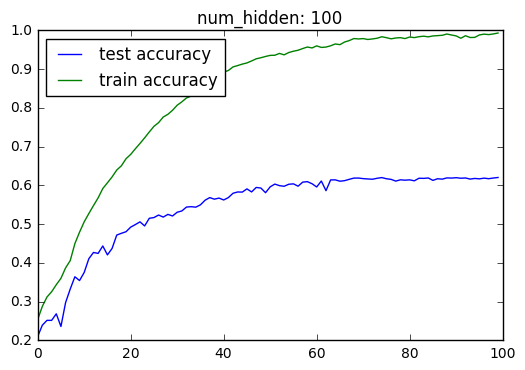

Train max accuracy:0.993
Test max accuracy:0.621


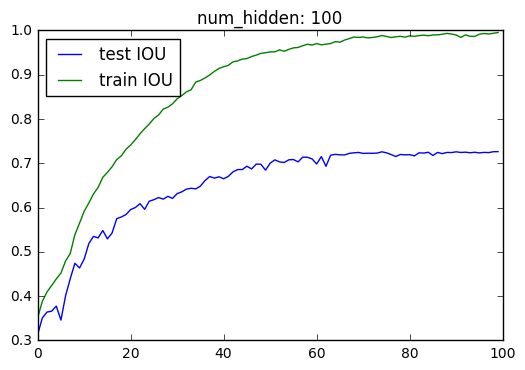

Train max IOU:0.995
Test max IOU:0.726


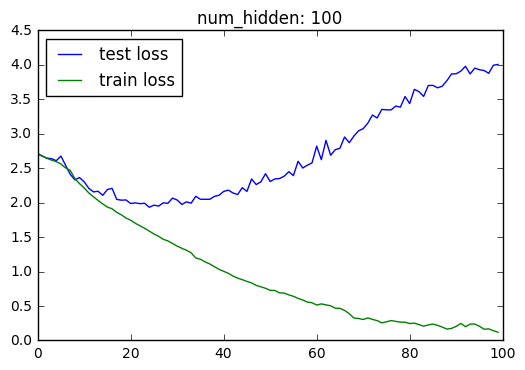

Train min loss:0.118
Test min loss:1.933
---------------------------------------------------------------------------------------------------- 



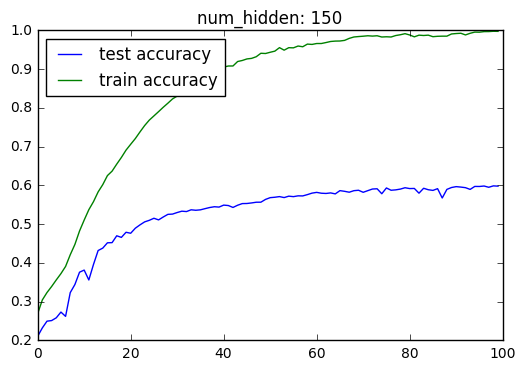

Train max accuracy:0.998
Test max accuracy:0.599


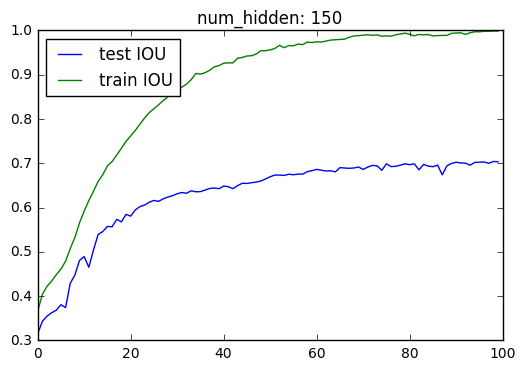

Train max IOU:0.999
Test max IOU:0.704


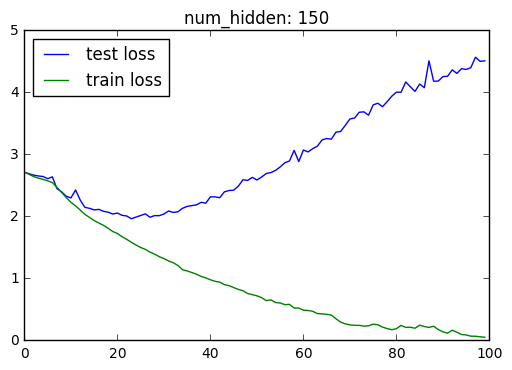

Train min loss:0.051
Test min loss:1.962
---------------------------------------------------------------------------------------------------- 



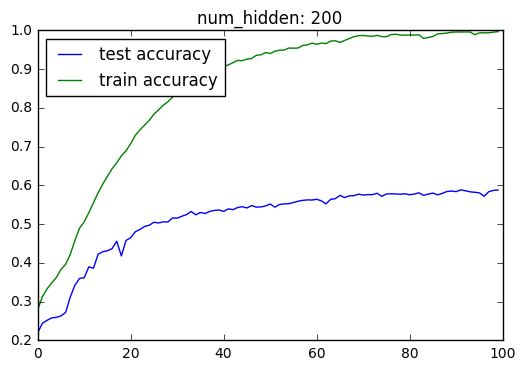

Train max accuracy:0.997
Test max accuracy:0.589


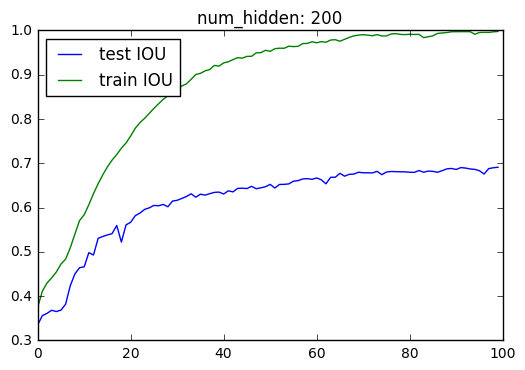

Train max IOU:0.998
Test max IOU:0.691


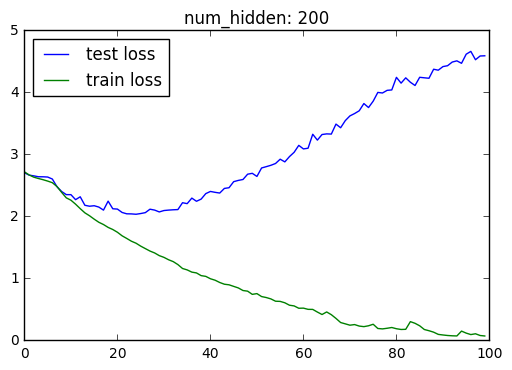

Train min loss:0.072
Test min loss:2.035
---------------------------------------------------------------------------------------------------- 



In [35]:
stats(AttBi_tst, AttBi_trn, title='num_hidden')

In [5]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden, 
                max(np.array(AttBi_tst[i])[:,0]), 
                max(np.array(AttBi_trn[i])[:,0]), 
                max(np.array(AttBi_tst[i])[:,1]), 
                max(np.array(AttBi_trn[i])[:,1]), 
                min(np.array(AttBi_tst[i])[:,2]), 
                min(np.array(AttBi_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.627694 │         0.97729  │   0.731279 │    0.98399  │     1.89977 │    0.283     │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.620522 │         0.99335  │   0.726364 │    0.99532  │     1.93303 │    0.118248  │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.598889 │         0.997845 │   0.704158 │    0.998687 │     1.96236 │    0.0511464 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

# Batch normalization

### Batch normelize only the RNN outputs

In [130]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
qbnorm_tst, qbnorm_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/qbnorm_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=True,
        toQscale=False,
        Urnn_norm=True, 
        Uatt_norm=False
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    qbnorm_tst.append(tst)
    qbnorm_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/qbnorm_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.742 ;acc:0.190 ;iou:0.290 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:2.463 ;acc:0.260 ;iou:0.360 ;time: 0:00:11
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:1.996 ;acc:0.365 ;iou:0.480 ;time: 0:00:23
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:2.416 ;acc:0.215 ;iou:0.265 ;time: 0:00:31
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.671 ;acc:0.165 ;iou:0.285 ;time: 0:00:38
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.731 ;acc:0.200 ;iou:0.320 ;time: 0:00:47

*Training B: True ;B Train loss: 2.420 ;Train accuracy: 0.259 ;IOU accuracy: 0.356 ;Time: 0:00:52 

Testing, ephoc: 0
batch: 0 ;B loss: 1.560 ;acc: 0.590 ;iou_acc: 0.745 ;time: 0:00:53
batch: 50 ;B loss:

In [131]:
np.save(open('../data/training/results/qbnorm_tst.bin', 'wb'), qbnorm_tst)
np.save(open('../data/training/results/qbnorm_trn.bin', 'wb'), qbnorm_trn)

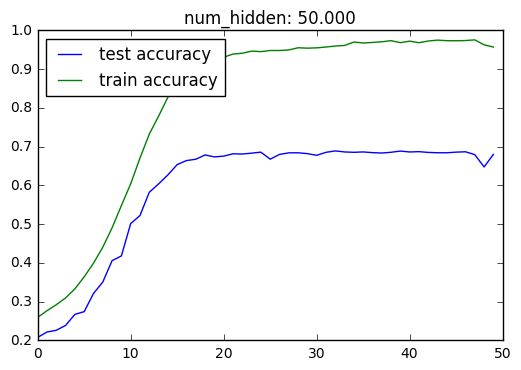

Train max accuracy:0.976
Test max accuracy:0.689


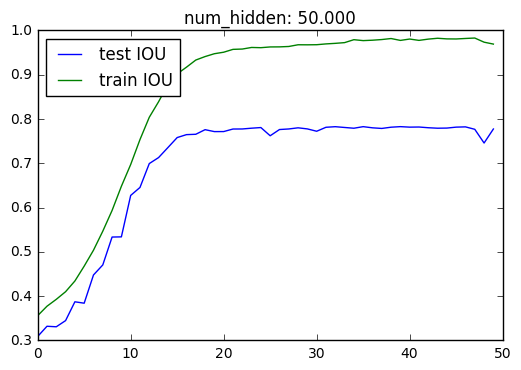

Train max IOU:0.983
Test max IOU:0.783


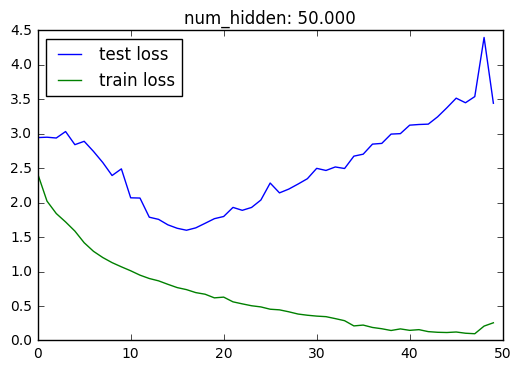

Train min loss:0.097
Test min loss:1.600
---------------------------------------------------------------------------------------------------- 



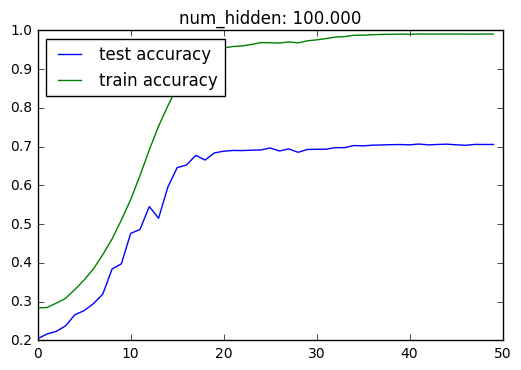

Train max accuracy:0.991
Test max accuracy:0.707


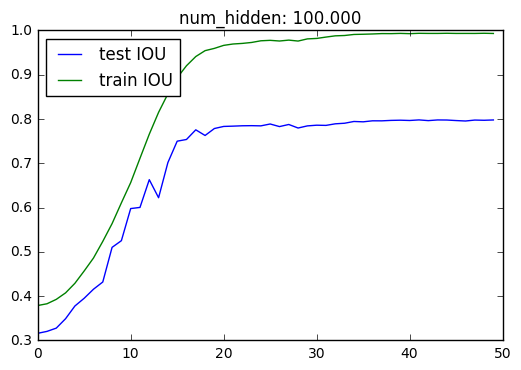

Train max IOU:0.994
Test max IOU:0.798


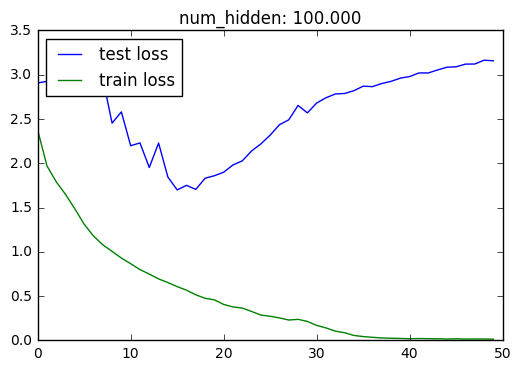

Train min loss:0.015
Test min loss:1.700
---------------------------------------------------------------------------------------------------- 



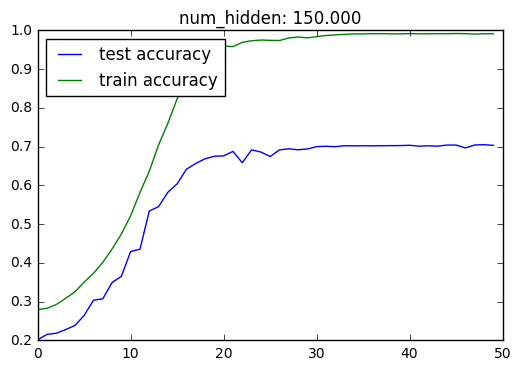

Train max accuracy:0.992
Test max accuracy:0.705


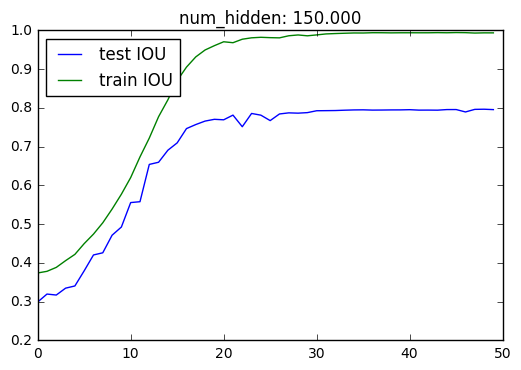

Train max IOU:0.995
Test max IOU:0.797


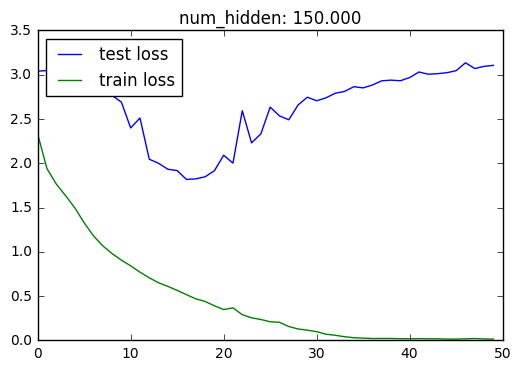

Train min loss:0.015
Test min loss:1.818
---------------------------------------------------------------------------------------------------- 



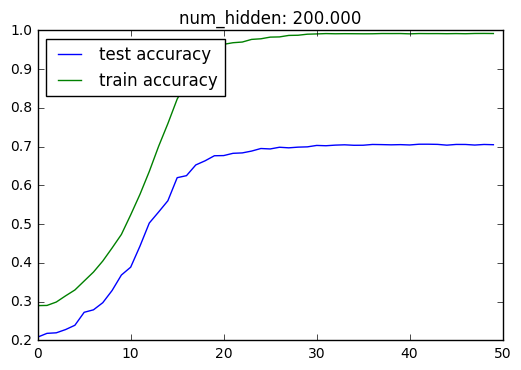

Train max accuracy:0.992
Test max accuracy:0.706


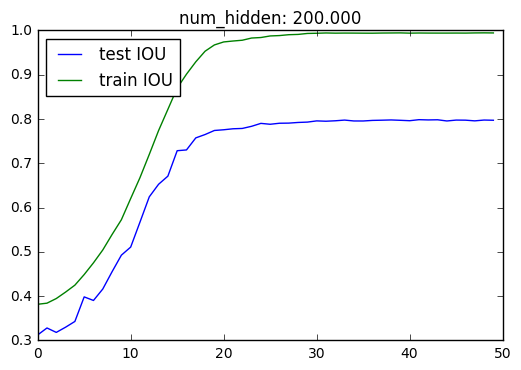

Train max IOU:0.995
Test max IOU:0.799


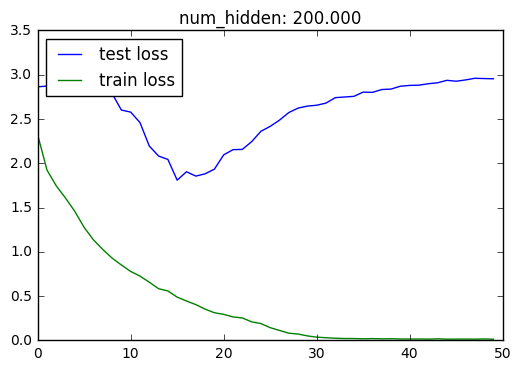

Train min loss:0.014
Test min loss:1.810
---------------------------------------------------------------------------------------------------- 



In [133]:
stats(qbnorm_tst, qbnorm_trn, ephocs=50, title='num_hidden')

In [7]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden,  
               max(np.array(qbnorm_tst[i])[:,0]), 
               max(np.array(qbnorm_trn[i])[:,0]), 
               max(np.array(qbnorm_tst[i])[:,1]), 
               max(np.array(qbnorm_trn[i])[:,1]), 
               min(np.array(qbnorm_tst[i])[:,2]), 
               min(np.array(qbnorm_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.689108 │         0.97564  │   0.782778 │    0.982862 │     1.59973 │    0.0974517 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.706835 │         0.99096  │   0.79798  │    0.99362  │     1.6997  │    0.0145554 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.705185 │         0.992037 │   0.7967   │    0.994529 │     1.81763 │    0.0150545 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

### Batch normelize only the bboxes vectors

In [135]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
imbnorm_tst, imbnorm_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/imbnorm_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=True,
        toQscale=False,
        Urnn_norm=False, 
        Uatt_norm=True
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=50,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    imbnorm_tst.append(tst)
    imbnorm_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/imbnorm_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.926 ;acc:0.195 ;iou:0.250 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:1.389 ;acc:0.550 ;iou:0.670 ;time: 0:00:10
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:1.907 ;acc:0.400 ;iou:0.475 ;time: 0:00:20
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.241 ;acc:0.150 ;iou:0.245 ;time: 0:00:32
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.705 ;acc:0.205 ;iou:0.295 ;time: 0:00:41
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.860 ;acc:0.210 ;iou:0.270 ;time: 0:00:49

*Training B: True ;B Train loss: 2.716 ;Train accuracy: 0.228 ;IOU accuracy: 0.323 ;Time: 0:00:58 

Testing, ephoc: 0
batch: 0 ;B loss: 1.389 ;acc: 0.470 ;iou_acc: 0.685 ;time: 0:00:58
batch: 50 ;B loss

In [136]:
np.save(open('../data/training/results/imbnorm_tst.bin', 'wb'), imbnorm_tst)
np.save(open('../data/training/results/imbnorm_trn.bin', 'wb'), imbnorm_trn)

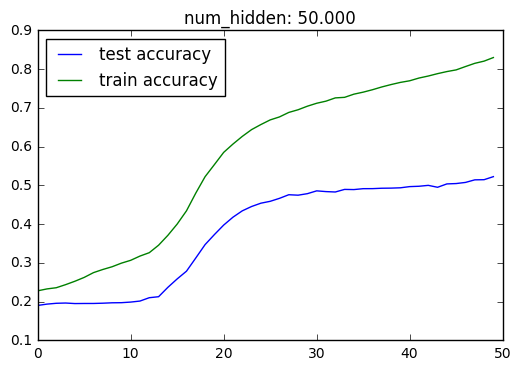

Train max accuracy:0.830
Test max accuracy:0.523


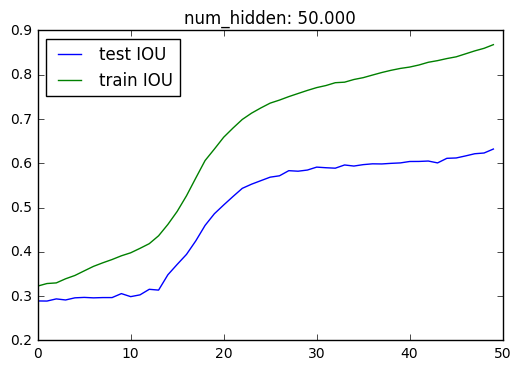

Train max IOU:0.868
Test max IOU:0.632


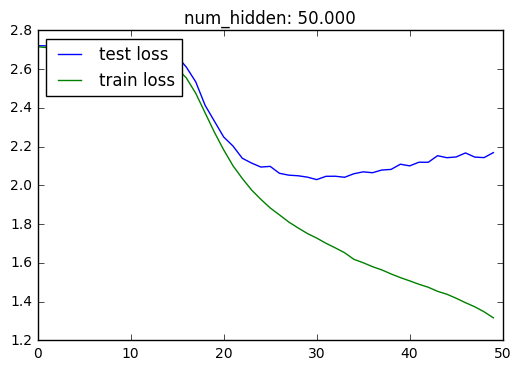

Train min loss:1.317
Test min loss:2.030
---------------------------------------------------------------------------------------------------- 



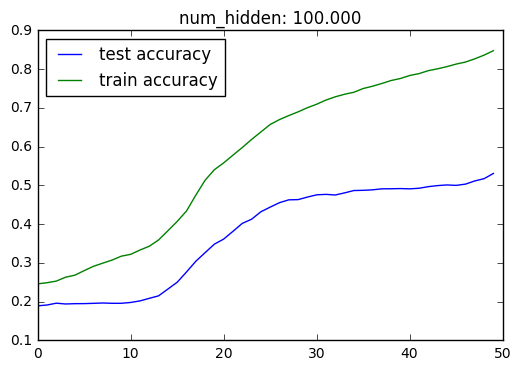

Train max accuracy:0.848
Test max accuracy:0.531


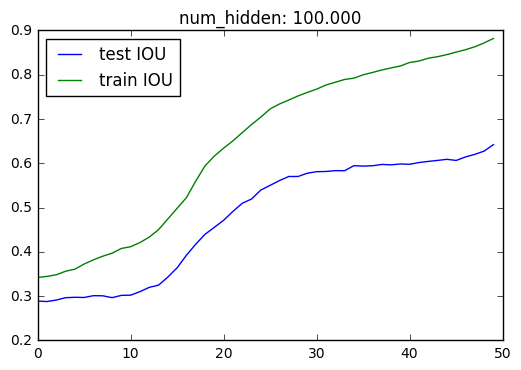

Train max IOU:0.882
Test max IOU:0.642


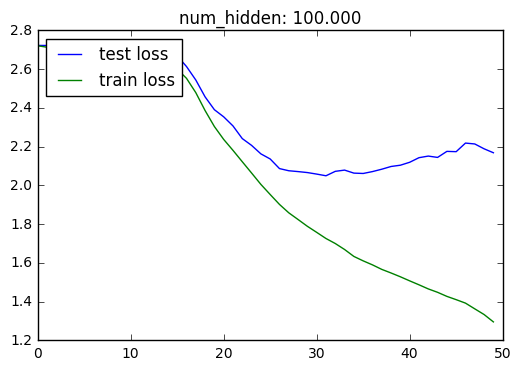

Train min loss:1.296
Test min loss:2.050
---------------------------------------------------------------------------------------------------- 



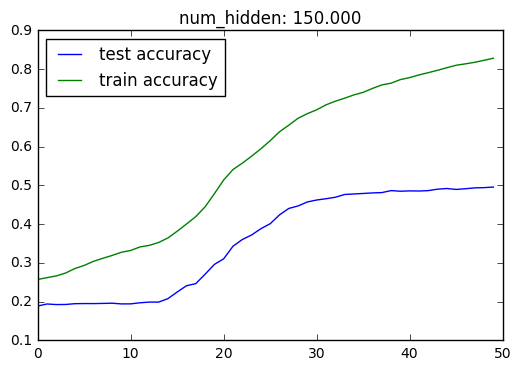

Train max accuracy:0.828
Test max accuracy:0.496


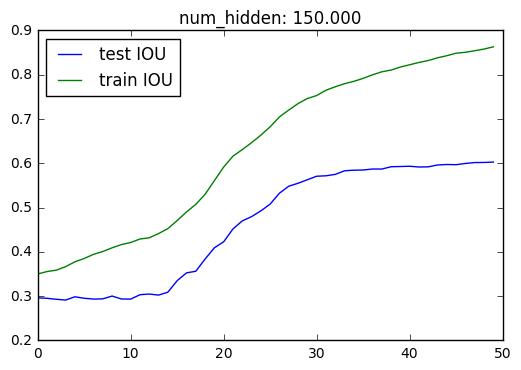

Train max IOU:0.863
Test max IOU:0.603


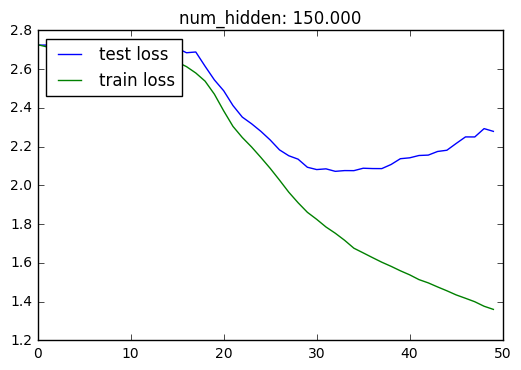

Train min loss:1.360
Test min loss:2.073
---------------------------------------------------------------------------------------------------- 



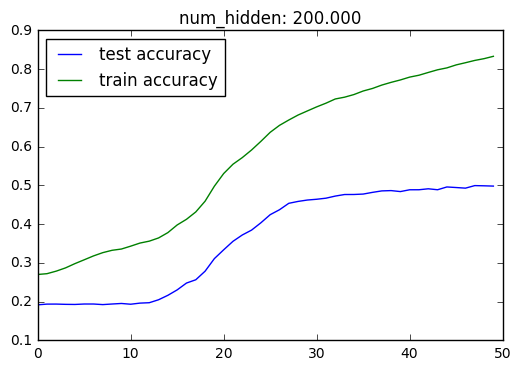

Train max accuracy:0.833
Test max accuracy:0.500


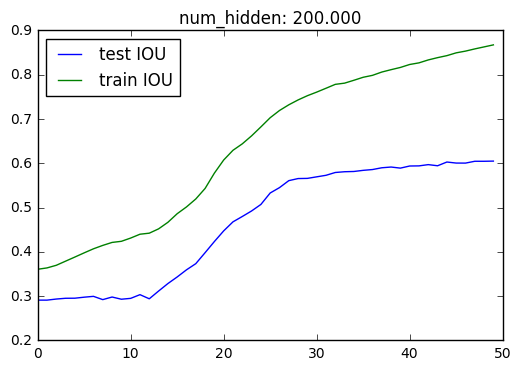

Train max IOU:0.867
Test max IOU:0.605


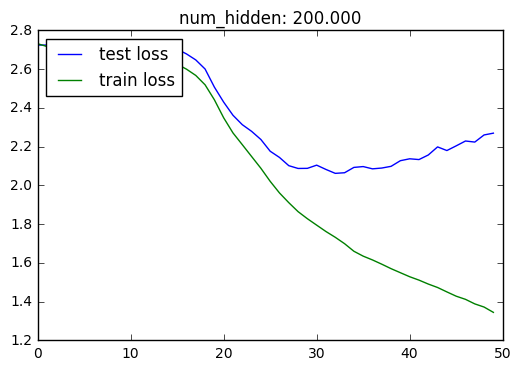

Train min loss:1.345
Test min loss:2.062
---------------------------------------------------------------------------------------------------- 



In [137]:
stats(imbnorm_tst, imbnorm_trn, ephocs=50, title='num_hidden')

In [9]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden,
               max(np.array(imbnorm_tst[i])[:,0]), 
               max(np.array(imbnorm_trn[i])[:,0]), 
               max(np.array(imbnorm_tst[i])[:,1]), 
               max(np.array(imbnorm_trn[i])[:,1]), 
               max(np.array(imbnorm_tst[i])[:,2]), 
               max(np.array(imbnorm_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.52271  │         0.830067 │   0.632205 │    0.867896 │     2.72778 │      2.7158  │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.530909 │         0.84771  │   0.642121 │    0.881869 │     2.73471 │      2.72082 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.495825 │         0.828316 │   0.602795 │    0.863047 │     2.74    │      2.72641 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

## Bach normaliztion for all

In [21]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
bnorm_tst, bnorm_trn = [], []

for num_hidden in num_hiddens:
    params_dir = params_dir_tmp+'RL/EXP/bnorm_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=True,
        toQscale=False
    )


    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True)
    
    bnorm_tst.append(tst)
    bnorm_trn.append(trn)
    
    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/bnorm_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.762 ;acc:0.265 ;iou:0.360 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.733 ;acc:0.075 ;iou:0.200 ;time: 0:00:05
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:2.719 ;acc:0.170 ;iou:0.275 ;time: 0:00:10
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:1.465 ;acc:0.420 ;iou:0.510 ;time: 0:00:15
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.566 ;acc:0.155 ;iou:0.240 ;time: 0:00:20
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:1.577 ;acc:0.440 ;iou:0.520 ;time: 0:00:24

*Training B: True ;B Train loss: 2.395 ;Train accuracy: 0.269 ;IOU accuracy: 0.358 ;Time: 0:00:28 

Testing, ephoc: 0
batch: 0 ;B loss: 1.477 ;acc: 0.540 ;iou_acc: 0.700 ;time: 0:00:29
batch: 50 ;B loss: 

In [23]:
np.save(open('../data/training/results/bnorm_tst.bin', 'wb'), bnorm_tst)
np.save(open('../data/training/results/bnorm_trn.bin', 'wb'), bnorm_trn)

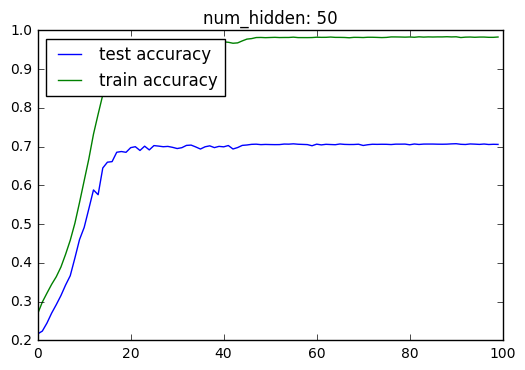

Train max accuracy:0.984
Test max accuracy:0.708


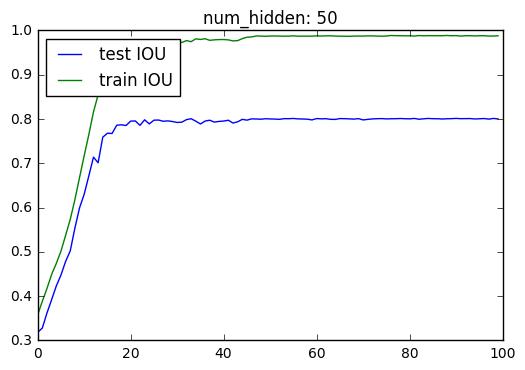

Train max IOU:0.989
Test max IOU:0.801


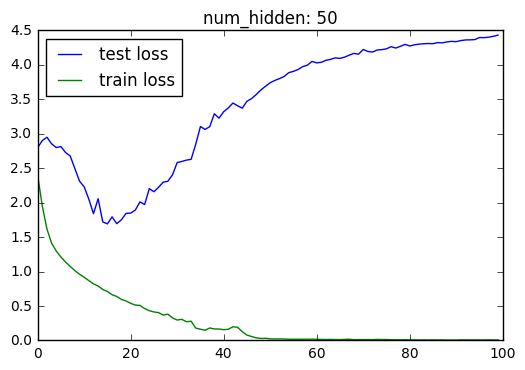

Train min loss:0.006
Test min loss:1.692
---------------------------------------------------------------------------------------------------- 



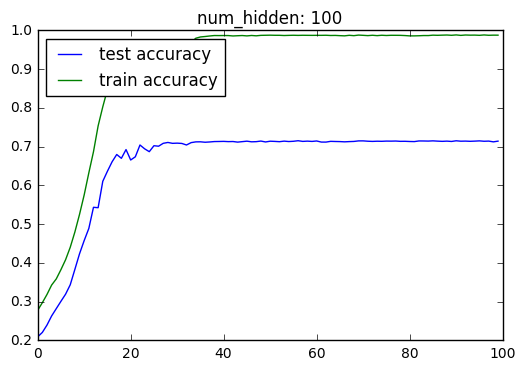

Train max accuracy:0.988
Test max accuracy:0.715


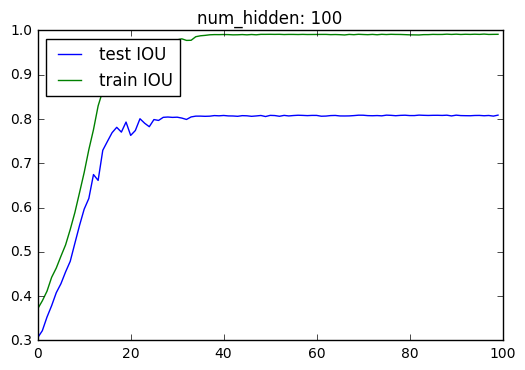

Train max IOU:0.992
Test max IOU:0.809


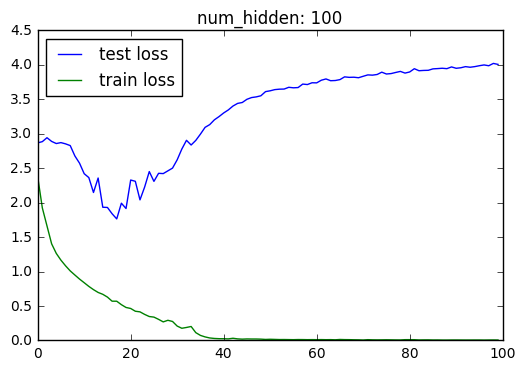

Train min loss:0.006
Test min loss:1.764
---------------------------------------------------------------------------------------------------- 



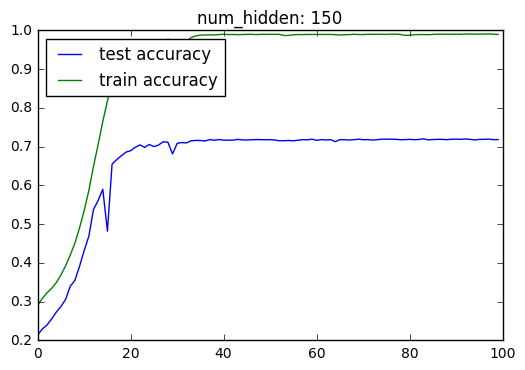

Train max accuracy:0.991
Test max accuracy:0.720


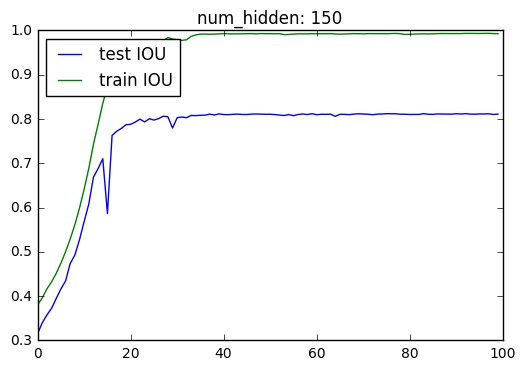

Train max IOU:0.993
Test max IOU:0.812


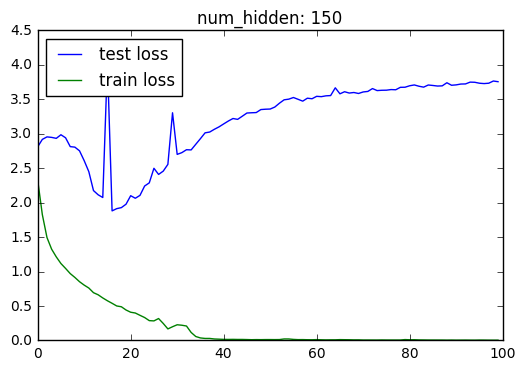

Train min loss:0.004
Test min loss:1.881
---------------------------------------------------------------------------------------------------- 



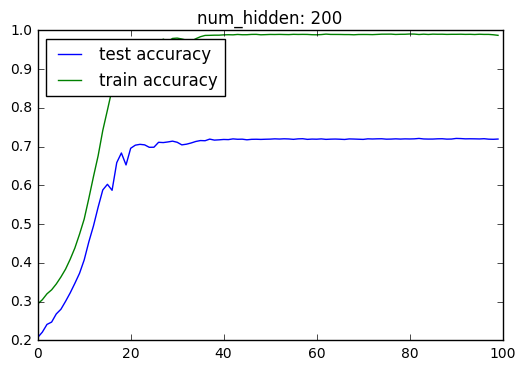

Train max accuracy:0.991
Test max accuracy:0.721


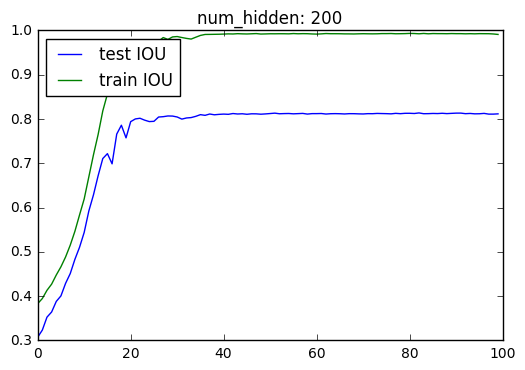

Train max IOU:0.993
Test max IOU:0.814


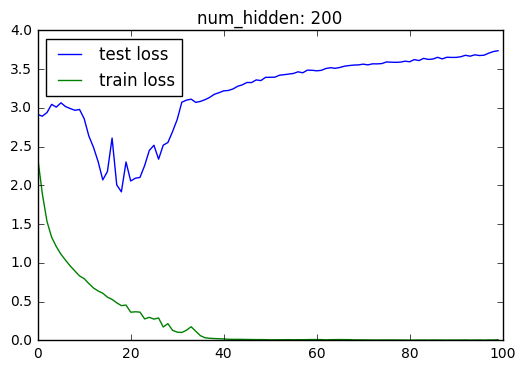

Train min loss:0.004
Test min loss:1.918
---------------------------------------------------------------------------------------------------- 



In [24]:
stats(bnorm_tst, bnorm_trn, title='num_hidden')

In [11]:
arr = []
for i, num_hidden in enumerate([50, 100, 150, 200]):
    arr.append([num_hidden, 
                max(np.array(bnorm_tst[i])[:,0]), 
                max(np.array(bnorm_trn[i])[:,0]), 
                max(np.array(bnorm_tst[i])[:,1]), 
                max(np.array(bnorm_trn[i])[:,1]), 
                max(np.array(bnorm_tst[i])[:,2]), 
                max(np.array(bnorm_trn[i])[:,2])])
print(tabulate(arr, headers=['Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss'], tablefmt='fancy_grid'))

╒══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│           50 │        0.707677 │         0.983771 │   0.801347 │    0.988636 │     4.43199 │      2.39522 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          100 │        0.715387 │         0.988451 │   0.808788 │    0.991801 │     4.02132 │      2.37839 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│          150 │        0.720303 │         0.991027 │   0.812172 │    0.993485 │     4.03125 │      2.32807 │
├──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│         

# Dropout

In [42]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
dropouts = [[1., 0.5], [0.5, 1.], [0.5, 0.5]]
drop_tst, drop_trn = [], []

for drop in dropouts:
    for num_hidden in num_hiddens:
        params_dir = params_dir_tmp+'RL/EXP/drop_in:'+str(drop[0])+'drop_out:'+str(drop[1])+'_hidden:'+str(num_hidden)
        tf.reset_default_graph()
        m = Model(
            batch_size=200, 
            num_hidden=num_hidden,
            embed_size=embed_vecs.shape[1],
            img_dims=trainset[0][0][1][0].shape[1], 
            bbox_dims=trainset[0][0][1][1].shape[1], 
            lr=.05,
            vocab=vocab, 
            decay_steps=10000, 
            decay_rate=0.9, 
            coefAlr=1,
            bnorm=False,
            toQscale=False
        )
    

        print('params_dir:', params_dir)
        print('drop_in:', drop[0])
        print('drop_out:', drop[1])
        print('num_hidden:', m.num_hidden)
        print('learning rate:', m.lr)
        tst, trn, _, _ = m.train(trainset, testset,
                ephocs_num=100,
                start_ephoc=0,
                startA=101,
                activation_ephoc=101,
                muteB=2, 
                editProb=0.8,
                edit_reward=edit_reward,
                rnn_editProb=0.2,
                onlyB=True,
                dropout_in=drop[0],
                dropout_out=drop[1])

        drop_tst.append(tst)
        drop_trn.append(trn)

        print('\n'+'*'*100)
        print('*'*100)
        print('*'*100,'\n')     

params_dir: ../data/training/models/All/RL/EXP/drop_in:1.0drop_out:0.5_hidden:50
drop_in: 1.0
drop_out: 0.5
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:3.270 ;acc:0.145 ;iou:0.250 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:1.917 ;acc:0.385 ;iou:0.485 ;time: 0:00:07
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:1.387 ;acc:0.575 ;iou:0.715 ;time: 0:00:13
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.915 ;acc:0.070 ;iou:0.165 ;time: 0:00:18
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.243 ;acc:0.265 ;iou:0.370 ;time: 0:00:24
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:3.015 ;acc:0.135 ;iou:0.235 ;time: 0:00:31

*Training B: True ;B Train loss: 2.713 ;Train accuracy: 0.228 ;IOU accuracy: 0.326 ;Time: 0:00:42 

Testing, ephoc: 0
batch: 0 ;B loss: 1.374 ;acc: 0.580 ;iou_acc: 0.685 ;tim

In [46]:
np.save(open('../data/training/results/drop_tst.bin', 'wb'), drop_tst)
np.save(open('../data/training/results/drop_trn.bin', 'wb'), drop_trn)

dropin_in: 1.0
dropin_out: 0.5
####################################################################################################


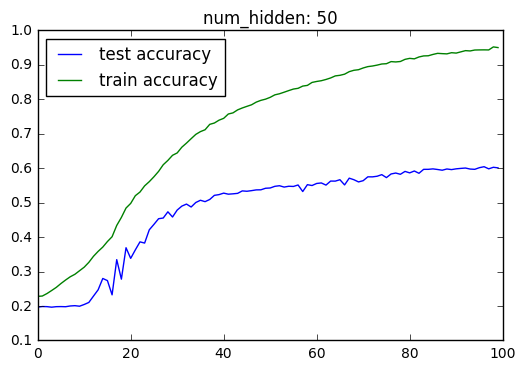

Train max accuracy:0.952
Test max accuracy:0.604


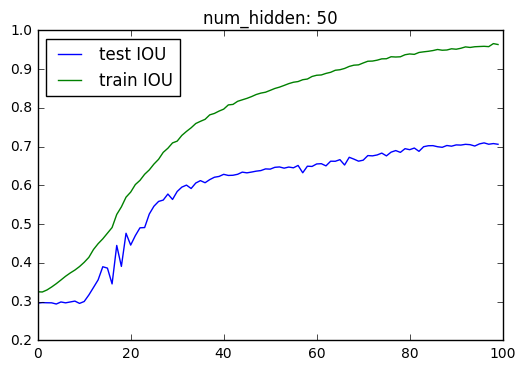

Train max IOU:0.966
Test max IOU:0.710


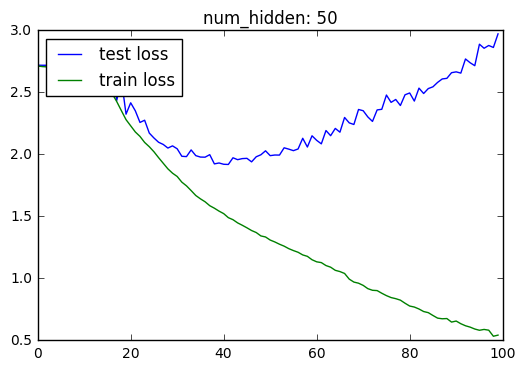

Train min loss:0.534
Test min loss:1.919
---------------------------------------------------------------------------------------------------- 



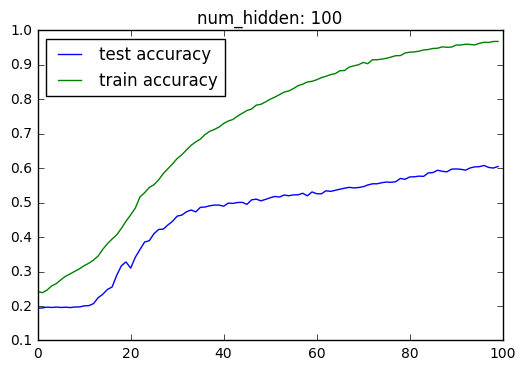

Train max accuracy:0.968
Test max accuracy:0.608


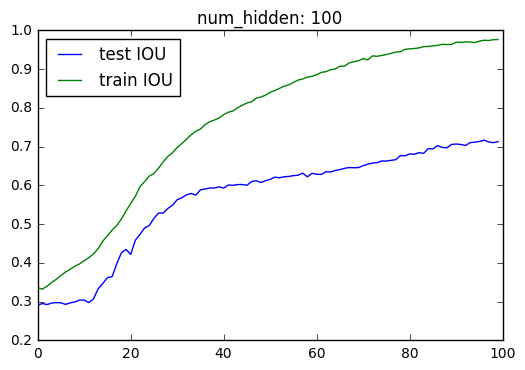

Train max IOU:0.977
Test max IOU:0.717


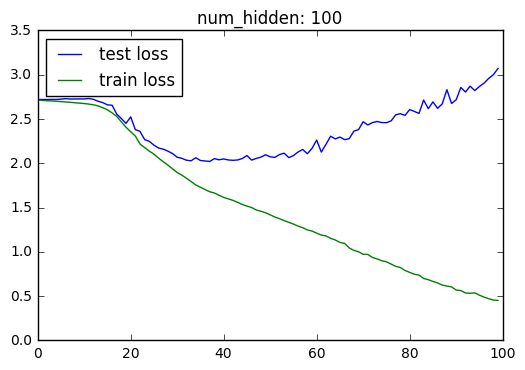

Train min loss:0.452
Test min loss:2.021
---------------------------------------------------------------------------------------------------- 



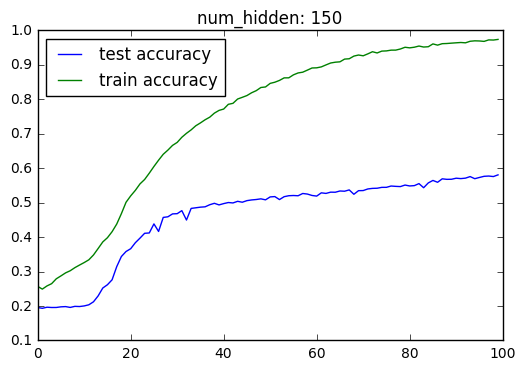

Train max accuracy:0.974
Test max accuracy:0.581


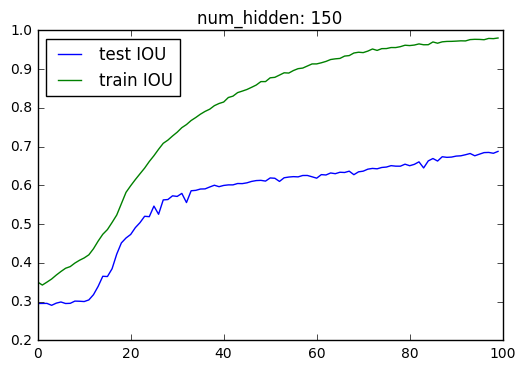

Train max IOU:0.981
Test max IOU:0.688


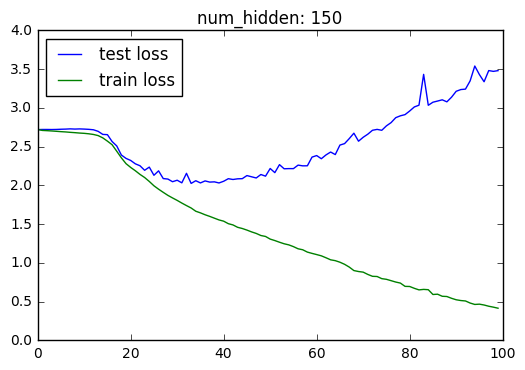

Train min loss:0.416
Test min loss:2.026
---------------------------------------------------------------------------------------------------- 



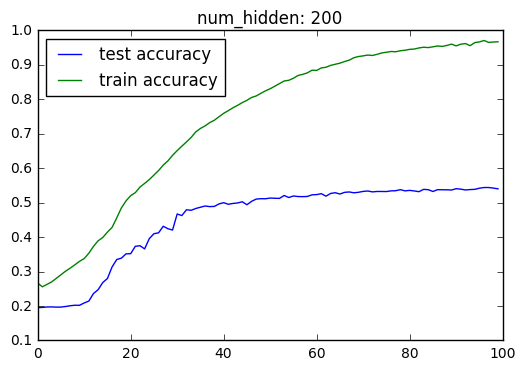

Train max accuracy:0.971
Test max accuracy:0.544


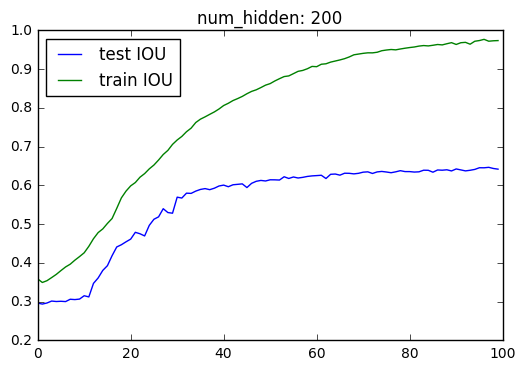

Train max IOU:0.977
Test max IOU:0.647


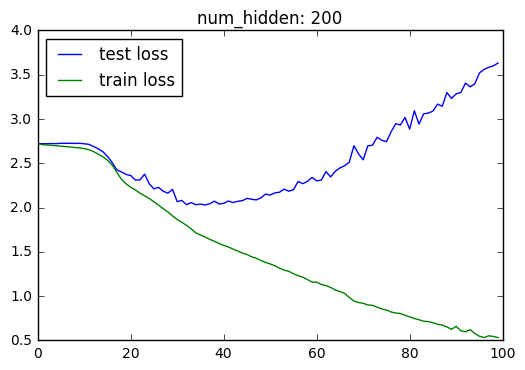

Train min loss:0.532
Test min loss:2.029
---------------------------------------------------------------------------------------------------- 

#################################################################################################### 

dropin_in: 0.5
dropin_out: 1.0
####################################################################################################


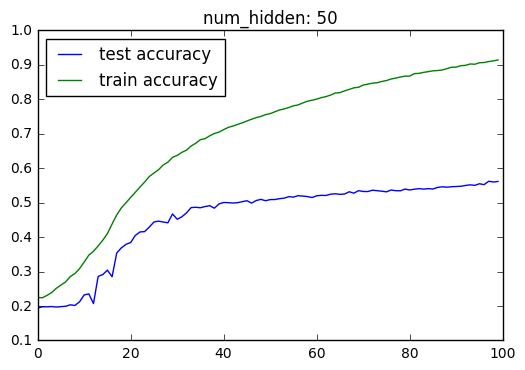

Train max accuracy:0.914
Test max accuracy:0.562


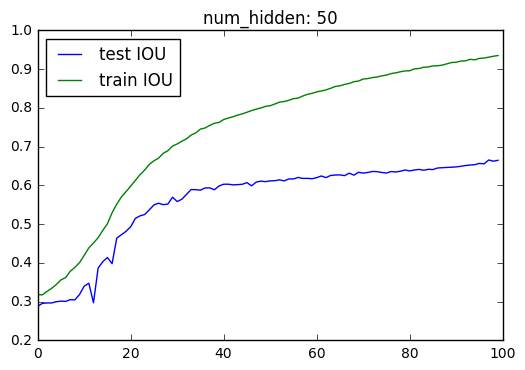

Train max IOU:0.935
Test max IOU:0.666


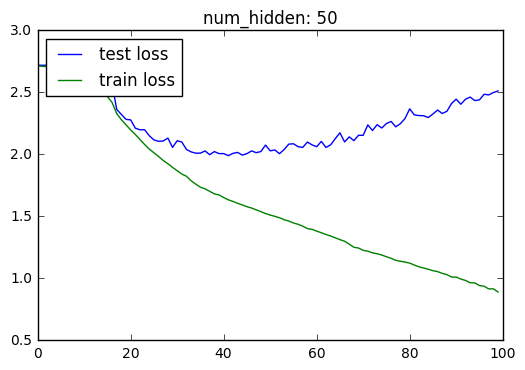

Train min loss:0.891
Test min loss:1.990
---------------------------------------------------------------------------------------------------- 



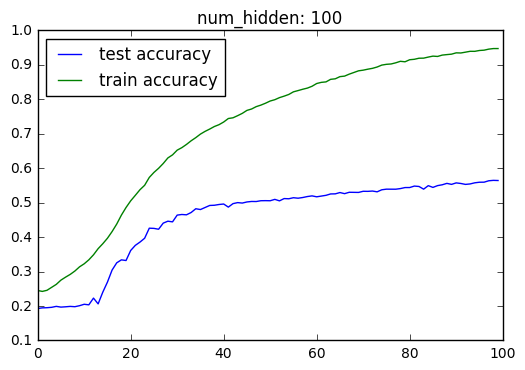

Train max accuracy:0.947
Test max accuracy:0.565


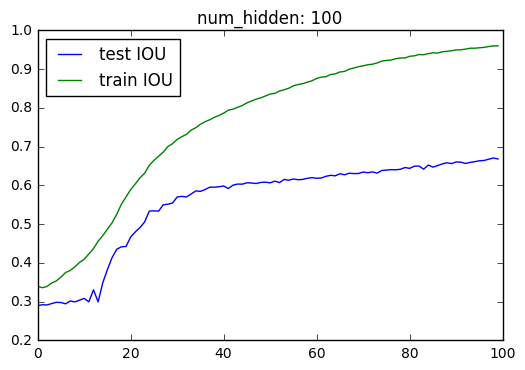

Train max IOU:0.960
Test max IOU:0.671


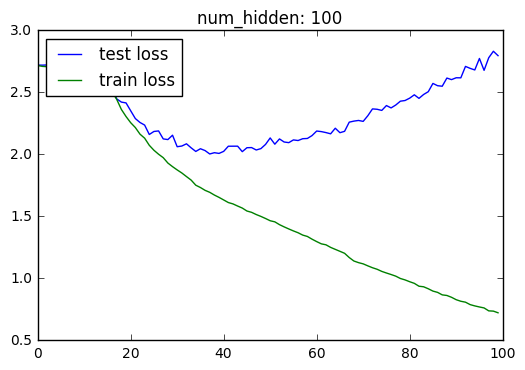

Train min loss:0.723
Test min loss:2.004
---------------------------------------------------------------------------------------------------- 



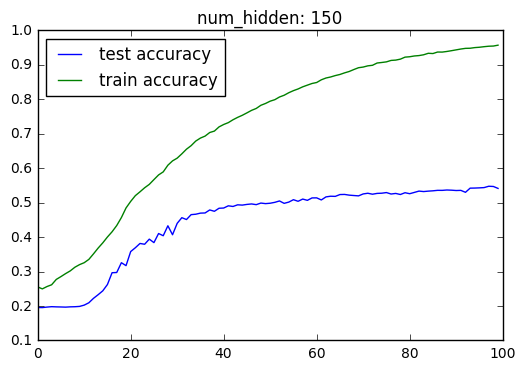

Train max accuracy:0.957
Test max accuracy:0.548


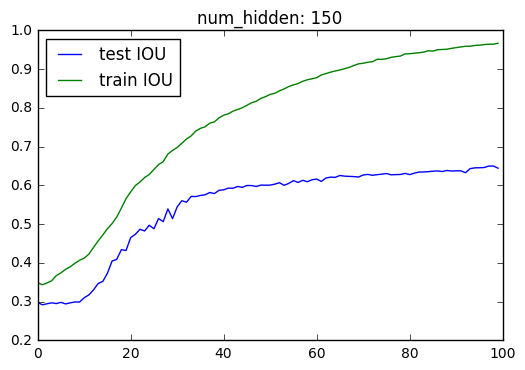

Train max IOU:0.967
Test max IOU:0.650


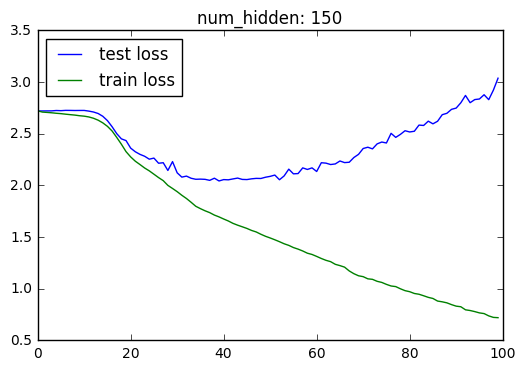

Train min loss:0.720
Test min loss:2.043
---------------------------------------------------------------------------------------------------- 



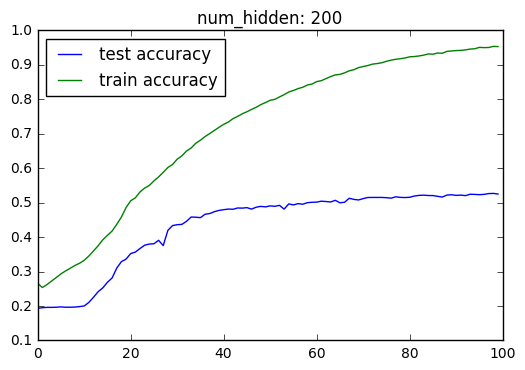

Train max accuracy:0.954
Test max accuracy:0.527


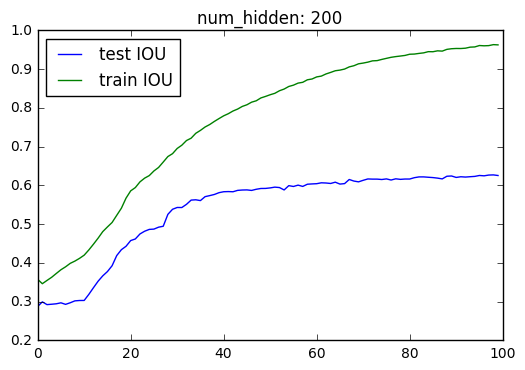

Train max IOU:0.963
Test max IOU:0.627


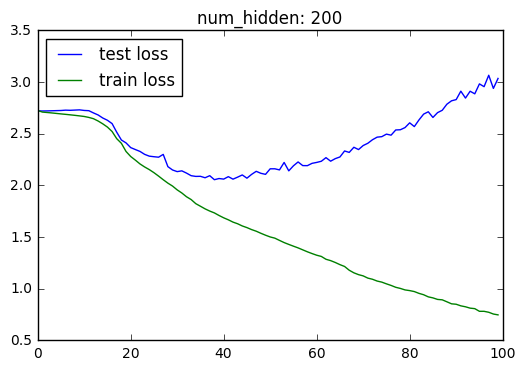

Train min loss:0.748
Test min loss:2.056
---------------------------------------------------------------------------------------------------- 

#################################################################################################### 

dropin_in: 0.5
dropin_out: 0.5
####################################################################################################


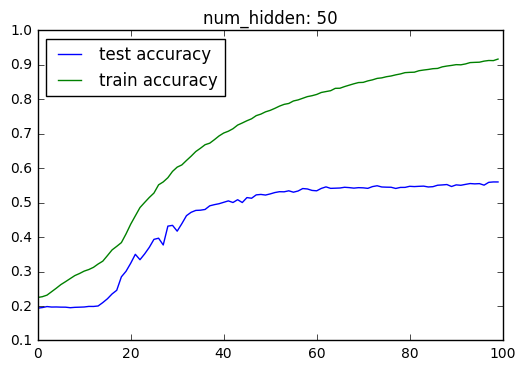

Train max accuracy:0.917
Test max accuracy:0.560


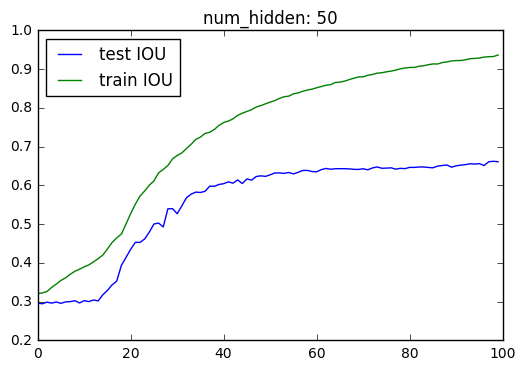

Train max IOU:0.937
Test max IOU:0.662


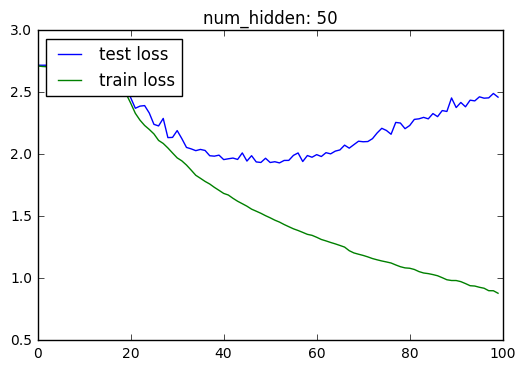

Train min loss:0.881
Test min loss:1.932
---------------------------------------------------------------------------------------------------- 



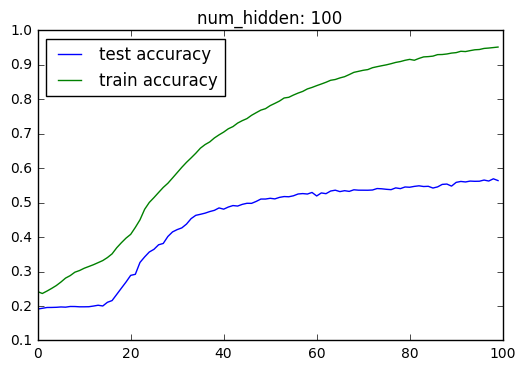

Train max accuracy:0.952
Test max accuracy:0.569


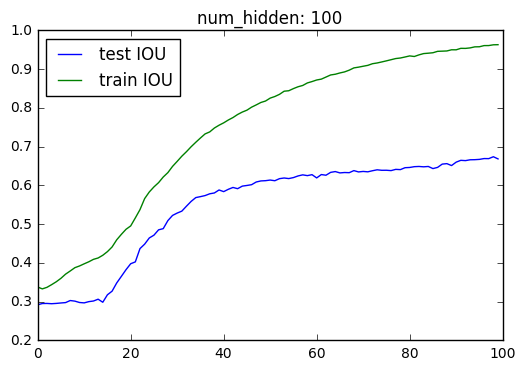

Train max IOU:0.963
Test max IOU:0.674


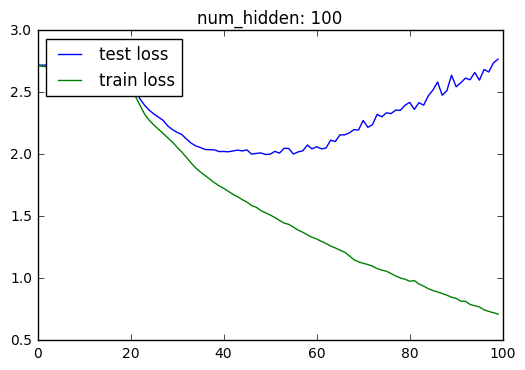

Train min loss:0.713
Test min loss:2.000
---------------------------------------------------------------------------------------------------- 



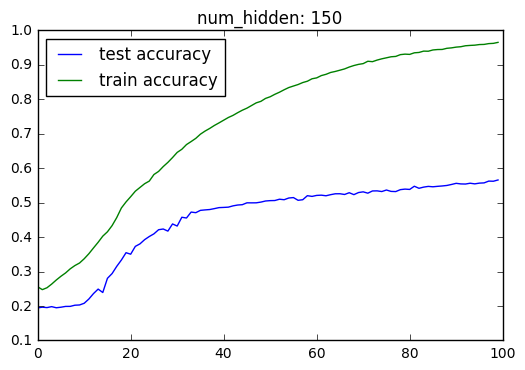

Train max accuracy:0.965
Test max accuracy:0.566


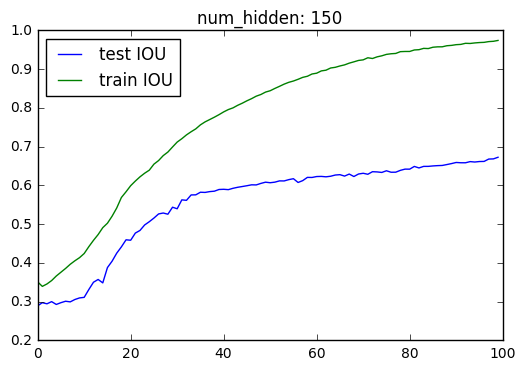

Train max IOU:0.974
Test max IOU:0.673


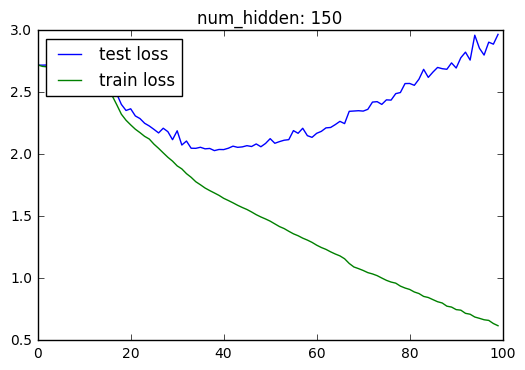

Train min loss:0.619
Test min loss:2.031
---------------------------------------------------------------------------------------------------- 



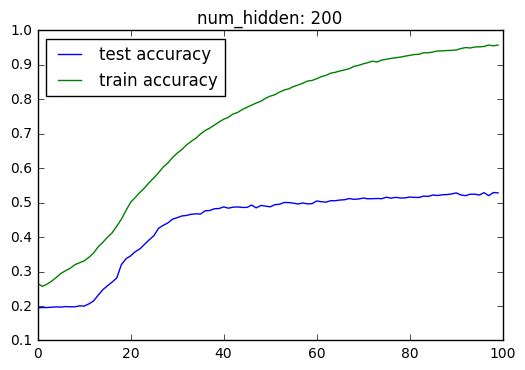

Train max accuracy:0.958
Test max accuracy:0.529


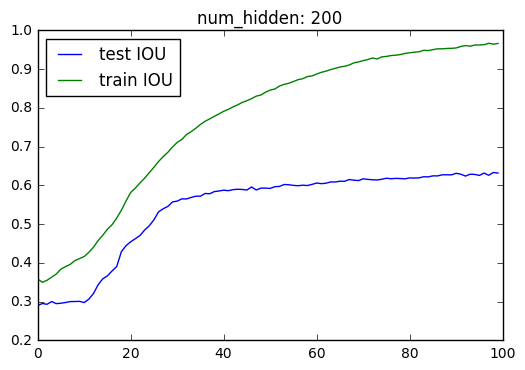

Train max IOU:0.967
Test max IOU:0.634


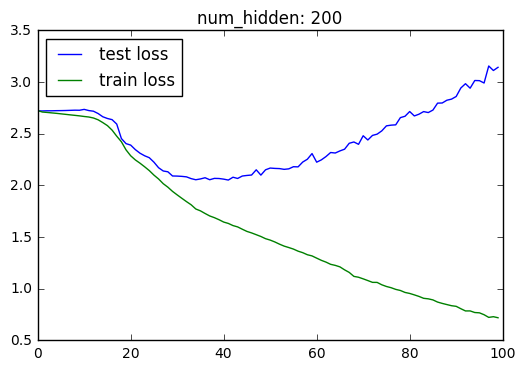

Train min loss:0.720
Test min loss:2.052
---------------------------------------------------------------------------------------------------- 

#################################################################################################### 



In [51]:
for i, drops in enumerate(dropouts):
    print('dropin_in:', drops[0])
    print('dropin_out:', drops[1])
    print('#'*100)
    stats(drop_tst[4*i:4*(i+1)], drop_trn[4*i:4*(i+1)], title='num_hidden')
    print('#'*100, '\n')

In [19]:
arr = [] 
for j, drops in enumerate([[1., 0.5], [0.5, 1.], [0.5, 0.5]]):
    for i, num_hidden in enumerate([50, 100, 150, 200]):
        arr.append([drops[0], 
                    drops[1],
                    num_hidden, 
                    max(np.array(drop_tst[4*j+i])[:,0]), 
                    max(np.array(drop_trn[4*j+i])[:,0]), 
                    max(np.array(drop_tst[4*j+i])[:,1]), 
                    max(np.array(drop_trn[4*j+i])[:,1]), 
                    min(np.array(drop_tst[4*j+i])[:,2]), 
                    min(np.array(drop_trn[4*j+i])[:,2])])
print(tabulate(arr, tablefmt='fancy_grid', headers=['Drop in', 'Drop out', 'Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss']))

╒═══════════╤════════════╤══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Drop in │   Drop out │   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞═══════════╪════════════╪══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│       1   │        0.5 │           50 │        0.604394 │         0.952189 │   0.709832 │    0.966027 │     1.91917 │     0.533846 │
├───────────┼────────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│       1   │        0.5 │          100 │        0.607946 │         0.968098 │   0.716936 │    0.976549 │     2.02054 │     0.451901 │
├───────────┼────────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│       1   │        0.5 │          150 │        0.5807

### Image and query embeddings drop outs

In [53]:
edit_reward=0
num_hiddens = [50, 100, 150, 200]
dropouts = [[1., 0.5], [0.5, 1.], [0.5, 0.5]]
drop_tst, drop_trn = [], []

for drop in dropouts:
    for num_hidden in num_hiddens:
        params_dir = params_dir_tmp+'RL/EXP/drop_q:'+str(drop[0])+'_drop_im:'+str(drop[1])+'_drop_hidden:'+str(num_hidden)
        tf.reset_default_graph()
        m = Model(
            batch_size=200, 
            num_hidden=num_hidden,
            embed_size=embed_vecs.shape[1],
            img_dims=trainset[0][0][1][0].shape[1], 
            bbox_dims=trainset[0][0][1][1].shape[1], 
            lr=.05,
            vocab=vocab, 
            decay_steps=10000, 
            decay_rate=0.9, 
            coefAlr=1,
            bnorm=False,
            toQscale=False
        )

        print('drop_q:', drop[0])
        print('drop_img:', drop[1])
        print('edit_reward:', edit_reward)
        print('params_dir:', params_dir)
        print('num_hidden:', m.num_hidden)
        print('learning rate:', m.lr)
        tst, trn, _, _ = m.train(trainset, testset,
                ephocs_num=100,
                start_ephoc=0,
                startA=101,
                activation_ephoc=101,
                muteB=2, 
                editProb=0.8,
                edit_reward=edit_reward,
                rnn_editProb=0.2,
                onlyB=True,
                dropout_q=drop[0],
                dropout_img=drop[1])

        drop_tst.append(tst)
        drop_trn.append(trn)

        print('\n'+'*'*100)
        print('*'*100)
        print('*'*100,'\n')     

drop_q: 1.0
drop_img: 0.5
edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/drop_q:1.0_drop_im:0.5_drop_hidden:50
num_hidden: 50
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.878 ;acc:0.255 ;iou:0.355 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.357 ;acc:0.115 ;iou:0.225 ;time: 0:00:11
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.914 ;acc:0.075 ;iou:0.155 ;time: 0:00:27
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:2.874 ;acc:0.150 ;iou:0.210 ;time: 0:00:41
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.254 ;acc:0.285 ;iou:0.415 ;time: 0:00:57
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:3.348 ;acc:0.100 ;iou:0.260 ;time: 0:01:07

*Training B: True ;B Train loss: 2.715 ;Train accuracy: 0.217 ;IOU accuracy: 0.314 ;Time: 0:01:15 

Testing, ephoc: 0
batch: 0 ;B loss: 1.387 ;acc: 0.520 ;i

In [54]:
np.save(open('../data/training/results/dropqim_tst.bin', 'wb'), drop_tst)
np.save(open('../data/training/results/dropqim_trn.bin', 'wb'), drop_trn)

dropin_q: 1.0
dropin_im: 0.5
####################################################################################################


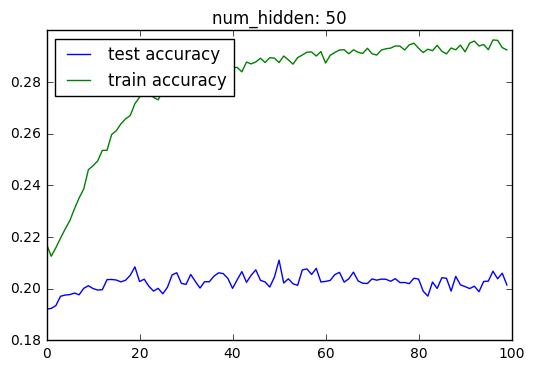

Train max accuracy:0.296
Test max accuracy:0.211


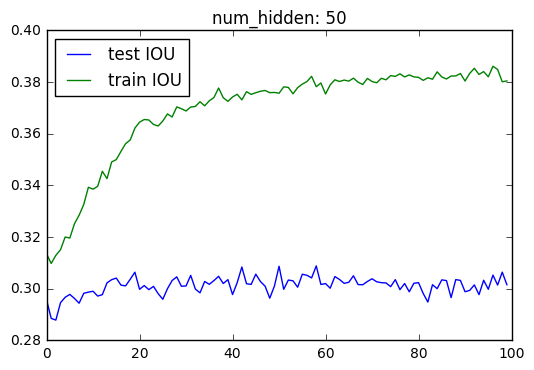

Train max IOU:0.386
Test max IOU:0.309


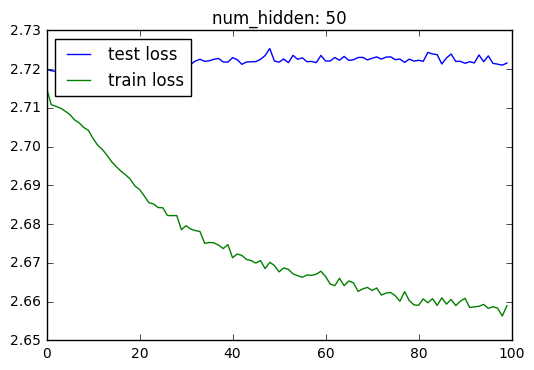

Train min loss:2.656
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 



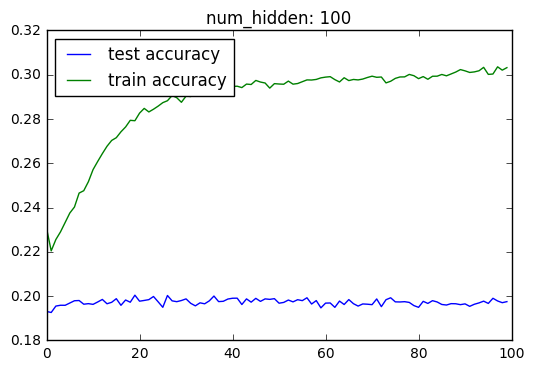

Train max accuracy:0.304
Test max accuracy:0.200


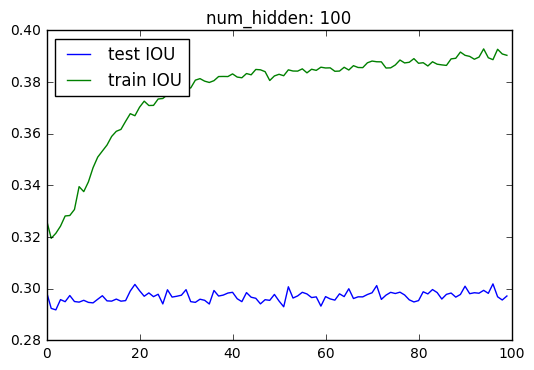

Train max IOU:0.393
Test max IOU:0.302


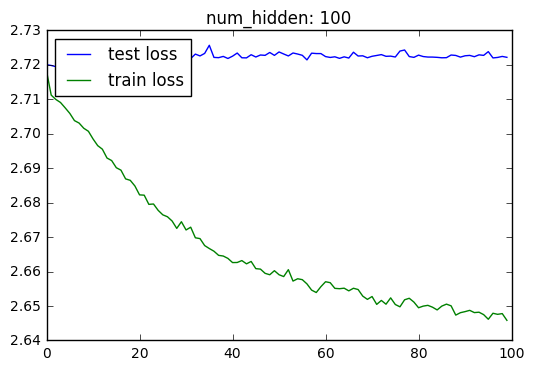

Train min loss:2.646
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 



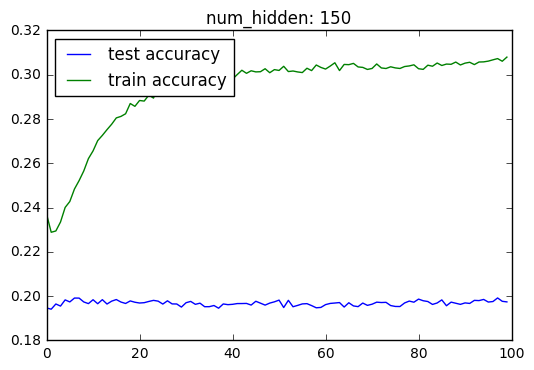

Train max accuracy:0.308
Test max accuracy:0.199


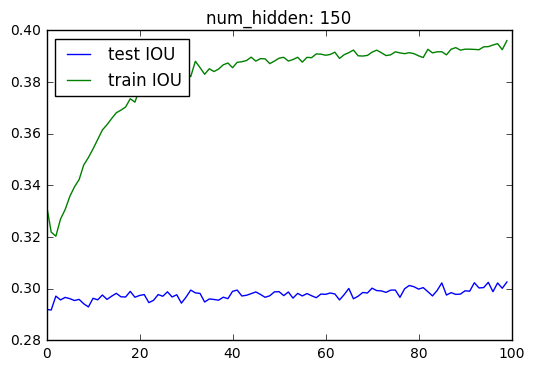

Train max IOU:0.396
Test max IOU:0.303


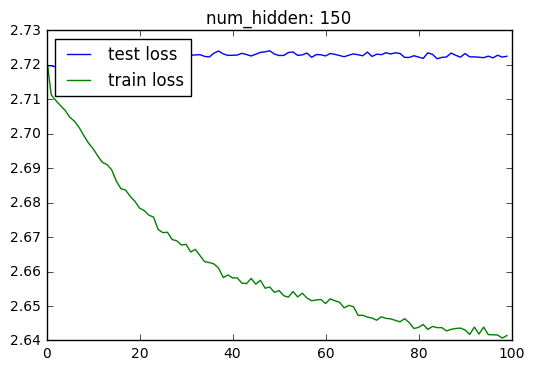

Train min loss:2.641
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 



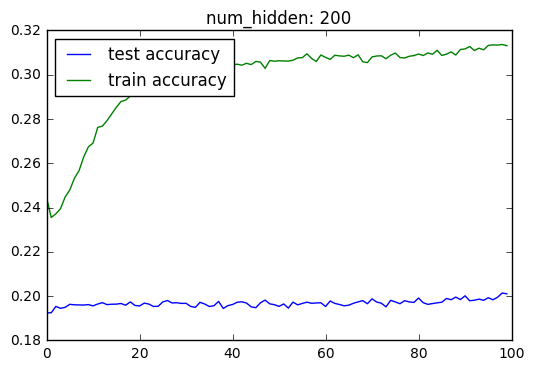

Train max accuracy:0.314
Test max accuracy:0.201


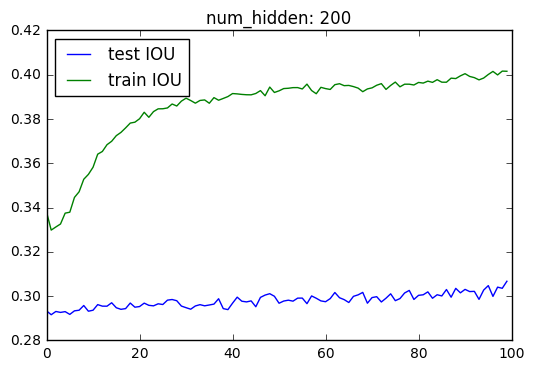

Train max IOU:0.402
Test max IOU:0.307


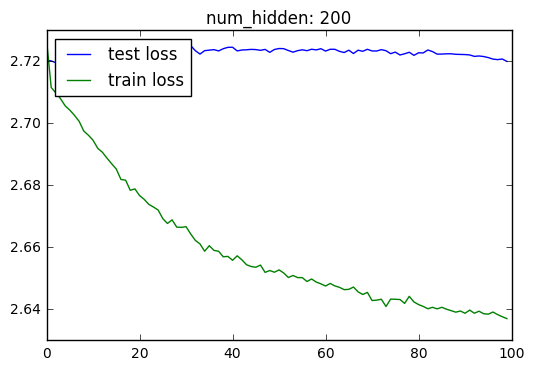

Train min loss:2.637
Test min loss:2.720
---------------------------------------------------------------------------------------------------- 

#################################################################################################### 

dropin_q: 0.5
dropin_im: 1.0
####################################################################################################


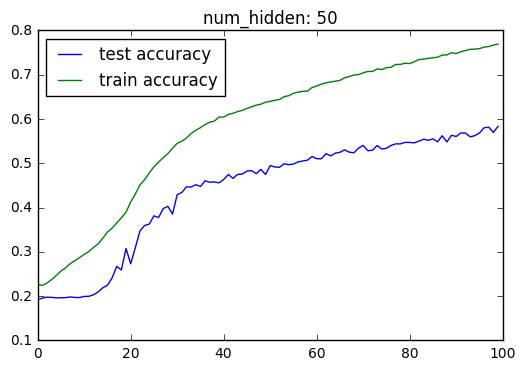

Train max accuracy:0.769
Test max accuracy:0.584


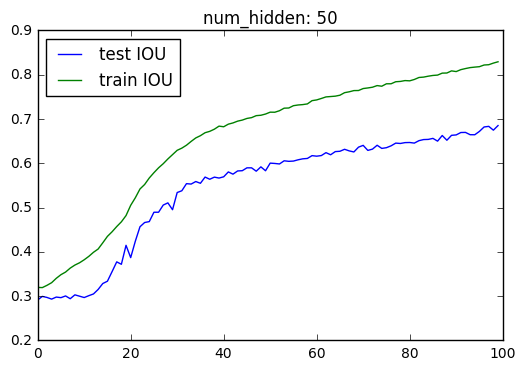

Train max IOU:0.829
Test max IOU:0.685


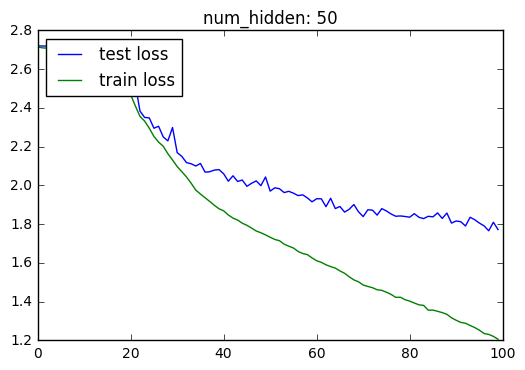

Train min loss:1.207
Test min loss:1.766
---------------------------------------------------------------------------------------------------- 



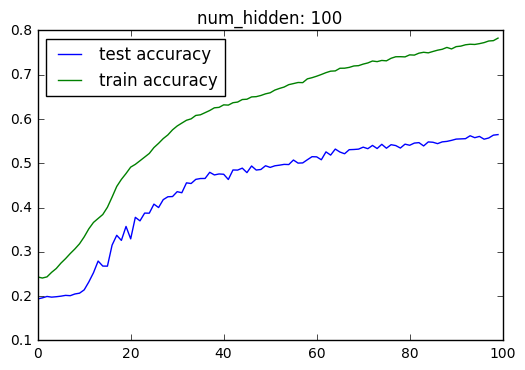

Train max accuracy:0.783
Test max accuracy:0.565


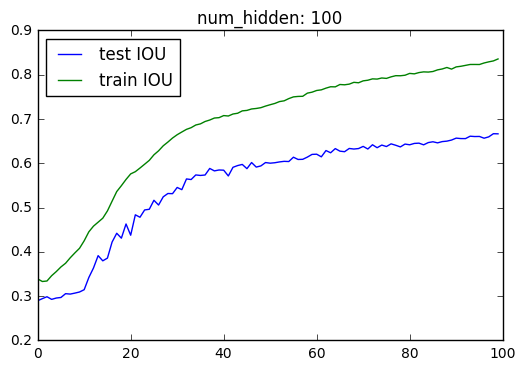

Train max IOU:0.836
Test max IOU:0.667


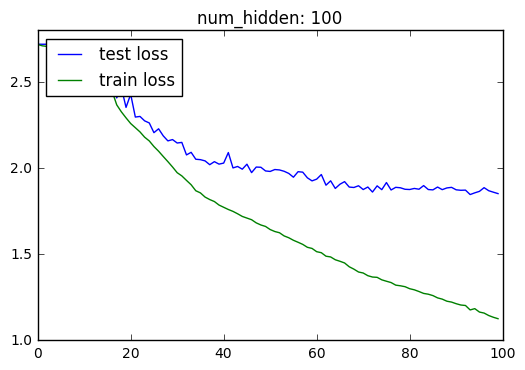

Train min loss:1.126
Test min loss:1.847
---------------------------------------------------------------------------------------------------- 



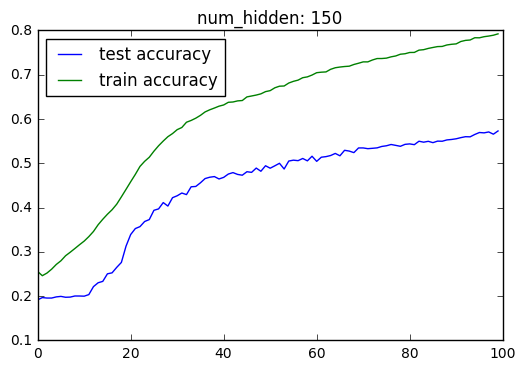

Train max accuracy:0.792
Test max accuracy:0.573


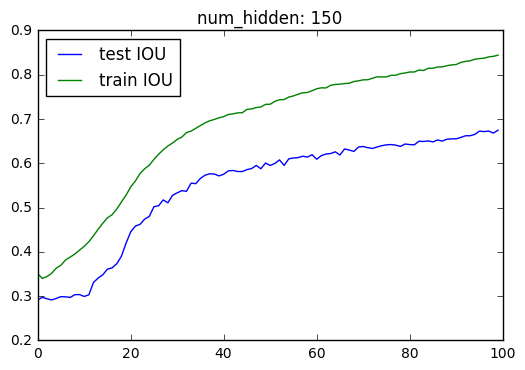

Train max IOU:0.844
Test max IOU:0.675


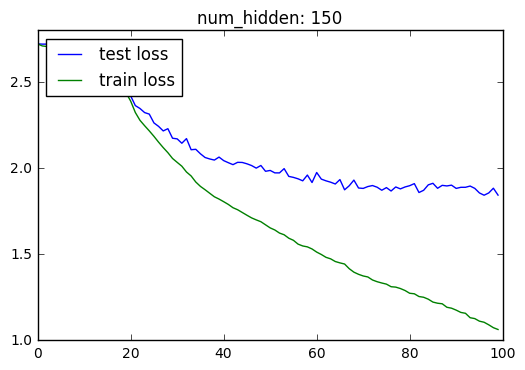

Train min loss:1.064
Test min loss:1.843
---------------------------------------------------------------------------------------------------- 



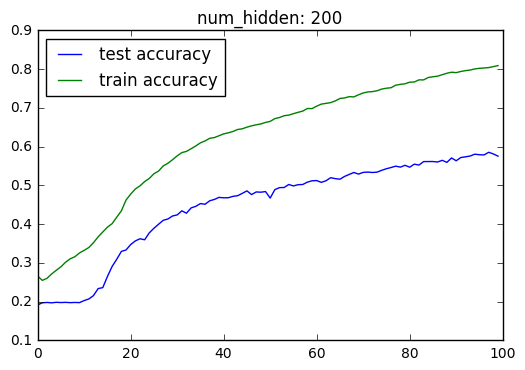

Train max accuracy:0.809
Test max accuracy:0.586


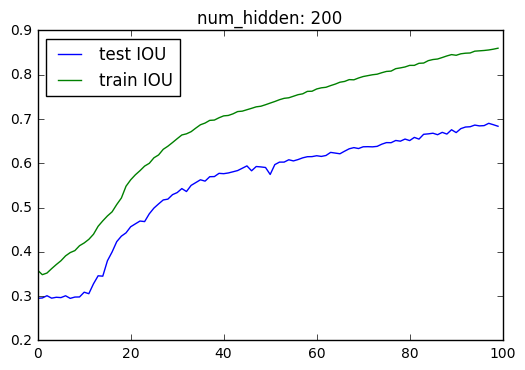

Train max IOU:0.860
Test max IOU:0.690


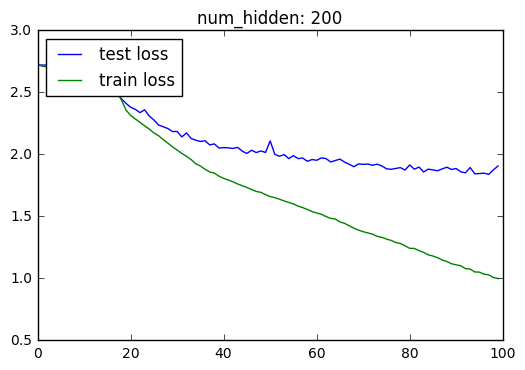

Train min loss:0.999
Test min loss:1.839
---------------------------------------------------------------------------------------------------- 

#################################################################################################### 

dropin_q: 0.5
dropin_im: 0.5
####################################################################################################


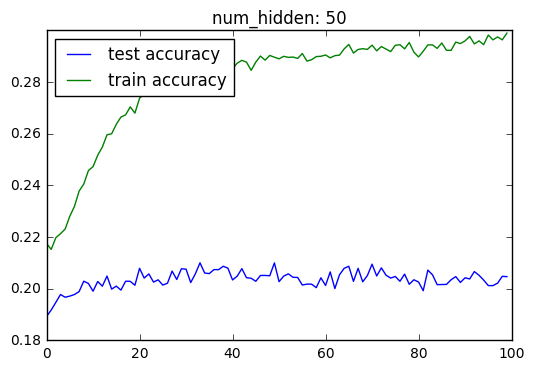

Train max accuracy:0.299
Test max accuracy:0.210


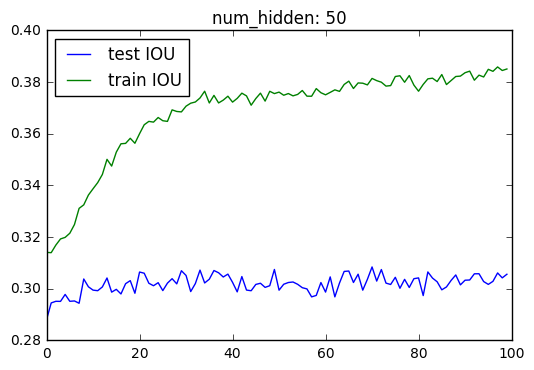

Train max IOU:0.386
Test max IOU:0.308


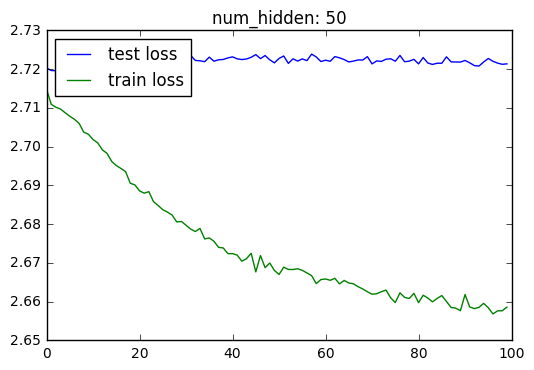

Train min loss:2.657
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 



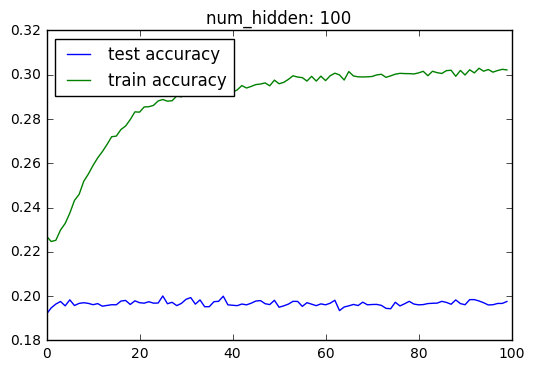

Train max accuracy:0.303
Test max accuracy:0.200


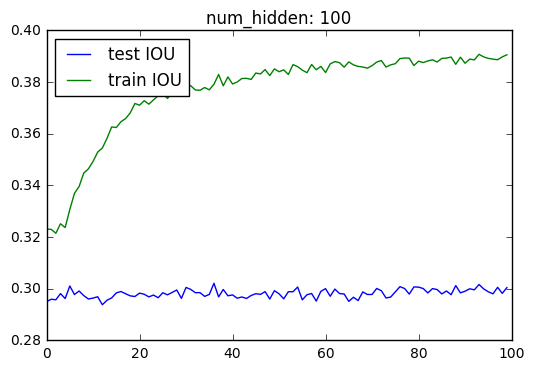

Train max IOU:0.391
Test max IOU:0.302


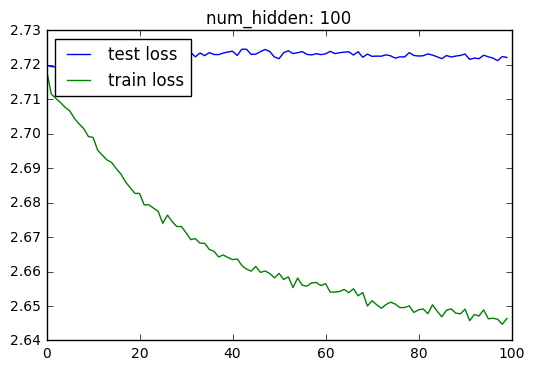

Train min loss:2.645
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 



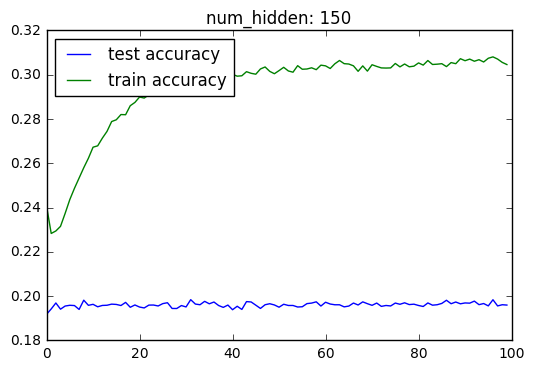

Train max accuracy:0.308
Test max accuracy:0.198


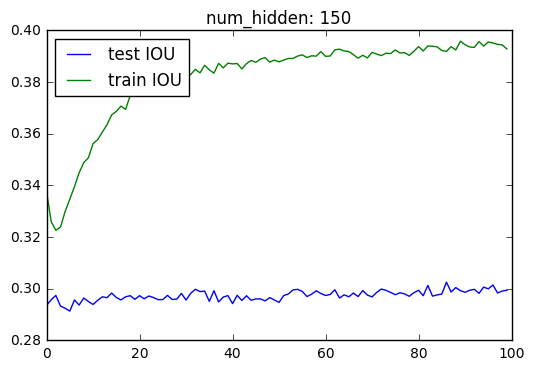

Train max IOU:0.396
Test max IOU:0.303


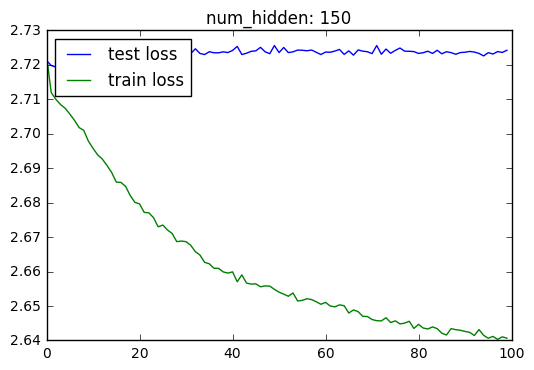

Train min loss:2.640
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 



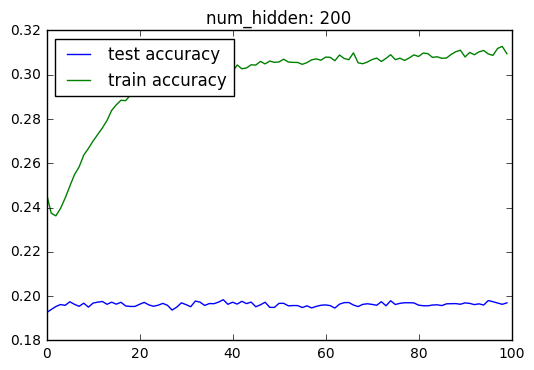

Train max accuracy:0.313
Test max accuracy:0.198


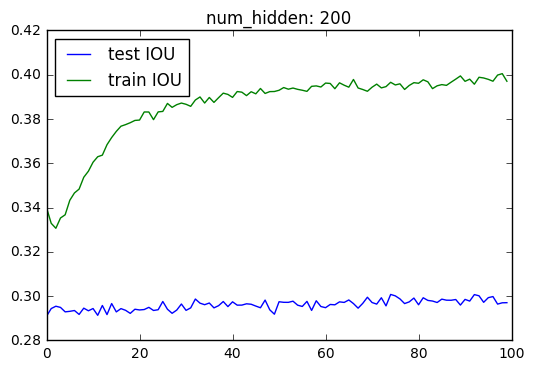

Train max IOU:0.400
Test max IOU:0.301


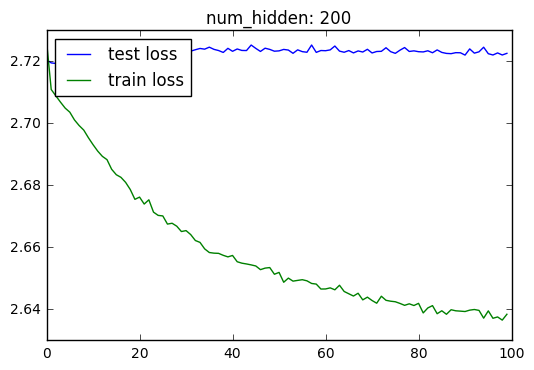

Train min loss:2.637
Test min loss:2.719
---------------------------------------------------------------------------------------------------- 

#################################################################################################### 



In [55]:
for i, drops in enumerate(dropouts):
    print('dropin_q:', drops[0])
    print('dropin_im:', drops[1])
    print('#'*100)
    stats(drop_tst[4*i:4*(i+1)], drop_trn[4*i:4*(i+1)], title='num_hidden')
    print('#'*100, '\n')

In [21]:
arr = [] 
for j, drops in enumerate([[1., 0.5], [0.5, 1.], [0.5, 0.5]]):
    for i, num_hidden in enumerate([50, 100, 150, 200]):
        arr.append([drops[0], 
                    drops[1],
                    num_hidden, 
                    max(np.array(drop_tst[4*j+i])[:,0]), 
                    max(np.array(drop_trn[4*j+i])[:,0]), 
                    max(np.array(drop_tst[4*j+i])[:,1]), 
                    max(np.array(drop_trn[4*j+i])[:,1]), 
                    min(np.array(drop_tst[4*j+i])[:,2]), 
                    min(np.array(drop_trn[4*j+i])[:,2])])
print(tabulate(arr, tablefmt='fancy_grid', headers=['Drop in', 'Drop out', 'Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss']))

╒═══════════╤════════════╤══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Drop in │   Drop out │   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞═══════════╪════════════╪══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│       1   │        0.5 │           50 │        0.211077 │         0.296313 │   0.308855 │    0.386145 │     2.7188  │     2.6563   │
├───────────┼────────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│       1   │        0.5 │          100 │        0.200438 │         0.303569 │   0.301886 │    0.392862 │     2.71892 │     2.64583  │
├───────────┼────────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│       1   │        0.5 │          150 │        0.1991

## Image normalization 

In [10]:
edit_reward=0
num_hidden = 200
stds = [1/i for i in range(10, 80, 10)]
imSc_tst, imSc_trn = [], []

for std in stds:
    params_dir = params_dir_tmp+'RL/EXP/img_std:'+str(std)+'_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=False
    )

    print('std:', std)
    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True,
            imScale=std)

    imSc_tst.append(tst)
    imSc_trn.append(trn)

    print('\n'+'*'*100)54
    print('*'*100)
    print('*'*100,'\n') 

std: 0.1
edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/img_std:0.1_hidden:200
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.704 ;acc:0.195 ;iou:0.265 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.441 ;acc:0.065 ;iou:0.215 ;time: 0:00:13
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.851 ;acc:0.050 ;iou:0.170 ;time: 0:00:28
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.251 ;acc:0.105 ;iou:0.215 ;time: 0:00:40
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:3.237 ;acc:0.185 ;iou:0.280 ;time: 0:00:53
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.510 ;acc:0.165 ;iou:0.245 ;time: 0:01:06

*Training B: True ;B Train loss: 2.710 ;Train accuracy: 0.212 ;IOU accuracy: 0.310 ;Time: 0:01:19 

Testing, ephoc: 0
batch: 0 ;B loss: 1.378 ;acc: 0.575 ;iou_acc: 0.730 ;time: 0:01:19
ba

In [11]:
np.save(open('../data/training/results/imSc_tst.bin', 'wb'), imSc_tst)
np.save(open('../data/training/results/imSc_trn.bin', 'wb'), imSc_trn)

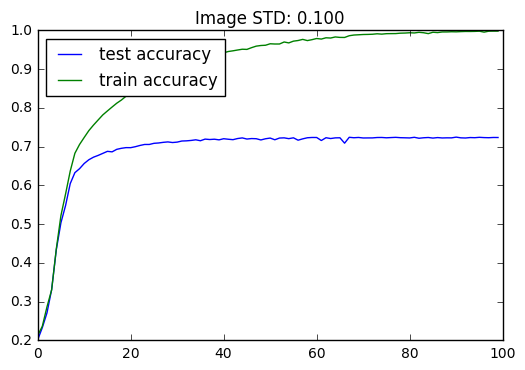

Train max accuracy:0.998
Test max accuracy:0.725


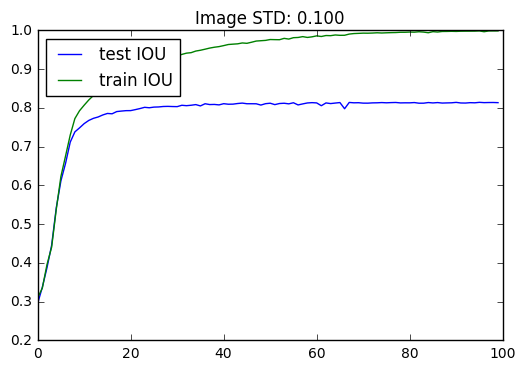

Train max IOU:0.999
Test max IOU:0.814


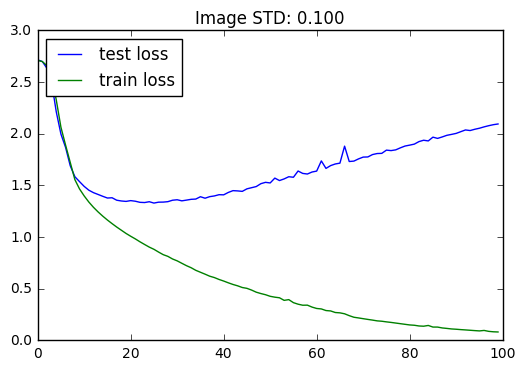

Train min loss:0.082
Test min loss:1.329
---------------------------------------------------------------------------------------------------- 



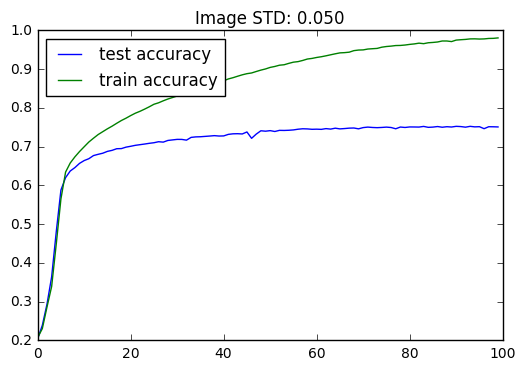

Train max accuracy:0.981
Test max accuracy:0.753


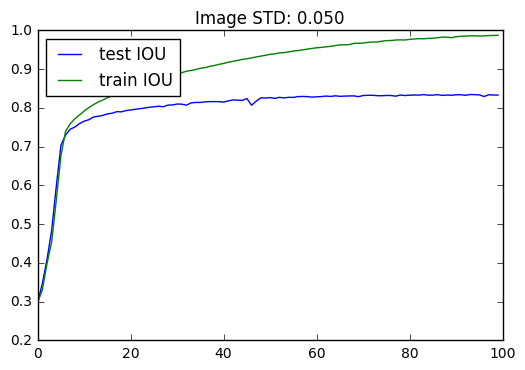

Train max IOU:0.988
Test max IOU:0.835


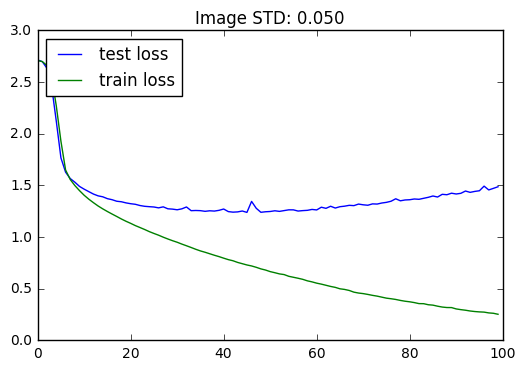

Train min loss:0.253
Test min loss:1.239
---------------------------------------------------------------------------------------------------- 



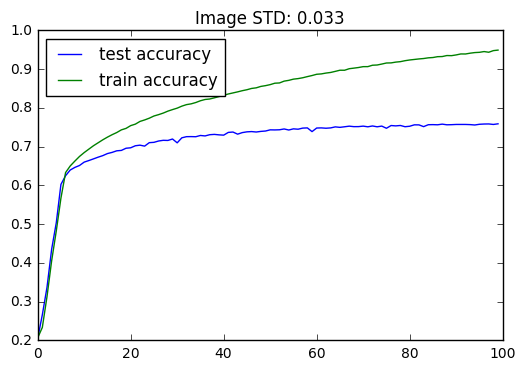

Train max accuracy:0.949
Test max accuracy:0.759


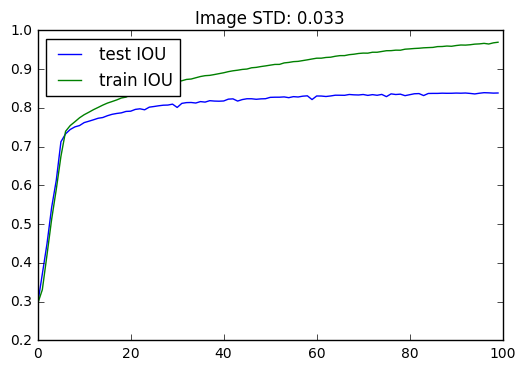

Train max IOU:0.970
Test max IOU:0.839


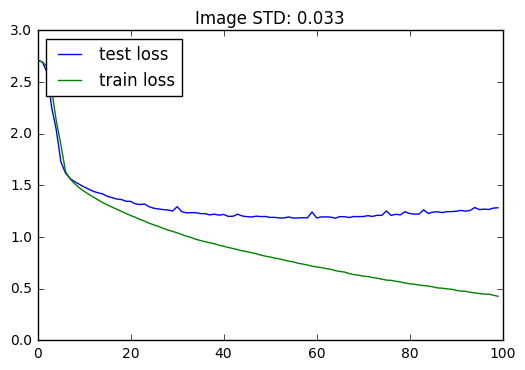

Train min loss:0.427
Test min loss:1.184
---------------------------------------------------------------------------------------------------- 



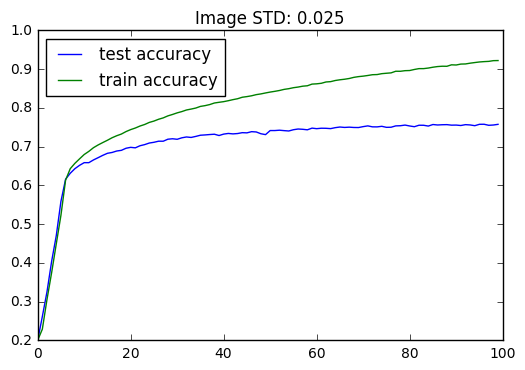

Train max accuracy:0.922
Test max accuracy:0.758


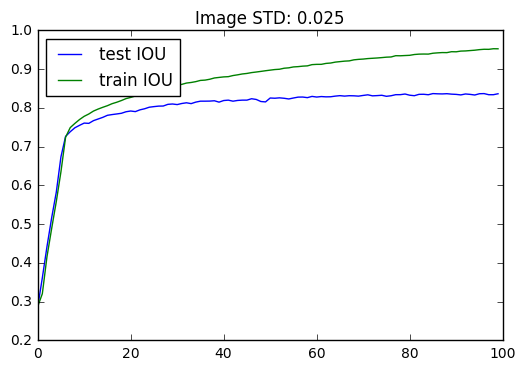

Train max IOU:0.953
Test max IOU:0.837


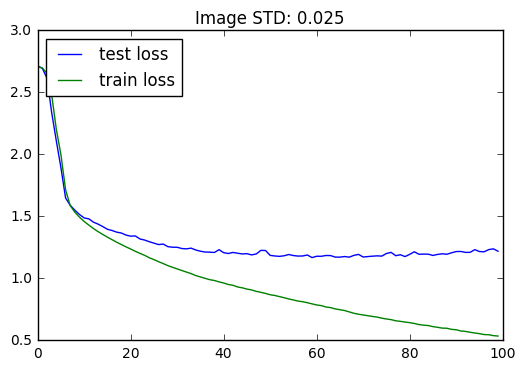

Train min loss:0.535
Test min loss:1.168
---------------------------------------------------------------------------------------------------- 



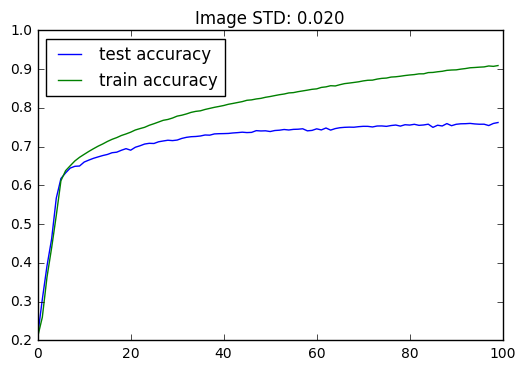

Train max accuracy:0.909
Test max accuracy:0.762


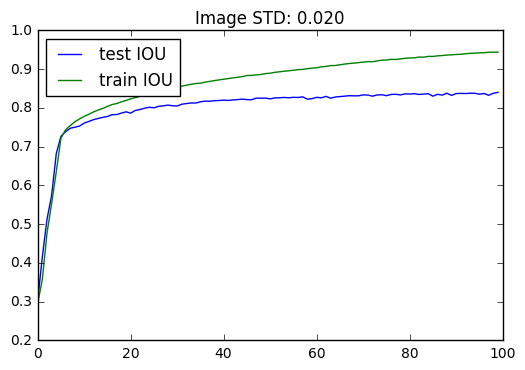

Train max IOU:0.944
Test max IOU:0.840


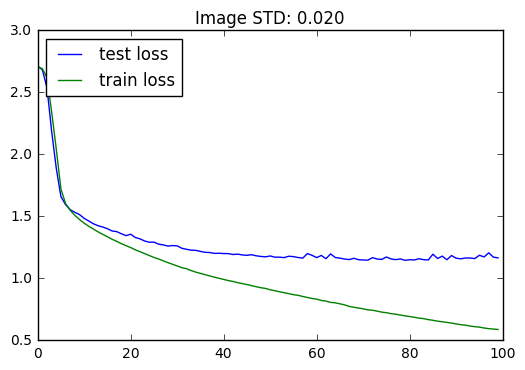

Train min loss:0.588
Test min loss:1.146
---------------------------------------------------------------------------------------------------- 



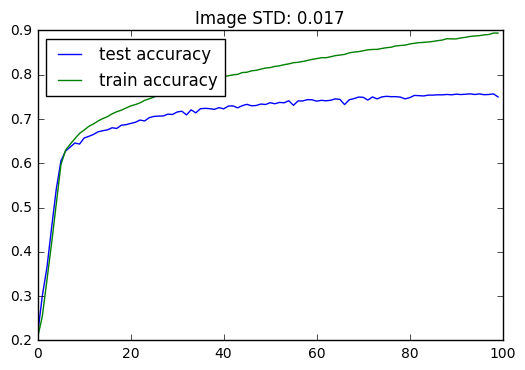

Train max accuracy:0.894
Test max accuracy:0.757


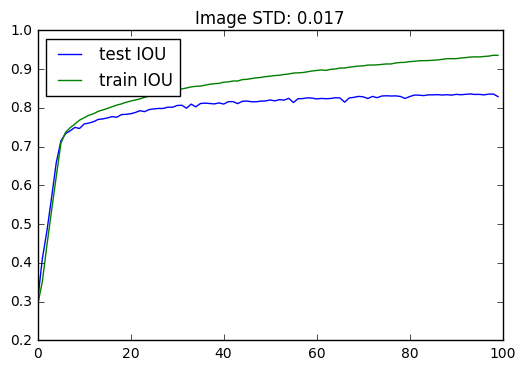

Train max IOU:0.936
Test max IOU:0.836


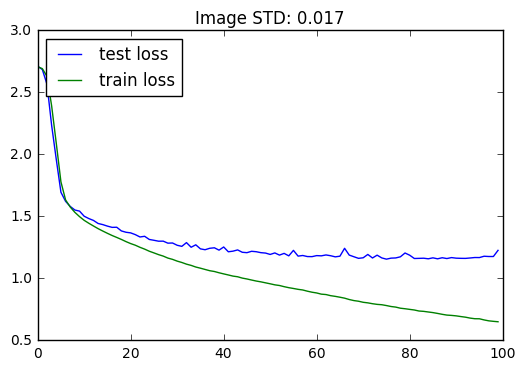

Train min loss:0.651
Test min loss:1.156
---------------------------------------------------------------------------------------------------- 



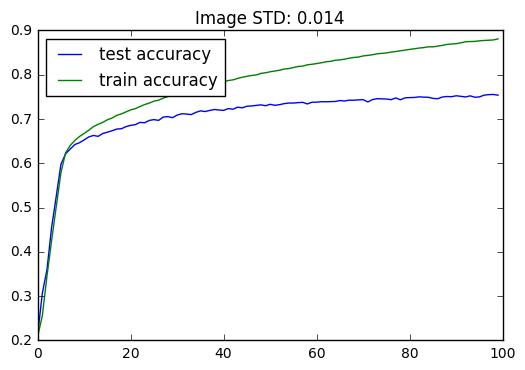

Train max accuracy:0.881
Test max accuracy:0.755


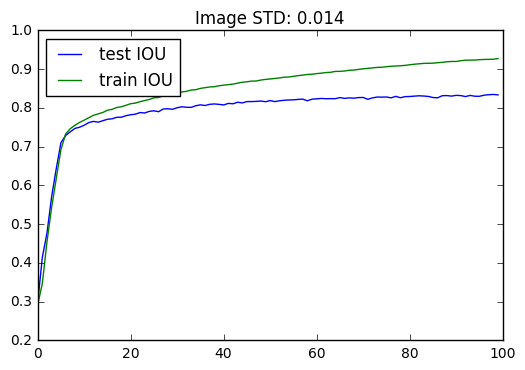

Train max IOU:0.927
Test max IOU:0.835


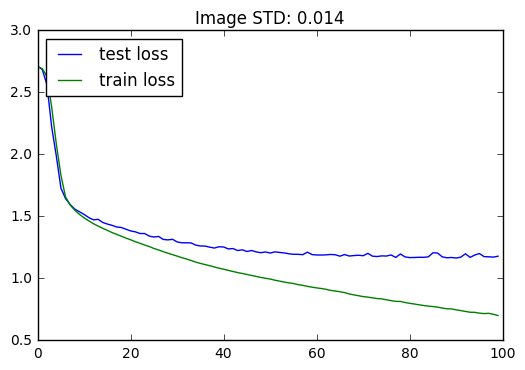

Train min loss:0.701
Test min loss:1.165
---------------------------------------------------------------------------------------------------- 



In [15]:
stats(imSc_tst, imSc_trn, ephocs=100, title='Image STD', params=[1/i for i in range(10, 80, 10)])

In [22]:
imSc_tst = np.load(open('../data/training/results/imSc_tst.bin', 'rb'))
imSc_trn = np.load(open('../data/training/results/imSc_trn.bin', 'rb'))

In [27]:
arr = [] 
for i, std in enumerate([1/i for i in range(10, 80, 10)]):
    arr.append([std, 
               max(np.array(imSc_tst[i])[:,0]), 
               max(np.array(imSc_trn[i])[:,0]), 
               max(np.array(imSc_tst[i])[:,1]), 
               max(np.array(imSc_trn[i])[:,1]), 
               min(np.array(imSc_tst[i])[:,2]), 
               min(np.array(imSc_tst[i])[:,2])])
print(tabulate(arr, tablefmt='fancy_grid', headers=['STD',  'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss']))

╒═══════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│       STD │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞═══════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│ 0.1       │        0.724697 │         0.998266 │   0.814444 │    0.998805 │     1.32944 │      1.32944 │
├───────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│ 0.05      │        0.752542 │         0.980741 │   0.83468  │    0.987811 │     1.23922 │      1.23922 │
├───────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│ 0.0333333 │        0.759057 │         0.949276 │   0.839377 │    0.969562 │     1.18354 │      1.18354 │
├───────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│ 0.025     │        0.757912 │      

### Image & query scaling

In [139]:
edit_reward=0
num_hidden = 200
stds = [1., 0.8, 0.5, 0.2, 0.1, 0.05]
qSc_tst, qSc_trn = [], []

for std in stds:
    params_dir = params_dir_tmp+'RL/EXP/q_std:'+str(std)+'_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=std
    )

    print('std:', std)
    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True,
            imScale=0.02)

    qSc_tst.append(tst)
    qSc_trn.append(trn)

    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n') 

std: 1.0
edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/q_std:1.0_hidden:200
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:3.252 ;acc:0.080 ;iou:0.135 ;time: 0:00:01
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.906 ;acc:0.090 ;iou:0.225 ;time: 0:00:25
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.573 ;acc:0.165 ;iou:0.285 ;time: 0:00:43
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.186 ;acc:0.295 ;iou:0.420 ;time: 0:01:02
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.736 ;acc:0.475 ;iou:0.570 ;time: 0:01:20
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.235 ;acc:0.510 ;iou:0.625 ;time: 0:01:38

*Training B: True ;B Train loss: 2.595 ;Train accuracy: 0.416 ;IOU accuracy: 0.530 ;Time: 0:01:55 

Testing, ephoc: 0
batch: 0 ;B loss: 1.133 ;acc: 0.725 ;iou_acc: 0.850 ;time: 0:01:56
batc

In [142]:
np.save(open('../data/training/results/qSc_tst.bin', 'wb'), qSc_tst)
np.save(open('../data/training/results/qSc_trn.bin', 'wb'), qSc_trn)

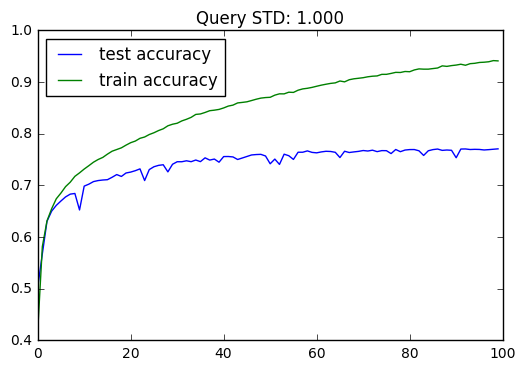

Train max accuracy:0.942
Test max accuracy:0.771


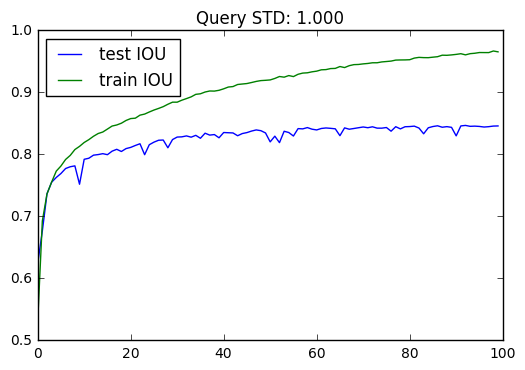

Train max IOU:0.967
Test max IOU:0.847


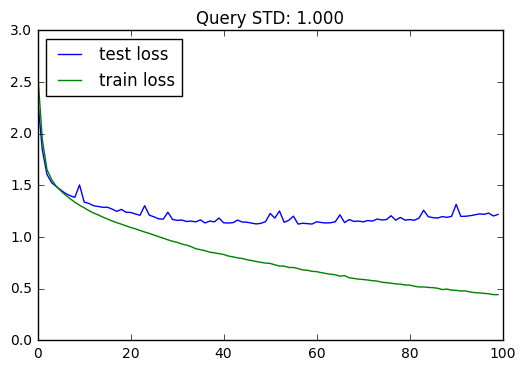

Train min loss:0.443
Test min loss:1.126
---------------------------------------------------------------------------------------------------- 



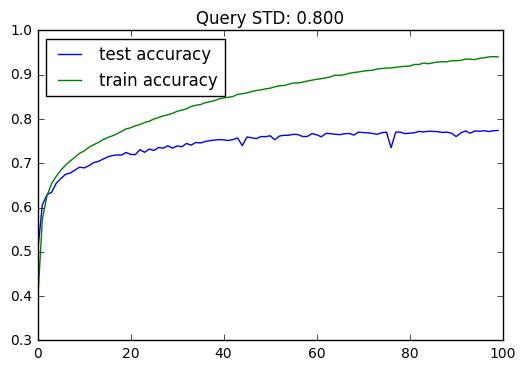

Train max accuracy:0.941
Test max accuracy:0.774


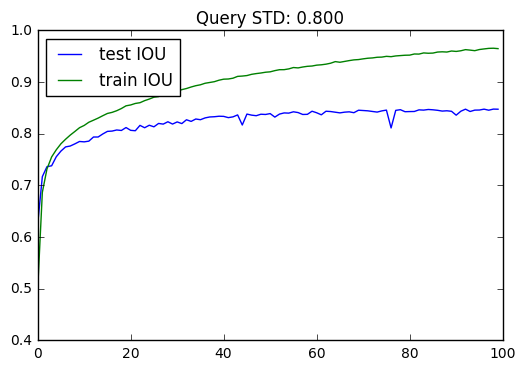

Train max IOU:0.966
Test max IOU:0.848


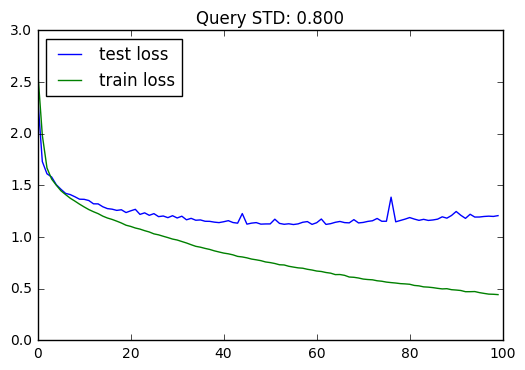

Train min loss:0.444
Test min loss:1.122
---------------------------------------------------------------------------------------------------- 



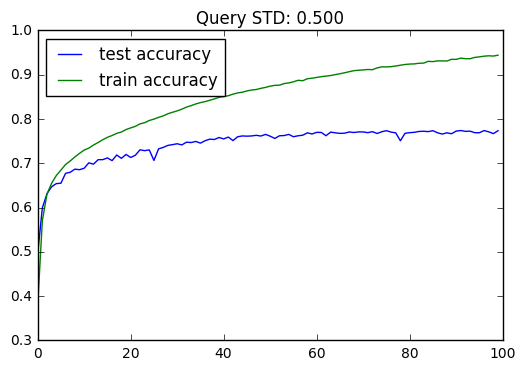

Train max accuracy:0.944
Test max accuracy:0.774


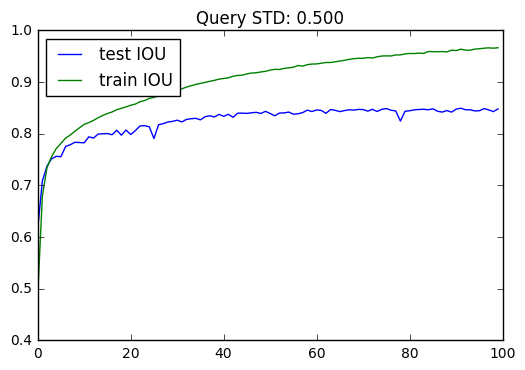

Train max IOU:0.967
Test max IOU:0.850


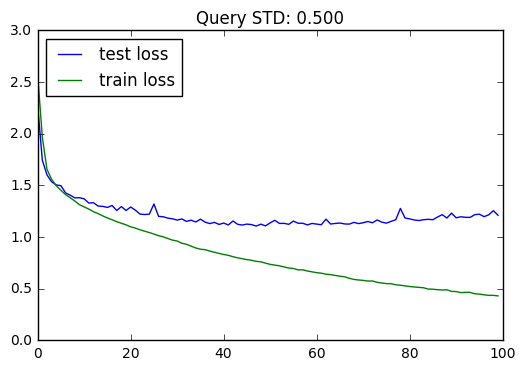

Train min loss:0.431
Test min loss:1.107
---------------------------------------------------------------------------------------------------- 



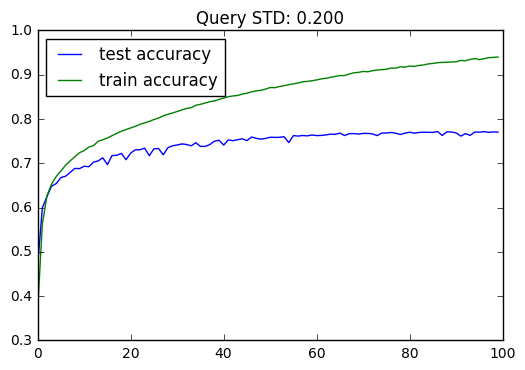

Train max accuracy:0.940
Test max accuracy:0.772


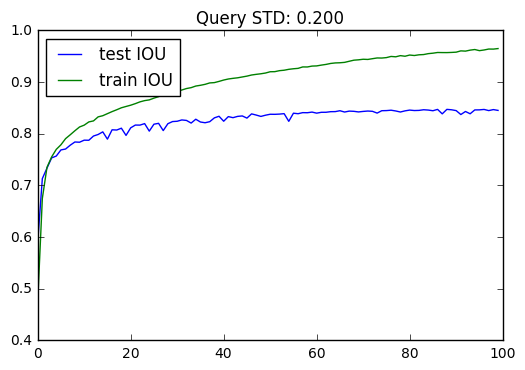

Train max IOU:0.965
Test max IOU:0.847


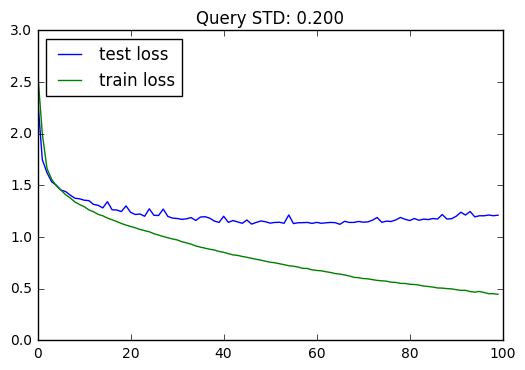

Train min loss:0.447
Test min loss:1.124
---------------------------------------------------------------------------------------------------- 



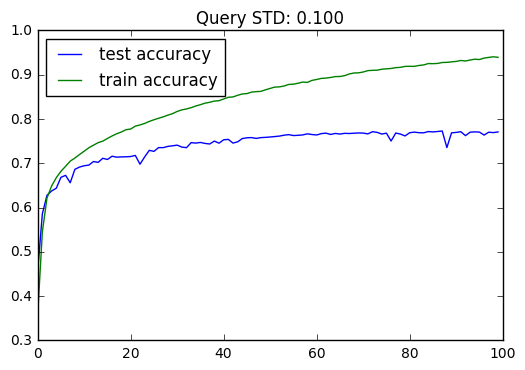

Train max accuracy:0.940
Test max accuracy:0.773


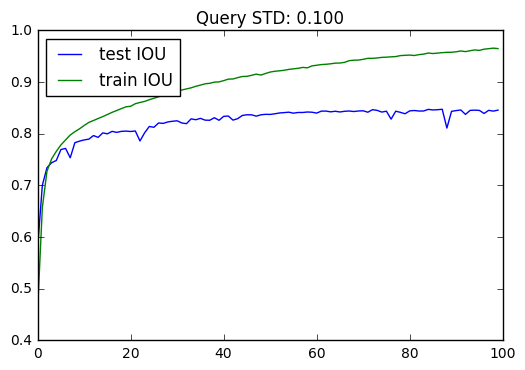

Train max IOU:0.966
Test max IOU:0.847


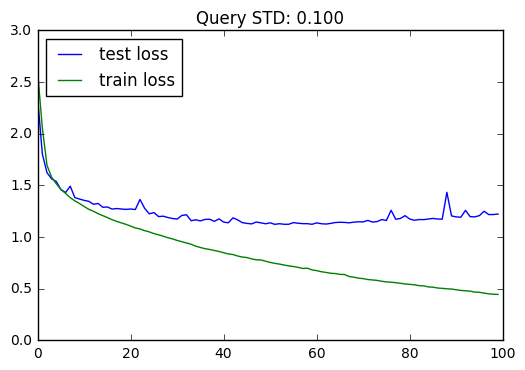

Train min loss:0.445
Test min loss:1.124
---------------------------------------------------------------------------------------------------- 



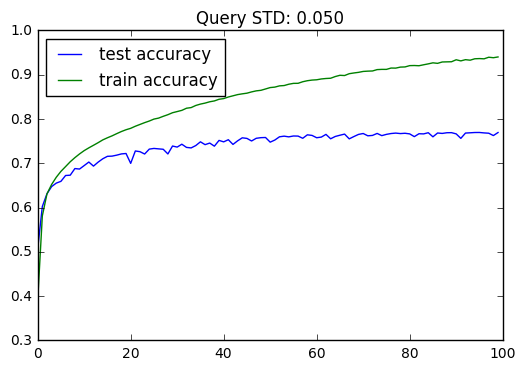

Train max accuracy:0.940
Test max accuracy:0.770


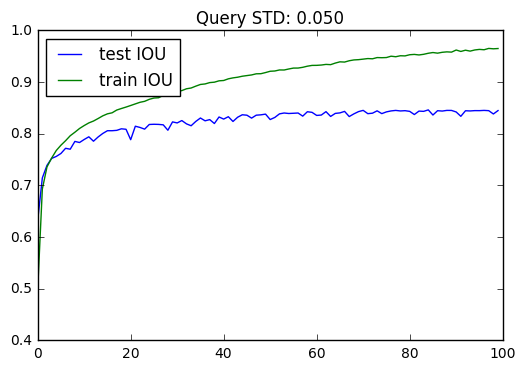

Train max IOU:0.965
Test max IOU:0.846


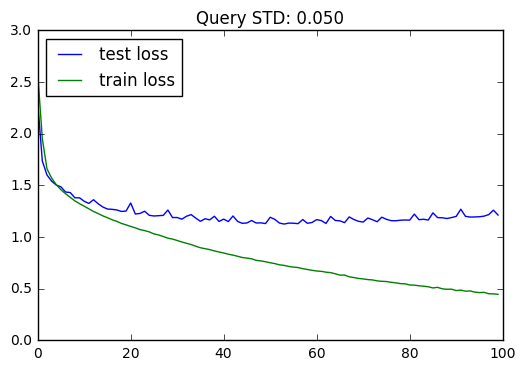

Train min loss:0.446
Test min loss:1.126
---------------------------------------------------------------------------------------------------- 



In [143]:
stats(qSc_tst, qSc_trn, ephocs=100, title='Query STD', params=[1., 0.8, 0.5, 0.2, 0.1, 0.05])

In [28]:
qSc_tst = np.load(open('../data/training/results/qSc_tst.bin', 'rb'))
qSc_trn = np.load(open('../data/training/results/qSc_trn.bin', 'rb'))

In [35]:
arr = [] 
for i, std in enumerate([1., 0.8, 0.5, 0.2, 0.1, 0.05]):
    arr.append([std, 
               max(np.array(qSc_tst[i])[:,0]), 
               max(np.array(qSc_trn[i])[:,0]), 
               max(np.array(qSc_tst[i])[:,1]), 
               max(np.array(qSc_trn[i])[:,1]), 
               min(np.array(qSc_tst[i])[:,2]), 
               min(np.array(qSc_trn[i])[:,2])])
print(tabulate(arr, tablefmt='fancy_grid', headers=['STD',  'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss']))

╒═══════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   STD │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞═══════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│  1    │        0.770825 │         0.941616 │   0.846818 │    0.966852 │     1.12614 │     0.443333 │
├───────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│  0.8  │        0.774175 │         0.94096  │   0.847761 │    0.965572 │     1.12169 │     0.443501 │
├───────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│  0.5  │        0.773973 │         0.944074 │   0.849529 │    0.966566 │     1.10712 │     0.43111  │
├───────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│  0.2  │        0.771785 │         0.94     │   0.847239 │    0.964916 │

### Image scaling & query batch normalization

In [14]:
edit_reward=0
num_hidden = 200
imScBnorm_tst, imScBnorm_trn = [], []


params_dir = params_dir_tmp+'RL/EXP/imScBnorm:_hidden:'+str(num_hidden)
tf.reset_default_graph()
m = Model(
    batch_size=200, 
    num_hidden=num_hidden,
    embed_size=embed_vecs.shape[1],
    img_dims=trainset[0][0][1][0].shape[1], 
    bbox_dims=trainset[0][0][1][1].shape[1], 
    lr=.05,
    vocab=vocab, 
    decay_steps=10000, 
    decay_rate=0.9, 
    coefAlr=1,
    bnorm=True,
    Urnn_norm=True,
    toQscale=False
)


print('params_dir:', params_dir)
print('learning rate:', m.lr)
tst, trn, _, _ = m.train(trainset, testset,
        ephocs_num=100,
        start_ephoc=0,
        startA=101,
        activation_ephoc=101,
        muteB=2, 
        editProb=0.8,
        edit_reward=edit_reward,
        rnn_editProb=0.2,
        onlyB=True,
        imScale=0.02)

imScBnorm_tst.append(tst)
imScBnorm_trn.append(trn)

print('\n'+'*'*100)
print('*'*100)
print('*'*100,'\n') 

params_dir: ../data/training/models/All/RL/EXP/imScBnorm:_hidden:200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:3.223 ;acc:0.110 ;iou:0.175 ;time: 0:00:01
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.853 ;acc:0.090 ;iou:0.190 ;time: 0:00:23
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:2.514 ;acc:0.225 ;iou:0.315 ;time: 0:00:46
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.169 ;acc:0.155 ;iou:0.305 ;time: 0:01:04
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:1.232 ;acc:0.380 ;iou:0.505 ;time: 0:01:26
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:1.636 ;acc:0.280 ;iou:0.405 ;time: 0:01:49

*Training B: True ;B Train loss: 2.108 ;Train accuracy: 0.277 ;IOU accuracy: 0.378 ;Time: 0:02:08 

Testing, ephoc: 0
batch: 0 ;B loss: 1.251 ;acc: 0.655 ;iou_acc: 0.790 ;time: 0:02:09
batch: 50 ;B loss: 2.119 ;acc: 0.365 ;iou_a

KeyboardInterrupt: 

In [17]:
np.save(open('../data/training/results/imScBnorm_tst.bin', 'wb'), imScBnorm_tst)
np.save(open('../data/training/results/imScBnorm_trn.bin', 'wb'), imScBnorm_trn)

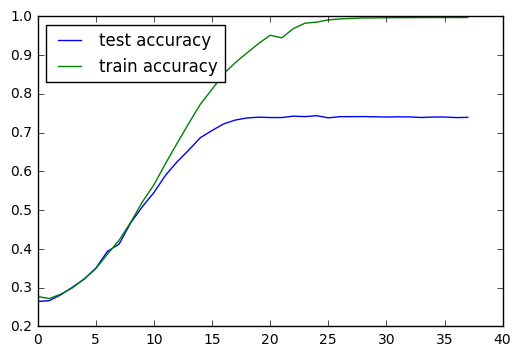

Train max accuracy:0.997
Test max accuracy:0.744


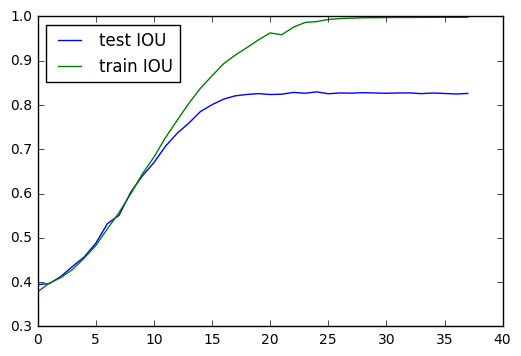

Train max IOU:0.998
Test max IOU:0.830


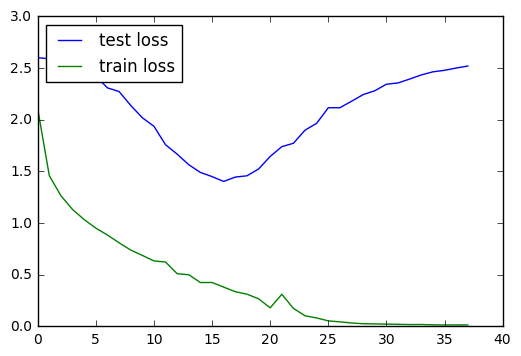

Train min loss:0.014
Test min loss:1.403
---------------------------------------------------------------------------------------------------- 



In [29]:
stats(np.expand_dims(m.test_res[:38], 0), np.expand_dims(m.train_res[:38], 0), ephocs=38, params=[200])

## Dropout


In [16]:
edit_reward=0
num_hidden = 200
dropouts = [[1., 0.5], [0.5, 1.], [0.5, 0.5]]
sc_drop_tst, sc_drop_trn = [], []

for drop in dropouts:
    params_dir = params_dir_tmp+'RL/EXP/sc_drop_in:'+str(drop[0])+'drop_out:'+str(drop[1])+'_hidden2:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=0.5
    )


    print('params_dir:', params_dir)
    print('drop_in:', drop[0])
    print('drop_out:', drop[1])
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True,
            dropout_in=drop[0],
            dropout_out=drop[1],
            imScale=0.02)

    sc_drop_tst.append(tst)
    sc_drop_trn.append(trn)

    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

params_dir: ../data/training/models/All/RL/EXP/sc_drop_in:1.0drop_out:0.5_hidden2:200
drop_in: 1.0
drop_out: 0.5
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:3.010 ;acc:0.120 ;iou:0.210 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:2.488 ;acc:0.275 ;iou:0.360 ;time: 0:00:07
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.109 ;acc:0.195 ;iou:0.310 ;time: 0:00:16
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.283 ;acc:0.195 ;iou:0.365 ;time: 0:00:23
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:3.133 ;acc:0.280 ;iou:0.460 ;time: 0:00:30
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:1.525 ;acc:0.735 ;iou:0.830 ;time: 0:00:38

*Training B: True ;B Train loss: 2.589 ;Train accuracy: 0.372 ;IOU accuracy: 0.476 ;Time: 0:00:45 

Testing, ephoc: 0
batch: 0 ;B loss: 1.136 ;acc: 0.665 ;iou_acc: 0.81

In [18]:
np.save(open('../data/training/results/sc_drop_trn.bin', 'wb'), sc_drop_trn)
np.save(open('../data/training/results/sc_drop_tst.bin', 'wb'), sc_drop_tst)

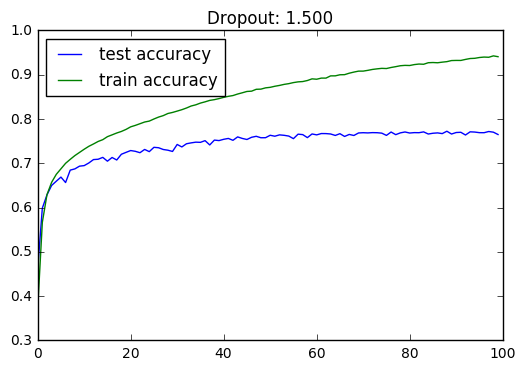

Train max accuracy:0.943
Test max accuracy:0.772


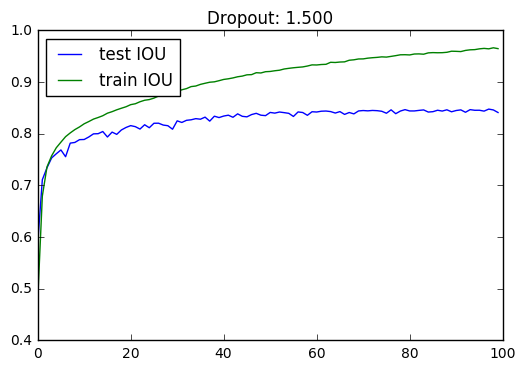

Train max IOU:0.966
Test max IOU:0.848


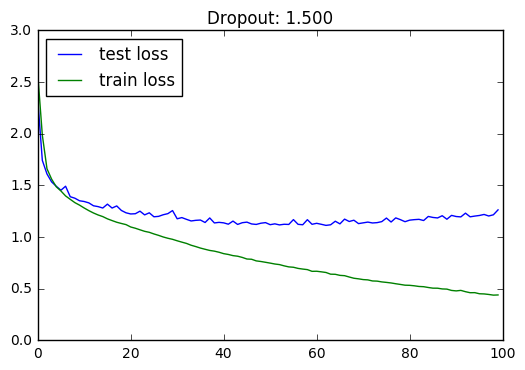

Train min loss:0.439
Test min loss:1.113
---------------------------------------------------------------------------------------------------- 



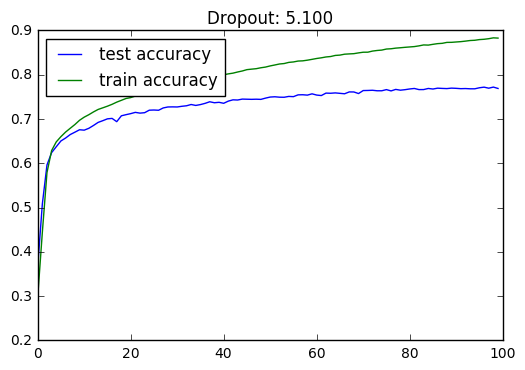

Train max accuracy:0.883
Test max accuracy:0.772


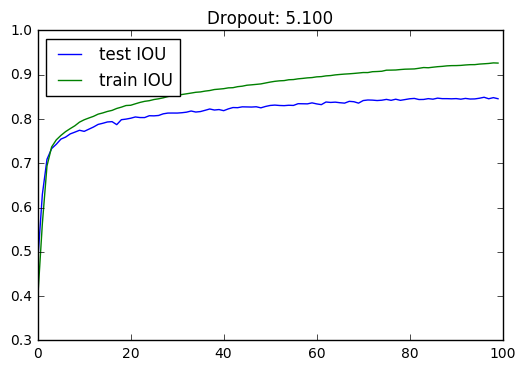

Train max IOU:0.927
Test max IOU:0.849


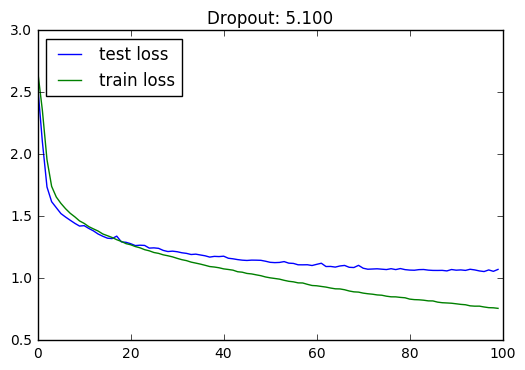

Train min loss:0.759
Test min loss:1.056
---------------------------------------------------------------------------------------------------- 



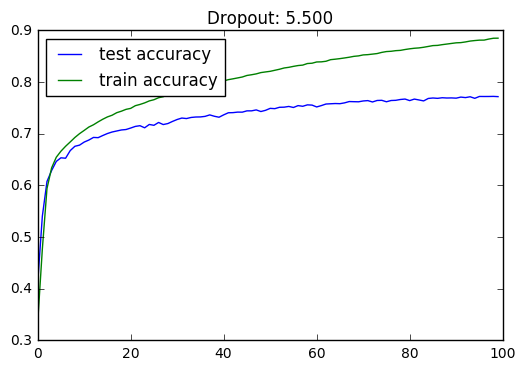

Train max accuracy:0.885
Test max accuracy:0.772


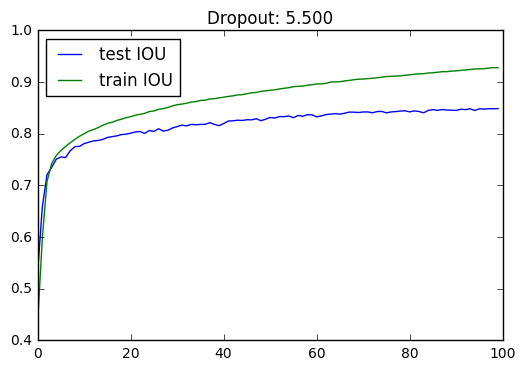

Train max IOU:0.928
Test max IOU:0.849


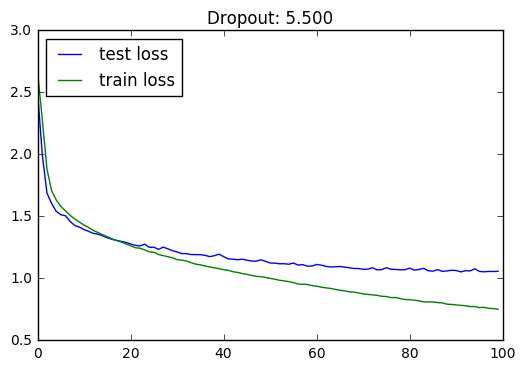

Train min loss:0.752
Test min loss:1.053
---------------------------------------------------------------------------------------------------- 



In [19]:
stats(sc_drop_tst, sc_drop_trn, ephocs=100, title='Dropout', params=[1.5, 5.1, 5.5])

In [22]:
# Best
arr = []
for j, drops in enumerate([[1., 0.5], [0.5, 1.], [0.5, 0.5]]):
    arr.append([drops[0], 
                drops[1],
                num_hidden,
                max(np.array(sc_drop_tst[j])[:,0]), 
                max(np.array(sc_drop_trn[j])[:,0]), 
                max(np.array(sc_drop_tst[j])[:,1]), 
                max(np.array(sc_drop_trn[j])[:,1]), 
                max(np.array(sc_drop_tst[j])[:,2]), 
                max(np.array(sc_drop_trn[j])[:,2])])
print(tabulate(arr, tablefmt='fancy_grid', headers=[' Drop in', 'Drop out', 'Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss']))

╒════════════╤════════════╤══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│    Drop in │   Drop out │   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞════════════╪════════════╪══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│        1   │        0.5 │          200 │        0.772407 │         0.942576 │   0.847761 │    0.966431 │     2.34563 │      2.58868 │
├────────────┼────────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│        0.5 │        1   │          200 │        0.772104 │         0.8833   │   0.849108 │    0.926717 │     2.55566 │      2.6729  │
├────────────┼────────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│        0.5 │        0.5 │          200 │      

## Q inputs dropouts

In [9]:
edit_reward=0
num_hidden = 200
dropouts = [[1., 0.5], [0.5, 1.], [0.5, 0.5]]
sc_drop_tst, sc_drop_trn = [], []

for drop in dropouts:
    params_dir = params_dir_tmp+'RL/EXP/sc1_drop_q:'+str(drop[0])+'_sc_drop_im:'+str(drop[1])+'_sc_drop_hidden:'+str(num_hidden)
    tf.reset_default_graph()
    m = Model(
        batch_size=200, 
        num_hidden=num_hidden,
        embed_size=embed_vecs.shape[1],
        img_dims=trainset[0][0][1][0].shape[1], 
        bbox_dims=trainset[0][0][1][1].shape[1], 
        lr=.05,
        vocab=vocab, 
        decay_steps=10000, 
        decay_rate=0.9, 
        coefAlr=1,
        bnorm=False,
        toQscale=0.5
    )

    print('drop_q:', drop[0])
    print('drop_img:', drop[1])
    print('edit_reward:', edit_reward)
    print('params_dir:', params_dir)
    print('num_hidden:', m.num_hidden)
    print('learning rate:', m.lr)
    tst, trn, _, _ = m.train(trainset, testset,
            ephocs_num=100,
            start_ephoc=0,
            startA=101,
            activation_ephoc=101,
            muteB=2, 
            editProb=0.8,
            edit_reward=edit_reward,
            rnn_editProb=0.2,
            onlyB=True,
            dropout_in=0.5,
            dropout_out=1.,
            dropout_q=drop[0],
            dropout_img=drop[1],
            imScale=0.02)

    sc_drop_tst.append(tst)
    sc_drop_trn.append(trn)

    print('\n'+'*'*100)
    print('*'*100)
    print('*'*100,'\n')     

drop_q: 1.0
drop_img: 0.5
edit_reward: 0
params_dir: ../data/training/models/All/RL/EXP/sc1_drop_q:1.0_sc_drop_im:0.5_sc_drop_hidden:200
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.499 ;acc:0.150 ;iou:0.240 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:2.867 ;acc:0.170 ;iou:0.220 ;time: 0:00:08
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:2.485 ;acc:0.215 ;iou:0.295 ;time: 0:00:15
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:1.373 ;acc:0.695 ;iou:0.795 ;time: 0:00:23
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.488 ;acc:0.295 ;iou:0.345 ;time: 0:00:30
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:3.112 ;acc:0.210 ;iou:0.280 ;time: 0:00:37

*Training B: True ;B Train loss: 2.698 ;Train accuracy: 0.268 ;IOU accuracy: 0.361 ;Time: 0:00:44 

Testing, ephoc: 0
batch: 0 ;B loss: 1.336 ;a

In [10]:
np.save(open('../data/training/results/sc1_qim_drop_tst.bin', 'wb'), sc_drop_tst)
np.save(open('../data/training/results/sc1_qim_drop_trn.bin', 'wb'), sc_drop_trn)

In [60]:
arr = []
for j, drops in enumerate([[1., 0.5], [0.5, 1.], [0.5, 0.5]]):
    arr.append([drops[0], 
                drops[1],
                num_hidden, 
                max(np.array(sc_drop_tst[j])[:,0]), 
                max(np.array(sc_drop_trn[j])[:,0]), 
                max(np.array(sc_drop_tst[j])[:,1]), 
                max(np.array(sc_drop_trn[j])[:,1]), 
                min(np.array(sc_drop_tst[j])[:,2]), 
                min(np.array(sc_drop_trn[j])[:,2])])
print(tabulate(arr, tablefmt='fancy_grid', headers=['Drop q', 'Drop im',  'Hidden Dim', 'Test Accuracy', 'Train Accuracy', 'Test IOU', 'Train IOU', 'Test Loss',  'Train Loss']))

╒══════════╤═══════════╤══════════════╤═════════════════╤══════════════════╤════════════╤═════════════╤═════════════╤══════════════╕
│   Drop q │   Drop im │   Hidden Dim │   Test Accuracy │   Train Accuracy │   Test IOU │   Train IOU │   Test Loss │   Train Loss │
╞══════════╪═══════════╪══════════════╪═════════════════╪══════════════════╪════════════╪═════════════╪═════════════╪══════════════╡
│      1   │       0.5 │           50 │        0.702997 │         0.771549 │   0.796498 │    0.848586 │     1.29047 │      1.0396  │
├──────────┼───────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│      0.5 │       1   │           50 │        0.741616 │         0.823367 │   0.828199 │    0.888805 │     1.18602 │      1.00143 │
├──────────┼───────────┼──────────────┼─────────────────┼──────────────────┼────────────┼─────────────┼─────────────┼──────────────┤
│      0.5 │       0.5 │           50 │        0.664663 │         0.7

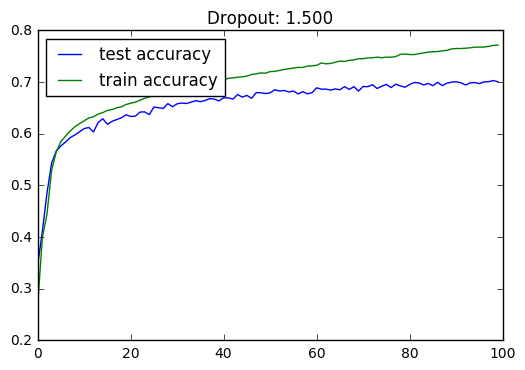

Train max accuracy:0.772
Test max accuracy:0.703


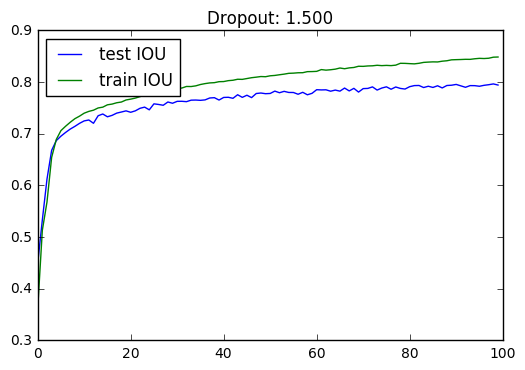

Train max IOU:0.849
Test max IOU:0.796


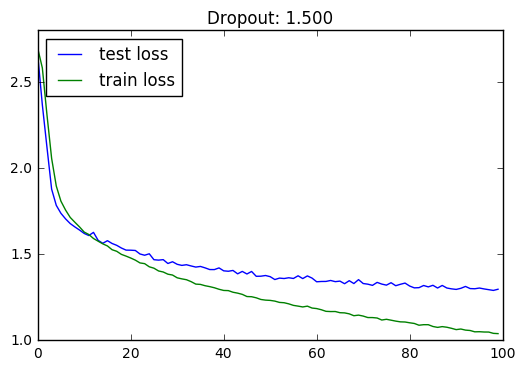

Train min loss:1.040
Test min loss:1.290
---------------------------------------------------------------------------------------------------- 



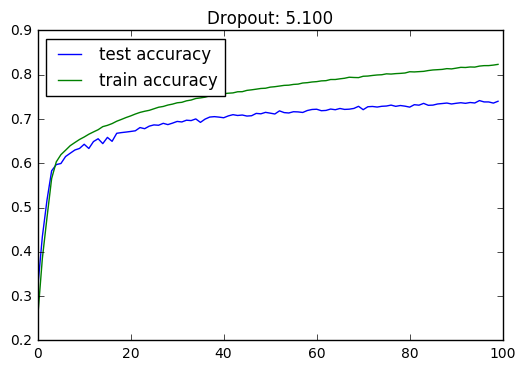

Train max accuracy:0.823
Test max accuracy:0.742


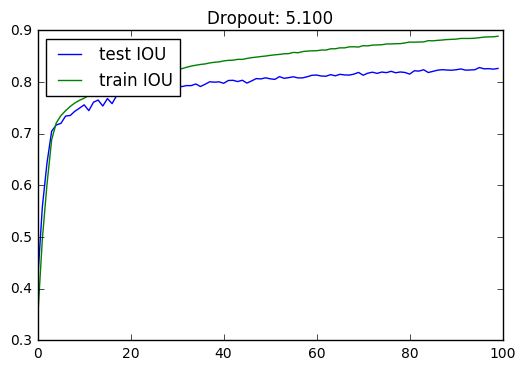

Train max IOU:0.889
Test max IOU:0.828


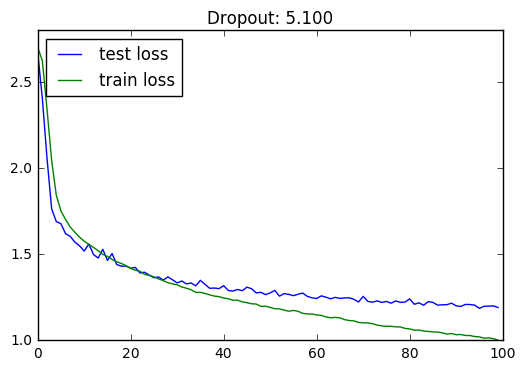

Train min loss:1.001
Test min loss:1.186
---------------------------------------------------------------------------------------------------- 



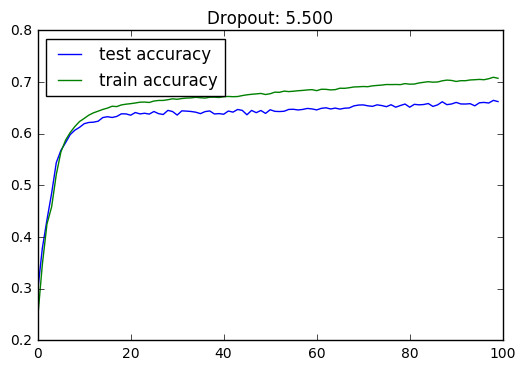

Train max accuracy:0.709
Test max accuracy:0.665


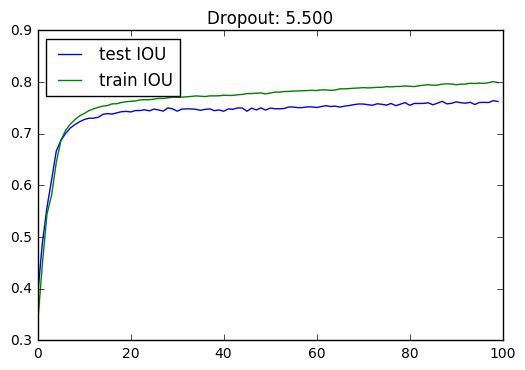

Train max IOU:0.801
Test max IOU:0.764


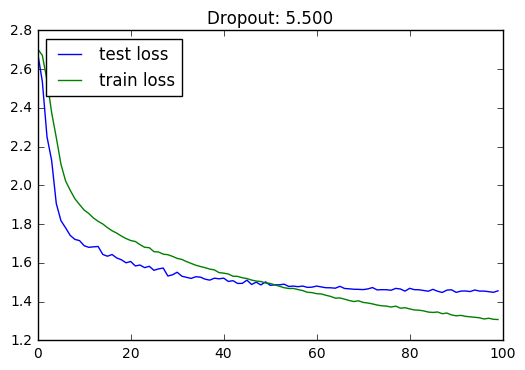

Train min loss:1.308
Test min loss:1.448
---------------------------------------------------------------------------------------------------- 



In [11]:
stats(sc_drop_tst, sc_drop_trn, ephocs=100, title='Dropout', params=[1.5, 5.1, 5.5])

## Normalization & Attention

In [22]:
edit_reward=0
num_hidden = 200
scAttn_tst, scAttn_trn = [], []


params_dir = params_dir_tmp+'RL/EXP/scAttn_hidden:'+str(num_hidden)
tf.reset_default_graph()
m = Model(
    batch_size=200, 
    num_hidden=num_hidden,
    embed_size=embed_vecs.shape[1],
    img_dims=trainset[0][0][1][0].shape[1], 
    bbox_dims=trainset[0][0][1][1].shape[1], 
    lr=.05,
    vocab=vocab, 
    decay_steps=10000, 
    decay_rate=0.9, 
    coefAlr=1,
    bnorm=False,
    toQscale=0.5,
    use_wordAttn=True
)

print('params_dir:', params_dir)
print('drop_in:', drop[0])
print('drop_out:', drop[1])
print('num_hidden:', m.num_hidden)
print('learning rate:', m.lr)
tst, trn, _, _ = m.train(trainset, testset,
        ephocs_num=100,
        start_ephoc=0,
        startA=101,
        activation_ephoc=101,
        muteB=2, 
        editProb=0.8,
        edit_reward=edit_reward,
        dropout_in=0.5,
        dropout_out=1.,
        rnn_editProb=0.2,
        onlyB=True,
        imScale=0.02)

scAttn_tst.append(tst)
scAttn_trn.append(trn)

print('\n'+'*'*100)
print('*'*100)
print('*'*100,'\n')     

params_dir: ../data/training/models/All/RL/EXP/scAttn_hidden:200
drop_in: 0.5
drop_out: 1.0
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:2.703 ;acc:0.170 ;iou:0.260 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.591 ;acc:0.060 ;iou:0.160 ;time: 0:00:10
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.004 ;acc:0.160 ;iou:0.225 ;time: 0:00:20
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:2.219 ;acc:0.410 ;iou:0.495 ;time: 0:00:30
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:2.207 ;acc:0.450 ;iou:0.575 ;time: 0:00:39
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:1.837 ;acc:0.555 ;iou:0.675 ;time: 0:00:50

*Training B: True ;B Train loss: 2.684 ;Train accuracy: 0.284 ;IOU accuracy: 0.376 ;Time: 0:01:00 

Testing, ephoc: 0
batch: 0 ;B loss: 1.300 ;acc: 0.710 ;iou_acc: 0.815 ;time: 0:01:00
batc

In [23]:
np.save(open('../data/training/results/scAttn1_tst.bin', 'wb'), scAttn_tst)
np.save(open('../data/training/results/scAttn1_trn.bin', 'wb'), scAttn_trn)

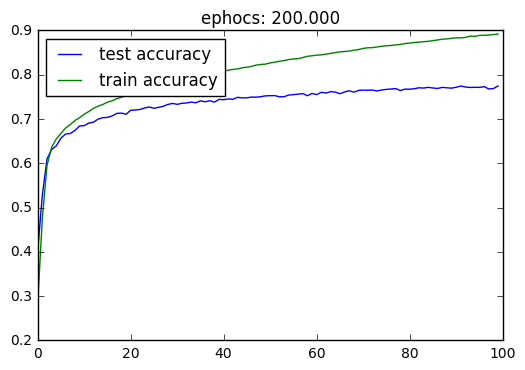

Train max accuracy:0.892
Test max accuracy:0.775


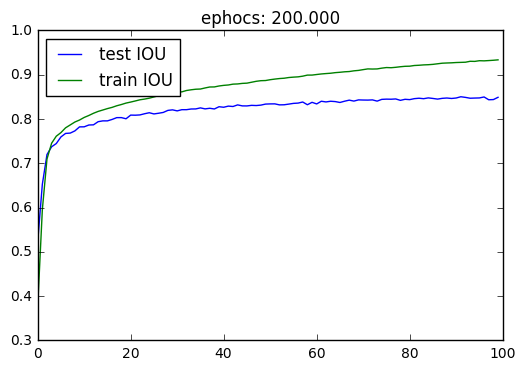

Train max IOU:0.934
Test max IOU:0.850


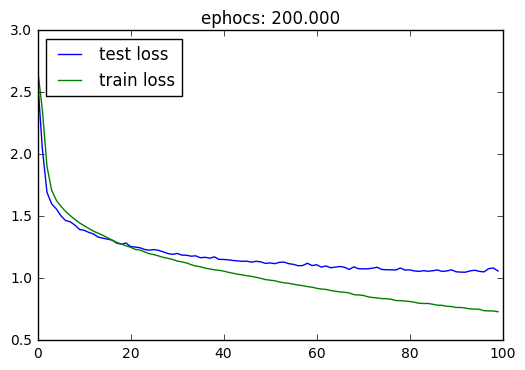

Train min loss:0.731
Test min loss:1.050
---------------------------------------------------------------------------------------------------- 



In [79]:
stats(scAttn_tst, scAttn_trn, ephocs=100,title='ephocs', params=[200])

In [25]:
edit_reward=0
num_hidden = 200
scBi_tst, scBi_trn = [], []


params_dir = params_dir_tmp+'RL/EXP/scBi_hidden:'+str(num_hidden)
tf.reset_default_graph()
m = Model(
    batch_size=200, 
    num_hidden=num_hidden,
    embed_size=embed_vecs.shape[1],
    img_dims=trainset[0][0][1][0].shape[1], 
    bbox_dims=trainset[0][0][1][1].shape[1], 
    lr=.05,
    vocab=vocab, 
    decay_steps=10000, 
    decay_rate=0.9, 
    coefAlr=1,
    bnorm=False,
    toQscale=0.5,
    useBidirectionalRnn=True
)

print('params_dir:', params_dir)
print('num_hidden:', m.num_hidden)
print('learning rate:', m.lr)
tst, trn = m.train(trainset, testset,
        ephocs_num=100,
        start_ephoc=0,
        startA=101,
        activation_ephoc=101,
        muteB=2, 
        editProb=0.8,
        edit_reward=edit_reward,
        dropout_in=0.5,
        dropout_out=1.,
        rnn_editProb=0.2,
        onlyB=True,
        imScale=0.02)

scBi_tst.append(tst)
scBi_trn.append(trn)

print('\n'+'*'*100)
print('*'*100)
print('*'*100,'\n')     

params_dir: ../data/training/models/All/RL/EXP/scBi_hidden:200
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:3.597 ;acc:0.070 ;iou:0.150 ;time: 0:00:01
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:3.342 ;acc:0.065 ;iou:0.190 ;time: 0:00:09
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:3.236 ;acc:0.130 ;iou:0.180 ;time: 0:00:18
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:2.466 ;acc:0.405 ;iou:0.455 ;time: 0:00:28
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:1.800 ;acc:0.680 ;iou:0.760 ;time: 0:00:36
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.565 ;acc:0.430 ;iou:0.535 ;time: 0:00:45

*Training B: True ;B Train loss: 2.650 ;Train accuracy: 0.340 ;IOU accuracy: 0.442 ;Time: 0:00:53 

Testing, ephoc: 0
batch: 0 ;B loss: 1.194 ;acc: 0.695 ;iou_acc: 0.815 ;time: 0:00:53
batch: 50 ;B loss: 1.874 ;acc: 0.

In [26]:
np.save(open('../data/training/results/scBi_tst.bin', 'wb'), scBi_tst)
np.save(open('../data/training/results/scBi_trn.bin', 'wb'), scBi_trn)

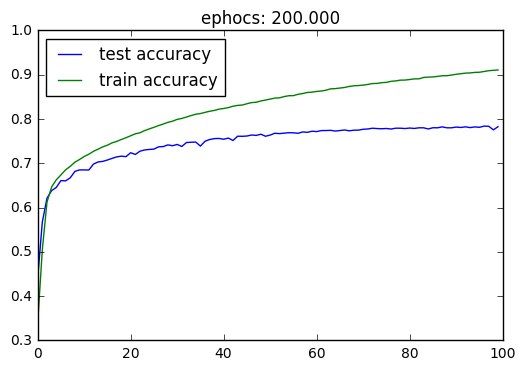

Train max accuracy:0.911
Test max accuracy:0.784


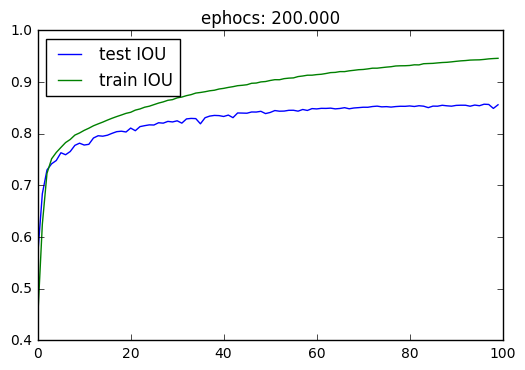

Train max IOU:0.946
Test max IOU:0.857


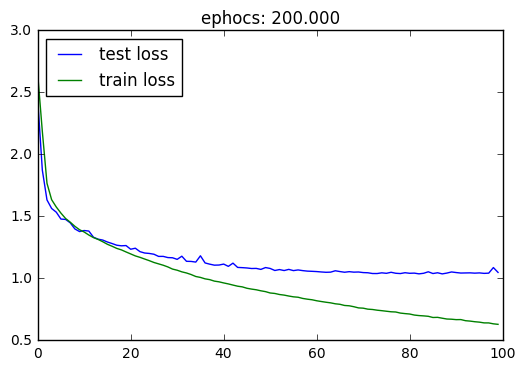

Train min loss:0.630
Test min loss:1.037
---------------------------------------------------------------------------------------------------- 



In [27]:
stats(scBi_tst, scBi_trn, ephocs=100,title='ephocs', params=[200])

## Attention & bidirection

In [10]:
edit_reward=0
num_hidden = 200
scBiAttn_tst, scBiAttn_trn = [], []


params_dir = params_dir_tmp+'RL/EXP/scBiAttn2_hidden:'+str(num_hidden)
tf.reset_default_graph()
m = Model(
    batch_size=200, 
    num_hidden=num_hidden,
    embed_size=embed_vecs.shape[1],
    img_dims=trainset[0][0][1][0].shape[1], 
    bbox_dims=trainset[0][0][1][1].shape[1], 
    lr=.05,
    vocab=vocab, 
    decay_steps=10000, 
    decay_rate=0.9, 
    coefAlr=1,
    bnorm=False,
    toQscale=0.5,
    useBidirectionalRnn=True,
    use_wordAttn=True
)

print('params_dir:', params_dir)
print('num_hidden:', m.num_hidden)
print('learning rate:', m.lr)
tst, trn, _, _ = m.train(trainset, testset,
        ephocs_num=100,
        start_ephoc=0,
        startA=101,
        activation_ephoc=101,
        muteB=2, 
        editProb=0.8,
        edit_reward=edit_reward,
        dropout_in=0.5,
        dropout_out=1.,
        rnn_editProb=0.2,
        onlyB=True,
        imScale=0.02)

scBiAttn_tst.append(tst)
scBiAttn_trn.append(trn)

print('\n'+'*'*100)
print('*'*100)
print('*'*100,'\n')     

params_dir: ../data/training/models/All/RL/EXP/scBiAttn2_hidden:200
num_hidden: 200
learning rate: 0.05
# Train set size: 297
# Training batches: 297
# Test set size: 297
# Testing batches: 297
Initializing variables
Train, ephoc: 0 ; Training B: True
Edit:False ;batch:0 ;gs:1 ;lr:0.050 ;Bloss:1.901 ;acc:0.385 ;iou:0.470 ;time: 0:00:00
Edit:False ;batch:50 ;gs:51 ;lr:0.050 ;Bloss:2.242 ;acc:0.300 ;iou:0.400 ;time: 0:00:16
Edit:False ;batch:100 ;gs:101 ;lr:0.050 ;Bloss:2.688 ;acc:0.265 ;iou:0.325 ;time: 0:00:32
Edit:False ;batch:150 ;gs:151 ;lr:0.050 ;Bloss:3.651 ;acc:0.070 ;iou:0.150 ;time: 0:00:46
Edit:False ;batch:200 ;gs:201 ;lr:0.050 ;Bloss:3.176 ;acc:0.325 ;iou:0.465 ;time: 0:01:01
Edit:False ;batch:250 ;gs:251 ;lr:0.050 ;Bloss:2.345 ;acc:0.520 ;iou:0.625 ;time: 0:01:16

*Training B: True ;B Train loss: 2.650 ;Train accuracy: 0.340 ;IOU accuracy: 0.443 ;Time: 0:01:30 

Testing, ephoc: 0
batch: 0 ;B loss: 1.174 ;acc: 0.715 ;iou_acc: 0.815 ;time: 0:01:31
batch: 50 ;B loss: 1.863 ;ac

In [11]:
np.save(open('../data/training/results/scBiAttn_tst.bin', 'wb'), scBiAttn_tst)
np.save(open('../data/training/results/scBiAttn_trn.bin', 'wb'), scBiAttn_trn)

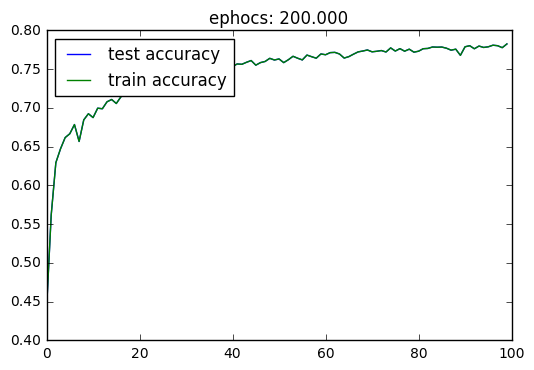

Train max accuracy:0.783
Test max accuracy:0.783


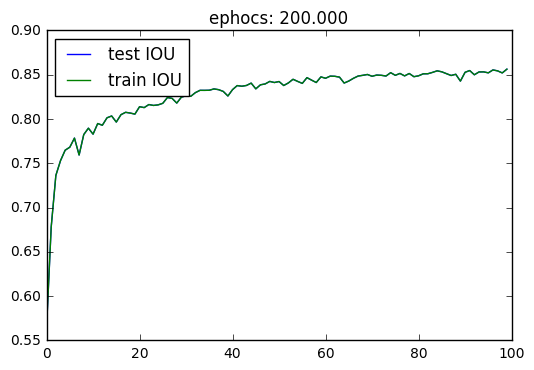

Train max IOU:0.856
Test max IOU:0.856


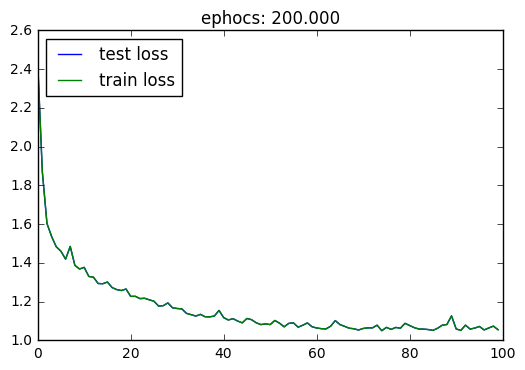

Train min loss:1.050
Test min loss:1.050
---------------------------------------------------------------------------------------------------- 



In [12]:
stats(scBiAttn_tst, scBiAttn_tst, ephocs=100,title='ephocs', params=[200])